<a href="https://colab.research.google.com/github/yegor-vynokurov/check-pronounce/blob/main/Accuracy_of_pronounciation_en.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Accuracy of pronounciation

**Goal**: to create a neural network that recognizes the sounds of English speech and evaluates the quality of pronunciation.

**Purpose**: using examples of the diphthong [ai] to get the most possible significant differences.

**Method**: combination of classifier and autoencoder.

For the classifier, a training set of 120 words with diphthongs [ai] was used:

https://drive.google.com/drive/folders/1aZiFBwX3g_dXOtEEYm4OtYBl1Ye9PoLw?usp=sharing

Classification accuracy was evaluated on a test set of 30 words:

https://drive.google.com/drive/folders/1ITDfdmTzVprr7-d57P81gSNFZVYYhRmq?usp=sharing

The selected sounds [ai] from the training sample were used to train the autoencoder.

yTrain, yTest were collected in a semi-automatic mode: an audio recording was listened to, places where the required sound was present were marked, marks were added to the list. The program, in accordance with the labels, created the correct answers and cut the sounds for the autoencoder.

The words are collected from the site https://ru.forvo.com, where native speakers voice the words. Words were selected only with a positive index for those who voiced.

# Functions

In [ ]:
# Функция параметризации аудио
def get_features_2d(y, sr, n_fft):
  '''
  function convert audio to parameters
  input
    y,sr from audio from toTakeRawAudio() function, n_ftt 511 - for human speach
  outputs
    parameters of audio like stft, mfcc etc
  '''
  # Получаем различные параметры аудио
  stft = librosa.stft(y, n_fft = n_fft, hop_length = n_fft) # 511 - for human speach
  stft = librosa.amplitude_to_db(abs(stft))
  mfcc = librosa.feature.mfcc(y=y, sr=sr, n_fft = n_fft, hop_length = n_fft, n_mfcc=40) 
  #mfcc = sklearn.preprocessing.scale(mfcc, axis=1)
  chroma_stft = librosa.feature.chroma_stft(y=y, sr=sr)     # Частота цветности
  chromagram = librosa.feature.chroma_cqt(y = y, sr=sr)
  
  rmse = librosa.feature.rms(y=y)                          # Среднеквадратичная амплитуда
  spec_cent = librosa.feature.spectral_centroid(y=y, sr=sr) # Спектральный центроид
  spectral_rolloff = librosa.feature.spectral_rolloff(y, sr=sr, roll_percent=0.85) # спектральный спад частоты
  #zero_crossings = librosa.zero_crossings(y, pad=False) # переходы через 0 # , zero_crossings
  
  # Возвращаем получившийся список
  return stft, mfcc, chroma_stft, chromagram, rmse, spec_cent, spectral_rolloff


In [ ]:
# Функция параметризации аудио
def get_features_2d(y, sr, n_fft):
  '''
  function convert audio to parameters
  input
    y,sr from audio from toTakeRawAudio() function, n_ftt 511 - for human speach
  outputs
    parameters of audio like stft, mfcc etc
  '''
  # Получаем различные параметры аудио
  stft = librosa.stft(y, n_fft = n_fft, hop_length = n_fft) # 511 - for human speach
  stft = librosa.amplitude_to_db(abs(stft))
  mfcc = librosa.feature.mfcc(y=y, sr=sr, n_fft = n_fft, hop_length = n_fft, n_mfcc=40) 
  #mfcc = sklearn.preprocessing.scale(mfcc, axis=1)
  chroma_stft = librosa.feature.chroma_stft(y=y, sr=sr)     # Частота цветности
  chromagram = librosa.feature.chroma_cqt(y = y, sr=sr)
  
  rmse = librosa.feature.rms(y=y)                          # Среднеквадратичная амплитуда
  spec_cent = librosa.feature.spectral_centroid(y=y, sr=sr) # Спектральный центроид
  spectral_rolloff = librosa.feature.spectral_rolloff(y, sr=sr, roll_percent=0.85) # спектральный спад частоты
  #zero_crossings = librosa.zero_crossings(y, pad=False) # переходы через 0 # , zero_crossings
  
  # Возвращаем получившийся список
  return stft, mfcc, chroma_stft, chromagram, rmse, spec_cent, spectral_rolloff


In [ ]:
# Функция параметризации аудио; без mfcc, stft
def get_features_2d2(y, sr):
  '''
  function convert audio to parameters
  input
    y,sr from audio from toTakeRawAudio() function, n_ftt 511 - for human speach
  outputs
    parameters of audio like stft, mfcc etc
  '''

  chroma_stft = librosa.feature.chroma_stft(y=y, sr=sr,n_fft = 511, hop_length = 511)     # Частота цветности
  chromagram = librosa.feature.chroma_cqt(y = y, sr=sr)
  
  rmse = librosa.feature.rms(y=y)                          # Среднеквадратичная амплитуда
  spec_cent = librosa.feature.spectral_centroid(y=y, sr=sr) # Спектральный центроид
  spectral_rolloff = librosa.feature.spectral_rolloff(y, sr=sr, roll_percent=0.85) # спектральный спад частоты
  zero_crossings = librosa.zero_crossings(y, pad=False) # переходы через 0
  
  # Возвращаем получившийся список
  return chroma_stft, chromagram, rmse, spec_cent, spectral_rolloff, zero_crossings


In [ ]:
def toTakeRawAudio(directory = r'/content/drive/MyDrive/dz/pronounce/I/'):
  '''
  function prepared array of raw audio from directory
  input
    directory
  output
    y,sr from audio for get_features_2d(function)
  '''
  audio = []
  for file in sorted(os.listdir(directory)):
    if file.endswith('.mp3') or file.endswith('.wav'):  
      original_path = directory + file
      y, sr = librosa.load(original_path, mono=True) 
      audio.append(y)
  return audio

In [ ]:
def toTakeRawAudio(directory = r'/content/drive/MyDrive/dz/pronounce/I/'):
  '''
  function prepared array of raw audio from directory
  input
    directory
  output
    y,sr from audio for get_features_2d(function)
  '''
  audio = []
  for file in sorted(os.listdir(directory)):
    try:
      if file.endswith('.mp3') or file.endwith('.wav'):  
        original_path = directory + file
        y, sr = librosa.load(original_path, mono=True) 
        audio.append(y)
    except:
      print('it is no file')
  return audio

In [ ]:
def analyze(arr, startend, sr):
  '''
  function convert list of time in single sounds and yTrain or yTest
  input
      take an audio from toTakeRawAudio() and an array like [[532,1024],[123, 215]...], 
      when startend[i][0] is a start of sound, and startend[i][1] is an end of sound
  and return 
      list with time-sections of target sounds (f.e. [ai], [f], [ae]) for training of first stage of sound-analyze
      array with yTrain or yTest that contains 1 where in the audio we have target sound
  '''
  y = []
  sounds = []
  for i in range(len(arr)):
    a = int((startend[i][0] / 1000) * sr) # take a start of target sound
    b = int((startend[i][1] / 1000) * sr) # take an end of target sound
    y.append(np.zeros_like(arr[i]))
    sounds.append(arr[i][a:b])
    y[i][a:b] = [1 for x in y[i][a:b]] # exchange 0 to 1 where we have a target sound
  return sounds, y

In [ ]:
def toTakeRawSpectors(yTrain, n_fft = n_fft, directory = r'/content/drive/MyDrive/dz/pronounce/i_common_train/'):
  '''
  funciton take parameters of audio and form it in xTrain, xTest
  '''
  X_train_stft = []
  X_train_mfcc = []
  X_train_chroma_stft = []
  X_train_chromagram = []

  X_train_rmse = []
  X_train_spec_cent = []
  X_train_spectral_rolloff = []
  #X_train_zero_crossings = []

  ytr = [] # for a labels that marks track by track
  
  for file in sorted(os.listdir(directory)):
    if file.endswith('.mp3') or file.endwith('.wav'):  
      original_path = directory + file
  
      y, sr = librosa.load(original_path, mono=True) 
    
      stft, mfcc, chroma_stft, chromagram, rmse, spec_cent, spectral_rolloff = get_features_2d(y, sr, n_fft) # take a spectors
      X_train_stft.extend(stft.T)
      X_train_mfcc.extend(mfcc.T)
      X_train_chroma_stft.extend(chroma_stft.T)
      X_train_chromagram.extend(chromagram.T)
      X_train_rmse.extend(rmse.T)
      X_train_spec_cent.extend(spec_cent.T)
      X_train_spectral_rolloff.extend(spectral_rolloff.T)
      #X_train_zero_crossings.extend((zero_crossings.T).astype(int)) # np.array(X_train_zero_crossings), 
      ytr.append(len(mfcc[0]))
   
  return np.array(X_train_stft), np.array(X_train_mfcc), \
         np.array(X_train_chroma_stft), np.array(X_train_chromagram), \
         np.array(X_train_rmse), np.array(X_train_spec_cent), \
         np.array(X_train_spectral_rolloff), np.array(ytr)

In [ ]:
def toTakeRawSounds(sounds, n_fft = n_fft, sr = sr):
  '''
  funciton take parameters from sounds for autoencoders
  '''
  stft_ = []
  mfcc_ = []
  chroma_stft_ = []
  chromagram_ = []

  rmse_ = []
  spec_cent_ = []
  spectral_rolloff_ = []

  ytr = [] # for a labels that marks track by track
  
  for i in range(len(sounds)):
    y = sounds[i] 
    stft = librosa.stft(y, n_fft = n_fft, hop_length = n_fft) # 511 - for human speach
    stft = librosa.amplitude_to_db(abs(stft))
    stft_.extend(stft.T)
  
    
    mfcc = librosa.feature.mfcc(y=y, sr=sr, n_fft = n_fft, hop_length = n_fft, n_mfcc=40) 
    mfcc_.extend(mfcc.T)

    chroma_stft = librosa.feature.chroma_stft(y=y, sr=sr)     # Частота цветности
    chroma_stft_.extend(chroma_stft.T)

    chromagram = librosa.feature.chroma_cqt(y = y, sr=sr)
    chromagram_.extend(chromagram.T)
  
    rmse = librosa.feature.rms(y=y)                          # Среднеквадратичная амплитуда
    rmse_.extend(rmse.T)


    spec_cent = librosa.feature.spectral_centroid(y=y, sr=sr) # Спектральный центроид
    spec_cent_.extend(spec_cent.T)
    
    spectral_rolloff = librosa.feature.spectral_rolloff(y, sr=sr, roll_percent=0.85)
    spectral_rolloff_.extend(spectral_rolloff.T)

    lasts = np.hstack((chroma_stft_, chromagram_, rmse_, spec_cent_, spectral_rolloff_))

    ytr.append(len(mfcc[0]))

  return np.array(stft_), np.array(mfcc_), np.array(lasts)#, np.array(ytr)

In [ ]:
def shortY(y, n_fft):
  '''
  function convert len(yTest) or len(yTrain) to len(yTrain) = len(stft) 
  inputs:
    long yTrain or yTest
    n_ftt - frame for shorting
  outputs:
    array that have same lenght, like length of spectors
  '''
  yLittle = []
  for i in range(len(y)):
    k = y[i][[x for x in range(0, y[i].shape[0], n_fft)]] # take each n_ftt's element of y

    yLittle.extend(k.T)
  return np.array(yLittle)

In [ ]:
def longY(y, n_fft):
  '''
  function convert len(yTest) or len(yTrain) to len(yTrain) = len(stft) 
  '''
  yLong = []
  for i in range(len(y)):
    yLong.extend(y[i].T)
  return np.array(yLong)

In [ ]:
def scal(x):
  '''
  normalize of xTrain, xTest
  '''
  scaler = StandardScaler()

  return scaler.fit_transform(x)

In [ ]:
def scalMM(x):
  '''
  normalize of xTrain, xTest
  '''
  scaler = MinMaxScaler()

  return scaler.fit_transform(x)

In [ ]:
def plotCompare(yTrue, yPred, lstTime):
  '''
  function compare plots of yTrue and yPred based on lstTime from toTakeRawSpectors()
  '''
  sum = 0
  for i in range(len(lstTime)):
    plt.plot(yPred[sum:sum + lstTime[i]+1], label = 'pred data')
    plt.plot(yTrue[sum:sum + lstTime[i]+1], label = 'true data')
    sum += lstTime[i]
    plt.legend()
    plt.show()

In [ ]:
def plotCompare3(yTrue, yPred, yPred_au, lstTime):
  '''
  function compare plots of yTrue and yPred based on lstTime from toTakeRawSpectors()
  '''
  sum = 0
  for i in range(len(lstTime)):
    plt.plot(yPred[sum:sum + lstTime[i]+1], label = 'pred data')
    plt.plot(yPred_au[sum:sum + lstTime[i]+1], label = 'ared data after au')
    plt.plot(yTrue[sum:sum + lstTime[i]+1], label = 'true data')
    
    sum += lstTime[i]
    plt.legend()
    plt.show()

In [ ]:
def mask(a, rate = 0.9):
  '''
  create a mask for train and validation sets for a autoencoders
  input: 
     a - an array that go to autoencoder
     rate - how much in train and in validation set
  output:
     masks for train and validation sets from a
  '''
  val_mask = np.random.sample(len(a))
  train_mask = val_mask < rate
  val_mask = val_mask >= rate
  return train_mask, val_mask

In [ ]:
def recognizeMerges(arr, bias = 0.05):
  '''
  function create array from 0 and 1, when 1 - is a True for recognised goal-sound
  inputs: 
    arr - yPred, array after predicting
    bias - probability of sounds: low - it is no goal-sound, hight - it is goal-sound
  output: 
    list from 0 and 1, when 1 - is a True for recognised goal-sound
  '''
  #lst = []
  merges = np.zeros_like(arr)
  for i in range(len(arr)):
    if arr[i] >= bias:
      merges[i] = 1
      #lst.append(arr[i])
  #return merges, lst
  return merges

In [ ]:
def fillOnes(arr):
  '''
  add 1 between 101 -> 111
  '''
  for i in range(len(arr)):
    if arr[i] != arr[-1]:
      if (arr[i+1] == 1 and arr[i-1] == 1) and arr[i] == 0:
        arr[i] = 1
  return arr

In [ ]:
def recognizeLimits(arr): 
  '''
  function create limits of predicted goal-sounds
  input: 
    arr - list from 0 and 1, when 1 - is a True for recognised goal-sound
  output: 
    list from start an stop indexes of pre-recognized sounds to extract goal-mfcc from xTest to autoencoder
  '''
  limits = []
  
  for i in range(len(arr)):
    if arr[i-1] == 0 and arr[i] == 1:
      limits.append(i)
      
    elif arr[i] == 1 and arr[i + 1] == 0:
      limits.append(i+1)
      #limits.append(i)
  lst = list(zip([x for x in limits[::2]], [y for y in limits[1::2]]))
  return np.array(lst)

In [ ]:
def getPlayer(track, start, stop, arr, n_fft = n_fft):
  '''
  function show player that can play places with predicted sounds
  input: 
    track - number of track from getSound()
    start - first of number of line from sounds from getSound()
    stop - second of number of line from sounds from getSound()
  output:
    player to listen to predicted sounds
  '''

  return ipd.Audio(arr[track][start:stop], rate = sr)

In [ ]:
def toCheck(test, limits):
  '''
  Function elect predicted places of spectors from xTest that similar to goal-sound
  input: 
    limits - start an stop indexes_by_start of pre-recognized sounds from recognizeProb()
    tests - xTest from normalize xTest, fragments of which will go to autoencoders
    
  output:
    fragments of xTest which predicted as goal-sounds
  '''
  toCheckTest = []
  #toCheckYTest = []
  #toCheckYPred = []
  #flatt = limits.flat[:]
  for i in range(len(limits)):
    m = test[limits[i,0]:limits[i,1]]
    #print(test[limits[i,0]], m)
    #m = yLittleTest[flatt[i]:flatt[i+1]]
  #  n = yPred[flatt[i]:flatt[i+1]]
  #  m = yPred[limits[i,0]:limits[i,1]]
    toCheckTest.extend(m)
  #  toCheckYTest.append(m)
  #  toCheckYPred.extend(n) # take only a goal-sounds
  #return np.array(toCheckTest), np.array(toCheckYTest), np.array(toCheckYPred)
  return np.array(toCheckTest)#, np.array(toCheckYPred)

In [ ]:
def summaError(yTest, yPred, lstOfTime_test):
  '''
  check error
  input:
    yTest - true places with true-false marks
    yPred - predicted places with true-false marks from function oneLst() or recognizeMerges()
  output:
    tr - summa of true predicted
    notr - summa of false true predicted
  '''
  tr, notr, fal, nofal = 0,0,0,0
  trL, notrL, falL, nofalL = np.zeros_like(yTest),np.zeros_like(yTest),np.zeros_like(yTest),np.zeros_like(yTest)
  for i in range(len(yTest)):
    if yTest[i] == 1 and yPred[i] == 1:
      tr += 1
      trL[i] = 1
    elif yTest[i] == 0 and yPred[i] == 1:
      notr += 1
      notrL[i] = 1
    elif yTest[i] == 1 and yPred[i] == 0:
      fal += 1
      falL[i] = 1
    elif yTest[i] == 0 and yPred[i] == 0:
      nofal += 1
      nofalL[i] = 1

  sum = tr + nofal + notr + fal
  wwr = (tr + nofal) / sum 
  wer = (notr + fal) / sum
  acc = tr / (tr + notr)
  ful = tr / (tr + fal)
  Ff = 2 * ((acc * ful) / (acc + ful))
  print(f'realy true recognized sounds: {tr}')
  print(f'recognized like true, but is false sounds: {notr}')
  print(f'recognized like false, but is true sounds: {fal}')
  print(f'realy false recognized souns: {nofal}')
  print(f'Word Recognition Rate (to differ sounds by no-sounds): {wwr*100:.2f} %')
  print(f'Word Error Rate (to differ no-sounds by sounds): {wer*100:.2f} %')
  print(f'Accuracy (how model find a sounds): {acc:.2f}')
  print(f'Fullness (how model find a no-sounds): {ful:.2f}')
  print(f'Harmonical mean: {Ff:.2f}')
  return np.array((tr, notr, fal, nofal)), np.array((trL, notrL, falL, nofalL))

In [ ]:
def get_track(audio):
  '''
  функция распределяет номера треков
  вход - аудио, закачанное с помощью librosa
  выход: 
    список с номерами треков
  '''
  aa = []
  bb = []
  for i in range(len(audio)):
    for j in range(0,len(audio[i]),n_fft):
      aa.append(i)
  return aa

In [ ]:
def kum_sum_range(lst):
  '''
  функция формирует список с кумулятивной суммой, чтобы отнимать значения от 
  значений макс и мин границ звука, относительно не начала списка, а начала трека
  вход: 
     список с метками начала треков из функции getRowSpectors()
  выход: 
     numpy массив с кумулятивной суммой и нулём для первого значения
  '''
  kum = np.insert((np.cumsum(lst*n_fft)), 0,0) # на основе начала и конца треков
  return kum
# 

In [ ]:
def recognizeProb(arrY, arrOnes, arrTrack, kum): 
  '''
  function create limits of predicted goal-sounds
  input: 
    arr - yPred-like array in form of probability
    arrOnes - yPrel array in form of list from 0 and 1, when 1 - is a True for recognised goal-sound
    arrTrack - array, lenght = arrOnes, yPred - consist of numbers of tracks
  output: 
    list from start an stop indexes of pre-recognized sounds to extract goal-mfcc from xTest to autoencoder
  '''
  prob = [] # накапливаем вероятность
  s = 0 # для суммы вероятностей
  k = 0 # считаем количество вероятностей для поиска среднего
  mean_l = [] # накапливаем среднее
  ind_t = [] # накапливаем список индексов относительно начала каждого трека
  ind = [] # накапливаем текущий индекс, умноженный на n_fft
  indx = [] # накапливаем текущий индекс
  dorozhka = [] # для номеров треков напротив каждого звука
  ind_tot = [] # накапливаем список индексов относительно начала всей базы треков
  quant = [] # накапливаем количество единиц подряд для подсчёта выделенных для автокодировщика звуков
  
  for i in range(len(yPred)):
    
    if arrOnes[i] == 1: # если вероятность звука больше порога, то это целевой звук
      indx.append(i) # пополняем список индексами, где есть единицы
      ind.append(i*n_fft) # сразу превращаем индекс в формат для чтения аудио
      k += 1 # повышаем на 1 количество последовательных вероятностей
      s += arrY[i] # складываем соседние вероятности

    if arrOnes[i] == 1 and arrOnes[i + 1] == 0: # значит, целевой звук закончился
      dorozhka.append(arrTrack[i])
      #track2.append(arrTrack[i][1])
      quant.append(k) # пополняем список количеством единиц на выделенный звук
      mean = s/k # находим среднее
      mean_l.append(mean) # пополняем список средним значением
      prob.append(s) # пополняем список суммой вероятностей
      s = 0 # обнуляем сумму вероятностей
      k = 0 # обнуляем количество
      # пополняем список индексов минимальным индексом и максимальным - 
      # началом и концом распознанного звука и отнимаем кумулятивную сумму старта и стопа звука, 
      # чтобы получилось относительно начала трека, а не относительно начала списка
      ind_t.append([min(ind) - kum[arrTrack[i]], 
                    (((max(ind)+n_fft) - kum[arrTrack[i]]) if max(ind) == min(ind) 
                    else (max(ind) - kum[arrTrack[i]]))]) # +n_fft добавляем, если старт и стоп совпадают 
      #ind_tot.append([min(ind), # пополняем список индексов минимальным индексом и максимальным относительно начала всех треков
      #              ((max(ind)+n_fft) if max(ind) == min(ind) 
      #              else (max(ind)))])
      ind_tot.append([min(indx), # пополняем список индексов минимальным индексом и максимальным относительно начала всех треков
                    ((max(indx)+n_fft) if max(indx) == min(indx) 
                    else (max(indx)))])
      ind = [] # обновляем список индексов
      indx = []
  return np.array(prob), np.array(mean_l), ind_t, np.array(ind_tot), dorozhka, quant

In [ ]:
def check_to_numbers(clarity, lim):
  '''
  функция распределяет 
  lim - indexes_by_start массив индексов распознанных звуков по отношению к началу всех звуков 
  из функции recognizeProb()
  clarity - clarity_of_sounds, yPred-подобный массив вероятностей после анализа на чистоту звука на автоэнкодере
  '''
  prob = []
  kumm = np.insert(np.cumsum(lim), 0, 0)
  #print(len(kumm))
  for i in range(len(kumm[:-1])):
    z = sum(clarity[kumm[i]:kumm[i+1]])
    #print([kumm[i], kumm[i+1]], z)
    prob.append(z)

  return np.array(prob)


# Data loading

In [ ]:
audio = toTakeRawAudio(directory = r'/content/drive/MyDrive/dz/pronounce/i_common_train/')

In [ ]:
audio_test = toTakeRawAudio(directory = r'/content/drive/MyDrive/dz/pronounce/i_common_test/')

In [ ]:
sounds, yTrain = analyze(audio) 

In [ ]:
# time when we have sound [ai]
startend = [[284,515], [414,617], [400, 555],[0,0], [180,344], [289,470], [1255, 1383], 
            [511, 733], [315, 470], [354, 465], [461, 613], [332, 562], [3214,3371], 
            [60,160], [65,165], [347,470], [307,387], [911, 1147], [130, 314], 
            [630,857], [174,325], [600,820], [626,1000], [500,700], [150,290], 
            [110,270], [190,350], [1867,2096], [111,292], [1488,1626]]

In [ ]:
sounds_test, yTest = analyze(audio_test, startend, sr)

In [ ]:
k = int((2300 / 1000) * sr) # take a sample rates from time
k

In [ ]:
yTest[27][48730:50714] = 1 # assign 1 to sounds which not recognition in function analyze()

In [ ]:
being = [[3214,3371],[3516,3642]]
bite_sized = [[60,160],[357,484]]
by_the_right = [[347,470],[650,765],[936,1032],[2399,2522]]
daylight = [[307,387],[956,1100]]
we_mast = [[1867,2096],[2210,2300]]

In [ ]:
np.save('/content/drive/MyDrive/dz/pronounce/sounds_test.npy', sounds_test)

In [ ]:

np.save('/content/drive/MyDrive/dz/pronounce/yTest.npy', yTest)

In [ ]:
# list of examples for sounds_test
a = sorted(os.listdir('/content/drive/MyDrive/dz/pronounce/i_common_test/'))
for i in range(len(a)):
  print(i, a[i])

In [ ]:
np.save('/content/drive/MyDrive/dz/pronounce/audio.npy', audio)

In [ ]:
np.save('/content/drive/MyDrive/dz/pronounce/audio_test.npy', audio_test)


In [ ]:
np.save('/content/drive/MyDrive/dz/pronounce/sounds.npy', sounds)
np.save('/content/drive/MyDrive/dz/pronounce/yTrain.npy', yTrain)


In [ ]:
yLittle = []
for i in range(len(yTrain)):
  k = yTrain[i][[x for x in range(0, yTrain[i].shape[0], n_fft)]]
  #print(len(k))
  yLittle.extend(k.T)
yLittle = np.array(yLittle)

In [ ]:
np.save('/content/drive/MyDrive/dz/pronounce/yLittle.npy', yLittle) # 511 nfft

In [ ]:
np.save('/content/drive/MyDrive/dz/pronounce/yLittle255.npy', yLittle) # 255 nfft

In [ ]:
yLittleTest = shortY(yTest, n_fft = n_fft)

In [ ]:
yLittleTest.shape

In [ ]:
np.save('/content/drive/MyDrive/dz/pronounce/yLittleTest.npy', yLittleTest)# 511 nfft
 

In [ ]:
np.save('/content/drive/MyDrive/dz/pronounce/yLittleTest255.npy', yLittleTest) # 255 nfft


# data preparing

In [ ]:
audio = np.load('/content/drive/MyDrive/dz/pronounce/audio.npy', allow_pickle=True)

In [ ]:
audio_test = np.load('/content/drive/MyDrive/dz/pronounce/audio_test.npy', allow_pickle=True)


In [ ]:
yTrain = np.load('/content/drive/MyDrive/dz/pronounce/yTrain2.npy', allow_pickle=True)


In [ ]:
yTest = np.load('/content/drive/MyDrive/dz/pronounce/yTest.npy', allow_pickle=True)

In [ ]:
sounds = np.load('/content/drive/MyDrive/dz/pronounce/sounds4.npy', allow_pickle=True)

In [ ]:
sounds_test = np.load('/content/drive/MyDrive/dz/pronounce/sounds_test.npy', allow_pickle=True)

In [ ]:
yLittleTest = np.load('/content/drive/MyDrive/dz/pronounce/yLittleTest.npy', allow_pickle=True) #511

In [ ]:
yLittle = np.load('/content/drive/MyDrive/dz/pronounce/yLittle.npy', allow_pickle=True)# 511

In [ ]:
#yLittle = np.load('/content/drive/MyDrive/dz/pronounce/yLittle255.npy', allow_pickle=True) # 255

In [ ]:
#yLittleTest = np.load('/content/drive/MyDrive/dz/pronounce/yLittleTest255.npy', allow_pickle=True) # 255


In [ ]:
#X_train_mfcc_i = np.load('/content/drive/MyDrive/dz/pronounce/X_train_mfcc_255.npy', allow_pickle=True) # 255
#X_test_mfcc_i = np.load('/content/drive/MyDrive/dz/pronounce/X_test_mfcc_255.npy', allow_pickle=True) # 255

In [ ]:
# take spectors for xTest
X_test_stft_i, X_test_mfcc_i, X_test_chroma_stft_i, X_test_chromagram_i, \
X_test_rmse_i, X_test_spec_cent_i, X_test_spectral_rolloff_i, \
lstOfTime_test = toTakeRawSpectors(yTest,  directory = r'/content/drive/MyDrive/dz/pronounce/i_common_test/')

In [ ]:
# take spectors for xTrain
X_train_stft_i, X_train_mfcc_i, X_train_chroma_stft_i, X_train_chromagram_i, \
X_train_rmse_i, X_train_spec_cent_i, X_train_spectral_rolloff_i, \
lstOfTime = toTakeRawSpectors(yTrain, directory = r'/content/drive/MyDrive/dz/pronounce/i_common_train/')

In [ ]:
#TT = np.hstack((X_train_chroma_stft_i2, X_train_chromagram_i2, X_train_rmse_i2,X_train_spec_cent_i2,X_train_spectral_rolloff_i2))

In [ ]:
#TTest = np.hstack((X_train_chroma_stft_i_test, X_train_chromagram_i_test, X_train_rmse_i_test, X_train_spec_cent_i_test, X_train_spectral_rolloff_i_test))

In [ ]:
#np.save('/content/drive/MyDrive/dz/pronounce/X_train_mfcc_255.npy', X_train_mfcc_i)

In [ ]:
#np.save('/content/drive/MyDrive/dz/pronounce/X_test_mfcc_255.npy', X_test_mfcc_i)

In [ ]:
# to normalize a xTrain
train = scalMM(X_train_mfcc_i)

In [ ]:
# to normalize a xTest
test = scalMM(X_test_mfcc_i)

### производные train

In [ ]:
x_train_dif1 = np.diff(train, n = 1, axis = 0)

In [ ]:
x_train_dif1_2 = np.diff(train, n = 2, axis = 0)

In [ ]:
addd = np.reshape(x_train_dif1[0], (1, -1))

In [ ]:
x_train_dif1 = np.vstack((addd, x_train_dif1))
x_train_dif1.shape

(10350, 40)

In [ ]:
x_train_dif1_2 = np.vstack((addd, x_train_dif1_2))
x_train_dif1_2 = np.vstack((addd, x_train_dif1_2))
x_train_dif1_2.shape

(10350, 40)

In [ ]:
train_m = np.expand_dims(train, axis = 2)
train_m.shape

(10350, 40, 1)

In [ ]:
x_train_dif1 = np.expand_dims(x_train_dif1, axis = 2)
x_train_dif1.shape

(10350, 40, 1)

In [ ]:
x_train_dif1_2 = np.expand_dims(x_train_dif1_2, axis = 2)
x_train_dif1_2.shape

(10350, 40, 1)

In [ ]:
#x_train_dif1_2 = np.squeeze(x_train_dif1_2)

In [ ]:
x_train_dif1_2.shape

(10350, 40, 1)

In [ ]:
train_a = np.concatenate((train_m, x_train_dif1, x_train_dif1_2), axis = 2)
train_a.shape

(10350, 40, 3)

### производные test

In [ ]:
x_test_dif1 = np.diff(test, n = 1, axis = 0)

In [ ]:
x_test_dif1_2 = np.diff(test, n = 2, axis = 0)

In [ ]:
addd = np.reshape(x_test_dif1[0], (1, -1))

In [ ]:
x_test_dif1 = np.vstack((addd, x_test_dif1))
x_test_dif1.shape

(2047, 40)

In [ ]:
x_test_dif1_2 = np.vstack((addd, x_test_dif1_2))
x_test_dif1_2 = np.vstack((addd, x_test_dif1_2))
x_test_dif1_2.shape

(2047, 40)

In [ ]:
test_m = np.expand_dims(test, axis = 2)
test_m.shape

(2047, 40, 1)

In [ ]:
x_test_dif1 = np.expand_dims(x_test_dif1, axis = 2)
x_test_dif1.shape

(2047, 40, 1)

In [ ]:
x_test_dif1_2 = np.expand_dims(x_test_dif1_2, axis = 2)
x_test_dif1_2.shape

(2047, 40, 1)

In [ ]:
test_a = np.concatenate((test_m, x_test_dif1, x_test_dif1_2), axis = 2)
test_a.shape

(2047, 40, 3)

### Разбиваем на тренировочную и проверочную выборки

In [ ]:
# splitting
x_train, x_test, y_train, y_test = train_test_split(train_a, yLittle, test_size=0.1)
print(x_train.shape)
print(x_test.shape)
print(y_train.shape)
print(y_test.shape)

(9315, 40, 3)
(1035, 40, 3)
(9315,)
(1035,)


In [ ]:
# if we need to add a dimension
#x_train = x_train[..., None]
#x_test = x_test[..., None]

# Prepare datas to autoencoder

In [ ]:
# take spectors for autoencoders - 120 sounds
#stft, mfcc, lasts, y = toTakeRawSounds(sounds, n_fft = n_fft)

In [ ]:
# take spectors for autoencoders - 30 sounds
stft2, mfcc2, lasts2 = toTakeRawSounds(sounds_test, n_fft = n_fft)

In [ ]:
# take spectors for autoencoders - 150 sounds
#sounds_all = np.hstack((sounds, sounds_test))
#stft3, mfcc3, lasts3 = toTakeRawSounds(sounds_all, n_fft = n_fft)


In [ ]:
# check a shape
mfcc2.shape

(231, 40)

In [ ]:
# to normalize an parameters
snd = scalMM(mfcc2)

In [ ]:
snd.shape # check a shape

(231, 40)

### производные snd

In [ ]:
snd1 = np.diff(snd, n = 1, axis = 0)

In [ ]:
snd2 = np.diff(snd, n = 2, axis = 0)

In [ ]:
addd = np.reshape(snd1[0], (1, -1))

In [ ]:
snd1 = np.vstack((addd, snd1))
snd1.shape

(231, 40)

In [ ]:
snd2 = np.vstack((addd, snd2))
snd2 = np.vstack((addd, snd2))
snd2.shape

(231, 40)

In [ ]:
snd_m = np.expand_dims(snd, axis = 2)
snd_m.shape

(231, 40, 1)

In [ ]:
snd1 = np.expand_dims(snd1, axis = 2)
snd1.shape

(231, 40, 1)

In [ ]:
snd2 = np.expand_dims(snd2, axis = 2)
snd2.shape

(231, 40, 1)

In [ ]:
snd_a = np.concatenate((snd_m, snd1, snd2), axis = 2)
snd_a.shape

(231, 40, 3)

### накладываем маску

In [ ]:
train_mask, val_mask = mask(snd) # create train and validation sets for autoencoder

# 1. autoencoder Conv1D based on StandartScaler

In [ ]:
xT = snd.reshape((-1, snd.shape[1], 1))
xT.shape

(231, 40, 1)

In [ ]:
input = Input(shape = (xT.shape[1], xT.shape[2]))

# encoder
x = Conv1D(40, 2, padding="same", activation="relu")(input)
x = MaxPooling1D(2)(x)
x = Conv1D(80, 2, padding="same", activation="relu")(x)
x = MaxPooling1D(2)(x)
x = Conv1D(160, 2, padding="same", activation="relu")(x)
x = MaxPooling1D(2)(x)

x = Conv1D(320, 2, padding="same", activation="relu")(x)

x = Conv1DTranspose(160, (2), strides=(2), padding='same', activation='relu')(x)
x = Conv1D(160, 2, padding="same", activation="relu")(x)
x = Conv1DTranspose(80, (2), strides=(2), padding='same', activation='relu')(x)
x = Conv1D(80, 2, padding="same", activation="relu")(x)
x = Conv1DTranspose(40, (2), strides=(2), padding='same', activation='relu')(x)
x = Conv1D(40, 2, padding="same", activation="relu")(x)
x = Conv1D(1, (2), padding='same', activation='linear')(x)
model_conv1d = Model(input, x)

In [ ]:
model_conv1d.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 40, 1)]           0         
                                                                 
 conv1d_8 (Conv1D)           (None, 40, 40)            120       
                                                                 
 max_pooling1d_3 (MaxPooling  (None, 20, 40)           0         
 1D)                                                             
                                                                 
 conv1d_9 (Conv1D)           (None, 20, 80)            6480      
                                                                 
 max_pooling1d_4 (MaxPooling  (None, 10, 80)           0         
 1D)                                                             
                                                                 
 conv1d_10 (Conv1D)          (None, 10, 160)           2576

In [ ]:
model_conv1d.compile(optimizer=Adam(0.0001),
                  loss='mean_squared_error') # компилируем модель с оптимайзером Адам и среднеквадратичной ошибкой

In [ ]:
# to normalize an parameters
snd = scal(mfcc3)

In [ ]:
train_mask, val_mask = mask(snd) # create train and validation sets for autoencoder

Epoch 1/50
205/205 [==============================] - 3s 9ms/step - loss: 0.9488 - val_loss: 0.8773
Epoch 2/50
205/205 [==============================] - 2s 8ms/step - loss: 0.8312 - val_loss: 0.7775
Epoch 3/50
205/205 [==============================] - 2s 8ms/step - loss: 0.7721 - val_loss: 0.7406
Epoch 4/50
205/205 [==============================] - 2s 8ms/step - loss: 0.7116 - val_loss: 0.6662
Epoch 5/50
205/205 [==============================] - 2s 8ms/step - loss: 0.6550 - val_loss: 0.6210
Epoch 6/50
205/205 [==============================] - 2s 8ms/step - loss: 0.6035 - val_loss: 0.6376
Epoch 7/50
205/205 [==============================] - 2s 8ms/step - loss: 0.5735 - val_loss: 0.5878
Epoch 8/50
205/205 [==============================] - 2s 8ms/step - loss: 0.5132 - val_loss: 0.5895
Epoch 9/50
205/205 [==============================] - 2s 8ms/step - loss: 0.4955 - val_loss: 0.5464
Epoch 10/50
205/205 [==============================] - 2s 8ms/step - loss: 0.4401 - val_loss: 0.5329

findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.


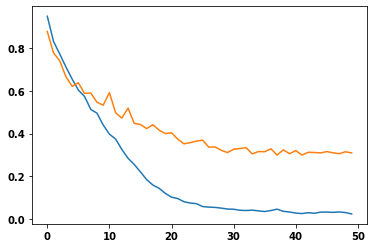

In [ ]:
history = model_conv1d.fit([snd[train_mask]], [snd[train_mask]],
                    epochs=50,
                    batch_size=1,
                    validation_data=([snd[val_mask]], [snd[val_mask]]))
                    

plt.plot(history.history["loss"], label = 'loss')
plt.plot(history.history["val_loss"], label = 'validation loss')
plt.show()

Epoch 1/50
205/205 [==============================] - 5s 14ms/step - loss: 0.0127 - val_loss: 0.2872
Epoch 2/50
205/205 [==============================] - 3s 13ms/step - loss: 0.0073 - val_loss: 0.2850
Epoch 3/50
205/205 [==============================] - 3s 13ms/step - loss: 0.0052 - val_loss: 0.2825
Epoch 4/50
205/205 [==============================] - 2s 12ms/step - loss: 0.0040 - val_loss: 0.2815
Epoch 5/50
205/205 [==============================] - 3s 14ms/step - loss: 0.0033 - val_loss: 0.2822
Epoch 6/50
205/205 [==============================] - 2s 12ms/step - loss: 0.0027 - val_loss: 0.2834
Epoch 7/50
205/205 [==============================] - 2s 12ms/step - loss: 0.0023 - val_loss: 0.2815
Epoch 8/50
205/205 [==============================] - 3s 12ms/step - loss: 0.0019 - val_loss: 0.2827
Epoch 9/50
205/205 [==============================] - 2s 11ms/step - loss: 0.0017 - val_loss: 0.2820
Epoch 10/50
205/205 [==============================] - 3s 12ms/step - loss: 0.0015 - val_lo

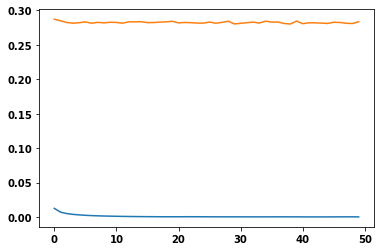

In [ ]:
history = model_conv1d.fit([snd[train_mask]], [snd[train_mask]],
                    epochs=50,
                    batch_size=1,
                    validation_data=([snd[val_mask]], [snd[val_mask]]))
                    

plt.plot(history.history["loss"], label = 'loss')
plt.plot(history.history["val_loss"], label = 'validation loss')
plt.show()

In [ ]:
model_conv1d.save('/content/drive/MyDrive/dz/mod/conv1dmfcc2.h5')
model_conv1d.save_weights('/content/drive/MyDrive/dz/mod/conv1dMfccW2.h5')

In [ ]:
testToCheck

In [ ]:
pred = model_conv1d.predict(testToCheck)

In [ ]:
mse = np.mean(np.power(testToCheck[0] - pred[0], 2), axis=1) # определяем среднеквадратичную ошибку по X_test и предсказанием по X_test

In [ ]:
mse

array([2.9765346, 5.073584 , 3.0164437, 2.2823863, 5.14775  , 2.0126224,
       3.1661777, 2.354173 , 7.300257 , 5.211099 , 2.2686944, 2.2051487,
       3.513625 , 2.5439582, 2.1540036, 4.2510495, 2.7320266, 2.5267494,
       1.9891026, 2.819915 , 4.586357 , 2.76646  , 3.1137207, 4.3160048,
       2.1672077, 1.9878502, 2.2204752, 2.1383522, 3.4621131, 1.9977773,
       2.4047005, 3.4598503, 2.9489152, 2.8237503, 2.5352645, 7.9577856,
       5.5524435, 9.4332905, 5.3379707, 6.3188353], dtype=float32)

In [ ]:
cor = np.corr(testToCheck[0], )

# 2. autoencoder Conv1D based on MinMaxScaler

In [ ]:
xT = snd.reshape((-1, snd.shape[1], 1))
xT.shape

(231, 40, 1)

In [ ]:
input = Input(shape = (xT.shape[1], xT.shape[2]))

# encoder
x = Conv1D(40, 2, padding="same", activation="relu")(input)
x = MaxPooling1D(2)(x)
x = Conv1D(80, 2, padding="same", activation="relu")(x)
x = MaxPooling1D(2)(x)
x = Conv1D(160, 2, padding="same", activation="relu")(x)
x = MaxPooling1D(2)(x)

x = Conv1D(320, 2, padding="same", activation="relu")(x)

x = Conv1DTranspose(160, (2), strides=(2), padding='same', activation='relu')(x)
x = Conv1D(160, 2, padding="same", activation="relu")(x)
x = Conv1DTranspose(80, (2), strides=(2), padding='same', activation='relu')(x)
x = Conv1D(80, 2, padding="same", activation="relu")(x)
x = Conv1DTranspose(40, (2), strides=(2), padding='same', activation='relu')(x)
x = Conv1D(40, 2, padding="same", activation="relu")(x)
x = Conv1D(1, (2), padding='same', activation='linear')(x)
model_conv1d = Model(input, x)

In [ ]:
model_conv1d.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 40, 1)]           0         
                                                                 
 conv1d (Conv1D)             (None, 40, 40)            120       
                                                                 
 max_pooling1d (MaxPooling1D  (None, 20, 40)           0         
 )                                                               
                                                                 
 conv1d_1 (Conv1D)           (None, 20, 80)            6480      
                                                                 
 max_pooling1d_1 (MaxPooling  (None, 10, 80)           0         
 1D)                                                             
                                                                 
 conv1d_2 (Conv1D)           (None, 10, 160)           25760 

In [ ]:
model_conv1d.compile(optimizer=Adam(0.0001),
                  loss='mean_squared_error') # компилируем модель с оптимайзером Адам и среднеквадратичной ошибкой

In [ ]:
train_mask, val_mask = mask(snd) # create train and validation sets for autoencoder

Epoch 1/50
218/218 [==============================] - 6s 12ms/step - loss: 0.0402 - val_loss: 0.0369
Epoch 2/50
218/218 [==============================] - 2s 10ms/step - loss: 0.0311 - val_loss: 0.0351
Epoch 3/50
218/218 [==============================] - 2s 10ms/step - loss: 0.0283 - val_loss: 0.0334
Epoch 4/50
218/218 [==============================] - 2s 10ms/step - loss: 0.0266 - val_loss: 0.0303
Epoch 5/50
218/218 [==============================] - 2s 10ms/step - loss: 0.0248 - val_loss: 0.0283
Epoch 6/50
218/218 [==============================] - 2s 10ms/step - loss: 0.0227 - val_loss: 0.0267
Epoch 7/50
218/218 [==============================] - 2s 10ms/step - loss: 0.0211 - val_loss: 0.0246
Epoch 8/50
218/218 [==============================] - 2s 10ms/step - loss: 0.0199 - val_loss: 0.0254
Epoch 9/50
218/218 [==============================] - 1s 7ms/step - loss: 0.0189 - val_loss: 0.0234
Epoch 10/50
218/218 [==============================] - 1s 7ms/step - loss: 0.0178 - val_loss

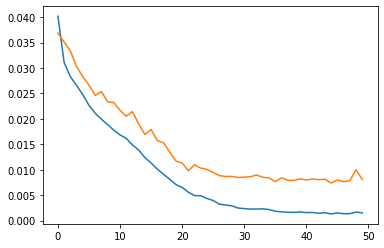

In [ ]:
history = model_conv1d.fit([snd[train_mask]], [snd[train_mask]],
                    epochs=50,
                    batch_size=1,
                    validation_data=([snd[val_mask]], [snd[val_mask]]))
                    

plt.plot(history.history["loss"], label = 'loss')
plt.plot(history.history["val_loss"], label = 'validation loss')
plt.show()

Epoch 1/50
218/218 [==============================] - 3s 9ms/step - loss: 7.0839e-04 - val_loss: 0.0072
Epoch 2/50
218/218 [==============================] - 2s 7ms/step - loss: 4.2905e-04 - val_loss: 0.0072
Epoch 3/50
218/218 [==============================] - 2s 8ms/step - loss: 3.2551e-04 - val_loss: 0.0070
Epoch 4/50
218/218 [==============================] - 2s 7ms/step - loss: 2.6662e-04 - val_loss: 0.0070
Epoch 5/50
218/218 [==============================] - 2s 7ms/step - loss: 2.2651e-04 - val_loss: 0.0071
Epoch 6/50
218/218 [==============================] - 2s 7ms/step - loss: 1.9691e-04 - val_loss: 0.0071
Epoch 7/50
218/218 [==============================] - 2s 7ms/step - loss: 1.7321e-04 - val_loss: 0.0071
Epoch 8/50
218/218 [==============================] - 2s 7ms/step - loss: 1.5271e-04 - val_loss: 0.0072
Epoch 9/50
218/218 [==============================] - 2s 8ms/step - loss: 1.3654e-04 - val_loss: 0.0071
Epoch 10/50
218/218 [==============================] - 2s 7ms/st

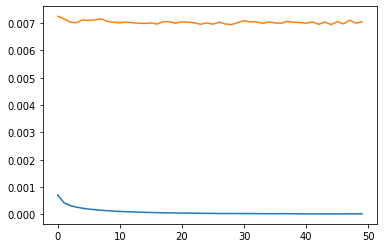

In [ ]:
history = model_conv1d.fit([snd[train_mask]], [snd[train_mask]],
                    epochs=50,
                    batch_size=1,
                    validation_data=([snd[val_mask]], [snd[val_mask]]))
                    

plt.plot(history.history["loss"], label = 'loss')
plt.plot(history.history["val_loss"], label = 'validation loss')
plt.show()

In [ ]:
model_conv1d.save('/content/drive/MyDrive/dz/mod/conv1dmfcc.h5')
model_conv1d.save_weights('/content/drive/MyDrive/dz/mod/conv1dMfccW.h5')

In [ ]:
testToCheck

In [ ]:
pred = model_conv1d.predict(testToCheck)

In [ ]:
mse = np.mean(np.power(testToCheck[0] - pred[0], 2), axis=1) # определяем среднеквадратичную ошибку по X_test и предсказанием по X_test

In [ ]:
mse

array([2.9765346, 5.073584 , 3.0164437, 2.2823863, 5.14775  , 2.0126224,
       3.1661777, 2.354173 , 7.300257 , 5.211099 , 2.2686944, 2.2051487,
       3.513625 , 2.5439582, 2.1540036, 4.2510495, 2.7320266, 2.5267494,
       1.9891026, 2.819915 , 4.586357 , 2.76646  , 3.1137207, 4.3160048,
       2.1672077, 1.9878502, 2.2204752, 2.1383522, 3.4621131, 1.9977773,
       2.4047005, 3.4598503, 2.9489152, 2.8237503, 2.5352645, 7.9577856,
       5.5524435, 9.4332905, 5.3379707, 6.3188353], dtype=float32)

In [ ]:
cor = np.corr(testToCheck[0], )

In [ ]:
!git push origin main # перебрасываем изменения в репозиторий гит

Everything up-to-date


# 3. autoencoder Conv1D based on MinMaxScaler, nfft 255

In [ ]:
xT = snd.reshape((-1, snd.shape[1], 1))
xT.shape

(454, 40, 1)

In [ ]:
input = Input(shape = (xT.shape[1], xT.shape[2]))

# encoder
x = Conv1D(40, 2, padding="same", activation="relu")(input)
x = MaxPooling1D(2)(x)
x = Conv1D(80, 2, padding="same", activation="relu")(x)
x = MaxPooling1D(2)(x)
x = Conv1D(160, 2, padding="same", activation="relu")(x)
x = MaxPooling1D(2)(x)

x = Conv1D(320, 2, padding="same", activation="relu")(x)

x = Conv1DTranspose(160, (2), strides=(2), padding='same', activation='relu')(x)
x = Conv1D(160, 2, padding="same", activation="relu")(x)
x = Conv1DTranspose(80, (2), strides=(2), padding='same', activation='relu')(x)
x = Conv1D(80, 2, padding="same", activation="relu")(x)
x = Conv1DTranspose(40, (2), strides=(2), padding='same', activation='relu')(x)
x = Conv1D(40, 2, padding="same", activation="relu")(x)
x = Conv1D(1, (2), padding='same', activation='linear')(x)
model_conv1d = Model(input, x)

In [ ]:
model_conv1d.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 40, 1)]           0         
                                                                 
 conv1d (Conv1D)             (None, 40, 40)            120       
                                                                 
 max_pooling1d (MaxPooling1D  (None, 20, 40)           0         
 )                                                               
                                                                 
 conv1d_1 (Conv1D)           (None, 20, 80)            6480      
                                                                 
 max_pooling1d_1 (MaxPooling  (None, 10, 80)           0         
 1D)                                                             
                                                                 
 conv1d_2 (Conv1D)           (None, 10, 160)           25760 

In [ ]:
model_conv1d.compile(optimizer=Adam(0.0001),
                  loss='mean_squared_error') # компилируем модель с оптимайзером Адам и среднеквадратичной ошибкой

In [ ]:
train_mask, val_mask = mask(snd) # create train and validation sets for autoencoder

Epoch 1/50
415/415 [==============================] - 7s 10ms/step - loss: 0.0367 - val_loss: 0.0272
Epoch 2/50
415/415 [==============================] - 4s 10ms/step - loss: 0.0297 - val_loss: 0.0258
Epoch 3/50
415/415 [==============================] - 4s 9ms/step - loss: 0.0280 - val_loss: 0.0227
Epoch 4/50
415/415 [==============================] - 4s 10ms/step - loss: 0.0240 - val_loss: 0.0208
Epoch 5/50
415/415 [==============================] - 4s 10ms/step - loss: 0.0211 - val_loss: 0.0176
Epoch 6/50
415/415 [==============================] - 4s 10ms/step - loss: 0.0180 - val_loss: 0.0146
Epoch 7/50
415/415 [==============================] - 4s 10ms/step - loss: 0.0136 - val_loss: 0.0120
Epoch 8/50
415/415 [==============================] - 4s 9ms/step - loss: 0.0105 - val_loss: 0.0108
Epoch 9/50
415/415 [==============================] - 3s 6ms/step - loss: 0.0082 - val_loss: 0.0086
Epoch 10/50
415/415 [==============================] - 3s 6ms/step - loss: 0.0066 - val_loss: 

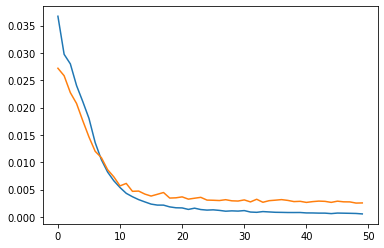

In [ ]:
history = model_conv1d.fit([snd[train_mask]], [snd[train_mask]],
                    epochs=50,
                    batch_size=1,
                    validation_data=([snd[val_mask]], [snd[val_mask]]))
                    

plt.plot(history.history["loss"], label = 'loss')
plt.plot(history.history["val_loss"], label = 'validation loss')
plt.show()

Epoch 1/10
415/415 [==============================] - 6s 11ms/step - loss: 2.5738e-04 - val_loss: 0.0022
Epoch 2/10
415/415 [==============================] - 4s 10ms/step - loss: 1.5837e-04 - val_loss: 0.0022
Epoch 3/10
415/415 [==============================] - 5s 12ms/step - loss: 1.2434e-04 - val_loss: 0.0022
Epoch 4/10
415/415 [==============================] - 5s 11ms/step - loss: 1.0548e-04 - val_loss: 0.0022
Epoch 5/10
415/415 [==============================] - 4s 10ms/step - loss: 9.2073e-05 - val_loss: 0.0022
Epoch 6/10
415/415 [==============================] - 5s 11ms/step - loss: 8.1382e-05 - val_loss: 0.0022
Epoch 7/10
415/415 [==============================] - 6s 14ms/step - loss: 7.3999e-05 - val_loss: 0.0022
Epoch 8/10
415/415 [==============================] - 4s 10ms/step - loss: 6.7439e-05 - val_loss: 0.0022
Epoch 9/10
415/415 [==============================] - 4s 10ms/step - loss: 6.1914e-05 - val_loss: 0.0022
Epoch 10/10
415/415 [==============================] - 

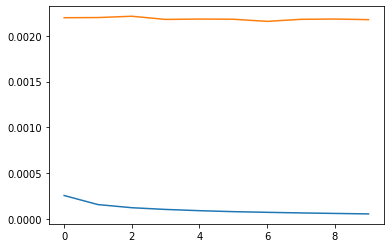

In [ ]:
history = model_conv1d.fit([snd[train_mask]], [snd[train_mask]],
                    epochs=10,
                    batch_size=1,
                    validation_data=([snd[val_mask]], [snd[val_mask]]))
                    

plt.plot(history.history["loss"], label = 'loss')
plt.plot(history.history["val_loss"], label = 'validation loss')
plt.show()

In [ ]:
model_conv1d.save('/content/drive/MyDrive/dz/mod/conv1dmfcc_255.h5')
model_conv1d.save_weights('/content/drive/MyDrive/dz/mod/conv1dMfccW_255.h5')

# 4. autoencoder Conv1D based on MinMaxScaler, add derivative

In [ ]:
snd_a.shape

(231, 40, 3)

In [ ]:
xT = snd.reshape((-1, snd.shape[1], 1))
xT.shape

(454, 40, 1)

In [ ]:
xT = snd_a

In [ ]:
input = Input(shape = (xT.shape[1], xT.shape[2]))

# encoder
x = Conv1D(40, 2, padding="same", activation="relu")(input)
x = MaxPooling1D(2)(x)
x = SpatialDropout1D(0.2)(x)
x = Conv1D(80, 2, padding="same", activation="relu")(x)
x = MaxPooling1D(2)(x)
x = SpatialDropout1D(0.2)(x)
x = Conv1D(160, 2, padding="same", activation="relu")(x)
x = MaxPooling1D(2)(x)
x = SpatialDropout1D(0.2)(x)

x = Conv1D(320, 2, padding="same", activation="relu")(x)

x = Conv1DTranspose(160, (2), strides=(2), padding='same', activation='relu')(x)
x = Conv1D(160, 2, padding="same", activation="relu")(x)
x = SpatialDropout1D(0.2)(x)
x = Conv1DTranspose(80, (2), strides=(2), padding='same', activation='relu')(x)
x = Conv1D(80, 2, padding="same", activation="relu")(x)
x = SpatialDropout1D(0.2)(x)
x = Conv1DTranspose(40, (2), strides=(2), padding='same', activation='relu')(x)
x = Conv1D(40, 2, padding="same", activation="relu")(x)
x = SpatialDropout1D(0.2)(x)
x = Conv1D(xT.shape[2], (2), padding='same', activation='linear')(x)
model_conv1d = Model(input, x)

In [ ]:
model_conv1d.summary()

Model: "model_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_6 (InputLayer)        [(None, 40, 3)]           0         
                                                                 
 conv1d_40 (Conv1D)          (None, 40, 40)            280       
                                                                 
 max_pooling1d_15 (MaxPoolin  (None, 20, 40)           0         
 g1D)                                                            
                                                                 
 spatial_dropout1d_7 (Spatia  (None, 20, 40)           0         
 lDropout1D)                                                     
                                                                 
 conv1d_41 (Conv1D)          (None, 20, 80)            6480      
                                                                 
 max_pooling1d_16 (MaxPoolin  (None, 10, 80)           0   

In [ ]:
model_conv1d.compile(optimizer=Adam(0.0001),
                  loss='mean_squared_error') # компилируем модель с оптимайзером Адам и среднеквадратичной ошибкой

In [ ]:
train_mask, val_mask = mask(snd) # create train and validation sets for autoencoder

In [ ]:
snd_a[train_mask].shape

(211, 40, 3)

Epoch 1/50
211/211 [==============================] - 6s 17ms/step - loss: 0.0279 - val_loss: 0.0301
Epoch 2/50
211/211 [==============================] - 2s 9ms/step - loss: 0.0272 - val_loss: 0.0300
Epoch 3/50
211/211 [==============================] - 2s 9ms/step - loss: 0.0269 - val_loss: 0.0297
Epoch 4/50
211/211 [==============================] - 2s 9ms/step - loss: 0.0270 - val_loss: 0.0298
Epoch 5/50
211/211 [==============================] - 2s 9ms/step - loss: 0.0271 - val_loss: 0.0299
Epoch 6/50
211/211 [==============================] - 2s 11ms/step - loss: 0.0271 - val_loss: 0.0299
Epoch 7/50
211/211 [==============================] - 2s 10ms/step - loss: 0.0269 - val_loss: 0.0297
Epoch 8/50
211/211 [==============================] - 2s 10ms/step - loss: 0.0268 - val_loss: 0.0300
Epoch 9/50
211/211 [==============================] - 2s 10ms/step - loss: 0.0265 - val_loss: 0.0298
Epoch 10/50
211/211 [==============================] - 2s 10ms/step - loss: 0.0266 - val_loss: 

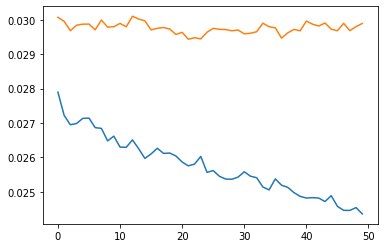

In [ ]:
history = model_conv1d.fit([snd_a[train_mask]], [snd_a[train_mask]],
                    epochs=50,
                    batch_size=1,
                    validation_data=([snd_a[val_mask]], [snd_a[val_mask]]))
                    

plt.plot(history.history["loss"], label = 'loss')
plt.plot(history.history["val_loss"], label = 'validation loss')
plt.show()

Epoch 1/10
415/415 [==============================] - 6s 11ms/step - loss: 2.5738e-04 - val_loss: 0.0022
Epoch 2/10
415/415 [==============================] - 4s 10ms/step - loss: 1.5837e-04 - val_loss: 0.0022
Epoch 3/10
415/415 [==============================] - 5s 12ms/step - loss: 1.2434e-04 - val_loss: 0.0022
Epoch 4/10
415/415 [==============================] - 5s 11ms/step - loss: 1.0548e-04 - val_loss: 0.0022
Epoch 5/10
415/415 [==============================] - 4s 10ms/step - loss: 9.2073e-05 - val_loss: 0.0022
Epoch 6/10
415/415 [==============================] - 5s 11ms/step - loss: 8.1382e-05 - val_loss: 0.0022
Epoch 7/10
415/415 [==============================] - 6s 14ms/step - loss: 7.3999e-05 - val_loss: 0.0022
Epoch 8/10
415/415 [==============================] - 4s 10ms/step - loss: 6.7439e-05 - val_loss: 0.0022
Epoch 9/10
415/415 [==============================] - 4s 10ms/step - loss: 6.1914e-05 - val_loss: 0.0022
Epoch 10/10
415/415 [==============================] - 

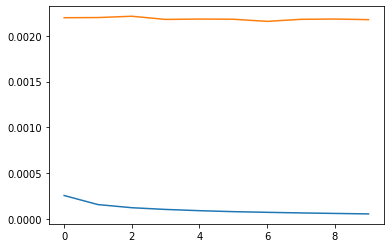

In [ ]:
history = model_conv1d.fit([snd[train_mask]], [snd[train_mask]],
                    epochs=10,
                    batch_size=1,
                    validation_data=([snd[val_mask]], [snd[val_mask]]))
                    

plt.plot(history.history["loss"], label = 'loss')
plt.plot(history.history["val_loss"], label = 'validation loss')
plt.show()

In [ ]:
model_conv1d.save('/content/drive/MyDrive/dz/mod/conv1d_diff.h5')
model_conv1d.save_weights('/content/drive/MyDrive/dz/mod/conv1dW_diff.h5')

# 5. autoencoder Conv1D based on MinMaxScaler - minimaze

In [ ]:
xT = snd.reshape((-1, snd.shape[1], 1))
xT.shape

(231, 40, 1)

In [ ]:
input = Input(shape = (xT.shape[1], xT.shape[2]))

# encoder
x = Conv1D(4, 2, padding="same", activation="relu")(input)

x = MaxPooling1D(2)(x)
x = Conv1D(8, 2, padding="same", activation="relu")(x)

x = MaxPooling1D(2)(x)
x = Conv1D(16, 2, padding="same", activation="relu")(x)

x = MaxPooling1D(2)(x)

x = Conv1D(32, 2, padding="same", activation="relu")(x)

x = Conv1DTranspose(16, (2), strides=(2), padding='same', activation='relu')(x)
x = Conv1D(16, 2, padding="same", activation="relu")(x)

x = Conv1DTranspose(8, (2), strides=(2), padding='same', activation='relu')(x)
x = Conv1D(8, 2, padding="same", activation="relu")(x)

x = Conv1DTranspose(4, (2), strides=(2), padding='same', activation='relu')(x)
x = Conv1D(4, 2, padding="same", activation="relu")(x)

x = Conv1D(1, (2), padding='same', activation='linear')(x)
model_conv1d = Model(input, x)

In [ ]:
model_conv1d.summary()

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 40, 1)]           0         
                                                                 
 conv1d_29 (Conv1D)          (None, 40, 4)             12        
                                                                 
 max_pooling1d_6 (MaxPooling  (None, 20, 4)            0         
 1D)                                                             
                                                                 
 conv1d_30 (Conv1D)          (None, 20, 8)             72        
                                                                 
 max_pooling1d_7 (MaxPooling  (None, 10, 8)            0         
 1D)                                                             
                                                                 
 conv1d_31 (Conv1D)          (None, 10, 16)            272 

In [ ]:
model_conv1d.compile(optimizer=Adam(0.0001),
                  loss='mean_squared_error') # компилируем модель с оптимайзером Адам и среднеквадратичной ошибкой

In [ ]:
train_mask, val_mask = mask(snd) # create train and validation sets for autoencoder

Epoch 1/50
210/210 [==============================] - 4s 9ms/step - loss: 0.0769 - val_loss: 0.0338
Epoch 2/50
210/210 [==============================] - 2s 10ms/step - loss: 0.0349 - val_loss: 0.0308
Epoch 3/50
210/210 [==============================] - 2s 8ms/step - loss: 0.0338 - val_loss: 0.0301
Epoch 4/50
210/210 [==============================] - 1s 6ms/step - loss: 0.0332 - val_loss: 0.0303
Epoch 5/50
210/210 [==============================] - 1s 6ms/step - loss: 0.0328 - val_loss: 0.0296
Epoch 6/50
210/210 [==============================] - 1s 3ms/step - loss: 0.0323 - val_loss: 0.0286
Epoch 7/50
210/210 [==============================] - 1s 3ms/step - loss: 0.0321 - val_loss: 0.0287
Epoch 8/50
210/210 [==============================] - 1s 3ms/step - loss: 0.0316 - val_loss: 0.0286
Epoch 9/50
210/210 [==============================] - 1s 4ms/step - loss: 0.0315 - val_loss: 0.0277
Epoch 10/50
210/210 [==============================] - 1s 4ms/step - loss: 0.0313 - val_loss: 0.029

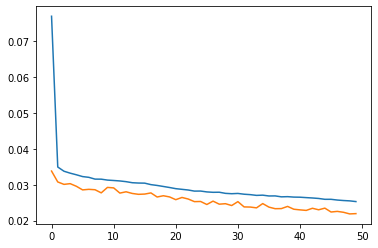

In [ ]:
history = model_conv1d.fit([snd[train_mask]], [snd[train_mask]],
                    epochs=50,
                    batch_size=1,
                    validation_data=([snd[val_mask]], [snd[val_mask]]))
                    

plt.plot(history.history["loss"], label = 'loss')
plt.plot(history.history["val_loss"], label = 'validation loss')
plt.show()

Epoch 1/20
210/210 [==============================] - 1s 3ms/step - loss: 0.0239 - val_loss: 0.0208
Epoch 2/20
210/210 [==============================] - 1s 3ms/step - loss: 0.0238 - val_loss: 0.0209
Epoch 3/20
210/210 [==============================] - 1s 3ms/step - loss: 0.0238 - val_loss: 0.0208
Epoch 4/20
210/210 [==============================] - 1s 3ms/step - loss: 0.0238 - val_loss: 0.0209
Epoch 5/20
210/210 [==============================] - 1s 3ms/step - loss: 0.0238 - val_loss: 0.0208
Epoch 6/20
210/210 [==============================] - 1s 3ms/step - loss: 0.0238 - val_loss: 0.0208
Epoch 7/20
210/210 [==============================] - 1s 3ms/step - loss: 0.0238 - val_loss: 0.0207
Epoch 8/20
210/210 [==============================] - 1s 4ms/step - loss: 0.0238 - val_loss: 0.0207
Epoch 9/20
210/210 [==============================] - 1s 4ms/step - loss: 0.0237 - val_loss: 0.0208
Epoch 10/20
210/210 [==============================] - 1s 4ms/step - loss: 0.0237 - val_loss: 0.0208

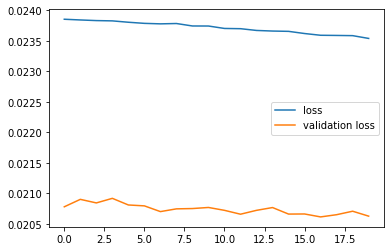

In [ ]:
history = model_conv1d.fit([snd[train_mask]], [snd[train_mask]],
                    epochs=20,
                    batch_size=1,
                    validation_data=([snd[val_mask]], [snd[val_mask]]))
                    

plt.plot(history.history["loss"], label = 'loss')
plt.plot(history.history["val_loss"], label = 'validation loss')
plt.legend()
plt.show()

In [ ]:
model_conv1d.save('/content/drive/MyDrive/dz/mod/conv1dmfcc_small.h5')
model_conv1d.save_weights('/content/drive/MyDrive/dz/mod/conv1dMfccW_small.h5')

# 6. autoencoder Conv1D based on MinMaxScaler, add derivative

In [ ]:
snd_a.shape

(231, 40, 3)

In [ ]:
xT = snd.reshape((-1, snd.shape[1], 1))
xT.shape

(454, 40, 1)

In [ ]:
xT = snd_a

In [ ]:
input = Input(shape = (xT.shape[1], xT.shape[2]))

# encoder
x = Conv1D(40, 2, padding="same", activation="relu")(input)
x = MaxPooling1D(2)(x)
x = SpatialDropout1D(0.2)(x)
x = Conv1D(80, 2, padding="same", activation="relu")(x)
x = MaxPooling1D(2)(x)
x = SpatialDropout1D(0.2)(x)
x = Conv1D(160, 2, padding="same", activation="relu")(x)
x = MaxPooling1D(2)(x)
x = SpatialDropout1D(0.2)(x)

x = Conv1D(320, 2, padding="same", activation="relu")(x)

x = Conv1DTranspose(160, (2), strides=(2), padding='same', activation='relu')(x)
x = Conv1D(160, 2, padding="same", activation="relu")(x)
x = SpatialDropout1D(0.2)(x)
x = Conv1DTranspose(80, (2), strides=(2), padding='same', activation='relu')(x)
x = Conv1D(80, 2, padding="same", activation="relu")(x)
x = SpatialDropout1D(0.2)(x)
x = Conv1DTranspose(40, (2), strides=(2), padding='same', activation='relu')(x)
x = Conv1D(40, 2, padding="same", activation="relu")(x)
x = SpatialDropout1D(0.2)(x)
x = Conv1D(xT.shape[2], (2), padding='same', activation='linear')(x)
model_conv1d = Model(input, x)

In [ ]:
model_conv1d.summary()

Model: "model_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_11 (InputLayer)       [(None, 40, 3)]           0         
                                                                 
 conv1d_68 (Conv1D)          (None, 40, 40)            280       
                                                                 
 max_pooling1d_9 (MaxPooling  (None, 20, 40)           0         
 1D)                                                             
                                                                 
 spatial_dropout1d (SpatialD  (None, 20, 40)           0         
 ropout1D)                                                       
                                                                 
 conv1d_69 (Conv1D)          (None, 20, 80)            6480      
                                                                 
 max_pooling1d_10 (MaxPoolin  (None, 10, 80)           0   

In [ ]:
model_conv1d.compile(optimizer=Adam(0.0001),
                  loss='mean_squared_error') # компилируем модель с оптимайзером Адам и среднеквадратичной ошибкой

In [ ]:
train_mask, val_mask = mask(snd_a) # create train and validation sets for autoencoder

In [ ]:
snd_a[train_mask].shape

(209, 40, 3)

Epoch 1/50
209/209 [==============================] - 4s 13ms/step - loss: 0.0503 - val_loss: 0.0320
Epoch 2/50
209/209 [==============================] - 2s 11ms/step - loss: 0.0419 - val_loss: 0.0316
Epoch 3/50
209/209 [==============================] - 2s 12ms/step - loss: 0.0415 - val_loss: 0.0314
Epoch 4/50
209/209 [==============================] - 2s 11ms/step - loss: 0.0410 - val_loss: 0.0312
Epoch 5/50
209/209 [==============================] - 2s 12ms/step - loss: 0.0409 - val_loss: 0.0313
Epoch 6/50
209/209 [==============================] - 3s 12ms/step - loss: 0.0407 - val_loss: 0.0311
Epoch 7/50
209/209 [==============================] - 2s 12ms/step - loss: 0.0405 - val_loss: 0.0309
Epoch 8/50
209/209 [==============================] - 3s 12ms/step - loss: 0.0402 - val_loss: 0.0308
Epoch 9/50
209/209 [==============================] - 3s 12ms/step - loss: 0.0398 - val_loss: 0.0302
Epoch 10/50
209/209 [==============================] - 2s 12ms/step - loss: 0.0395 - val_lo

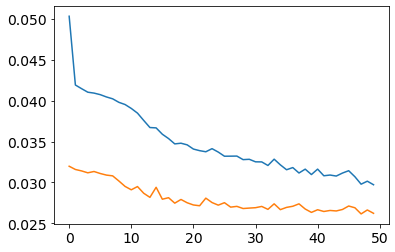

In [ ]:
history = model_conv1d.fit([snd_a[train_mask]], [snd_a[train_mask]],
                    epochs=50,
                    batch_size=1,
                    validation_data=([snd_a[val_mask]], [snd_a[val_mask]]))
                    

plt.plot(history.history["loss"], label = 'loss')
plt.plot(history.history["val_loss"], label = 'validation loss')
plt.show()

In [ ]:
history = model_conv1d.fit([snd[train_mask]], [snd[train_mask]],
                    epochs=10,
                    batch_size=1,
                    validation_data=([snd[val_mask]], [snd[val_mask]]))
                    

plt.plot(history.history["loss"], label = 'loss')
plt.plot(history.history["val_loss"], label = 'validation loss')
plt.show()

In [ ]:
model_conv1d.save('/content/drive/MyDrive/dz/mod/conv1d_diff_linear.h5')
model_conv1d.save_weights('/content/drive/MyDrive/dz/mod/conv1dW_diff_linear.h5')

# A. classification model Dense for mfcc based on StandartScaler

## simple Dense, mfcc 40

In [ ]:
model = Sequential()
model.add(Dense(256, activation='relu', input_shape=(x_train.shape[1],)))
model.add(Dense(128, activation='relu'))
model.add(Dense(64, activation='relu'))
model.add(Dense(32, activation='relu'))
model.add(Dense(1, activation='sigmoid'))


In [ ]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_5 (Dense)             (None, 256)               10496     
                                                                 
 dense_6 (Dense)             (None, 128)               32896     
                                                                 
 dense_7 (Dense)             (None, 64)                8256      
                                                                 
 dense_8 (Dense)             (None, 32)                2080      
                                                                 
 dense_9 (Dense)             (None, 1)                 33        
                                                                 
Total params: 53,761
Trainable params: 53,761
Non-trainable params: 0
_________________________________________________________________


In [ ]:
#Компилируем сеть
model.compile(optimizer=Adam(lr=0.0001),
              loss='binary_crossentropy',
              metrics=['accuracy'])

Epoch 1/5
9315/9315 [==============================] - 31s 3ms/step - loss: 0.1992 - accuracy: 0.9172 - val_loss: 0.1679 - val_accuracy: 0.9198
Epoch 2/5
9315/9315 [==============================] - 22s 2ms/step - loss: 0.1511 - accuracy: 0.9344 - val_loss: 0.1544 - val_accuracy: 0.9314
Epoch 3/5
9315/9315 [==============================] - 24s 3ms/step - loss: 0.1301 - accuracy: 0.9466 - val_loss: 0.1592 - val_accuracy: 0.9324
Epoch 4/5
9315/9315 [==============================] - 22s 2ms/step - loss: 0.1120 - accuracy: 0.9549 - val_loss: 0.1475 - val_accuracy: 0.9343
Epoch 5/5
9315/9315 [==============================] - 30s 3ms/step - loss: 0.0991 - accuracy: 0.9634 - val_loss: 0.2051 - val_accuracy: 0.9275


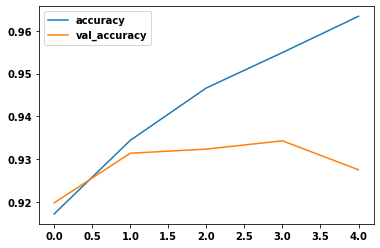

In [ ]:
history = model.fit(x_train,
                    y_train,
                    epochs=5,
                    batch_size=1,
                    validation_data=(x_test, y_test))

#Выводим график точности распознавания на обучающей и проверочной выборках
plt.plot(history.history["accuracy"], label = 'accuracy')
plt.plot(history.history["val_accuracy"], label = 'val_accuracy')
plt.legend()
plt.show()

Epoch 1/5
9315/9315 [==============================] - 28s 3ms/step - loss: 0.0578 - accuracy: 0.9763 - val_loss: 0.2062 - val_accuracy: 0.9362
Epoch 2/5
9315/9315 [==============================] - 22s 2ms/step - loss: 0.0400 - accuracy: 0.9840 - val_loss: 0.2551 - val_accuracy: 0.9391
Epoch 3/5
9315/9315 [==============================] - 22s 2ms/step - loss: 0.0291 - accuracy: 0.9897 - val_loss: 0.3186 - val_accuracy: 0.9362
Epoch 4/5
9315/9315 [==============================] - 22s 2ms/step - loss: 0.0223 - accuracy: 0.9910 - val_loss: 0.3905 - val_accuracy: 0.9362
Epoch 5/5
9315/9315 [==============================] - 22s 2ms/step - loss: 0.0174 - accuracy: 0.9937 - val_loss: 0.5018 - val_accuracy: 0.9372


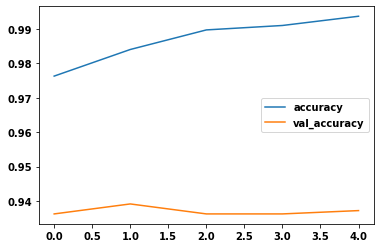

In [ ]:
history = model.fit(x_train,
                    y_train,
                    epochs=5,
                    batch_size=1,
                    validation_data=(x_test, y_test))

#Выводим график точности распознавания на обучающей и проверочной выборках
plt.plot(history.history["accuracy"], label = 'accuracy')
plt.plot(history.history["val_accuracy"], label = 'val_accuracy')
plt.legend()
plt.show()

In [ ]:
model.save('/content/drive/MyDrive/dz/mod/model_raw_mfcc402.h5')
model.save_weights('/content/drive/MyDrive/dz/mod/model_raw_w_mfcc402.h5')

In [ ]:
model = load_model('/content/drive/MyDrive/dz/mod/model_raw_mfcc402.h5', compile = False)

In [ ]:
model.compile(optimizer=Adam(0.0001), loss='mean_squared_error') 

### how predicted xTrain correspond to true yTrain

In [ ]:
yPred = model.predict(train) # to predict of train data

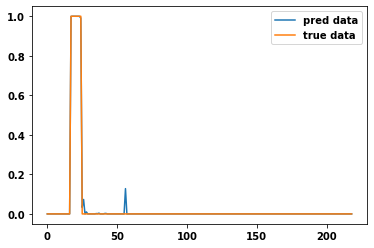

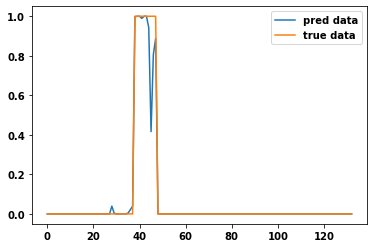

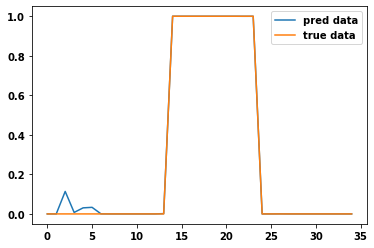

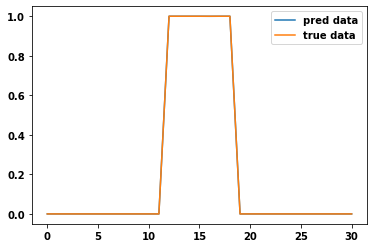

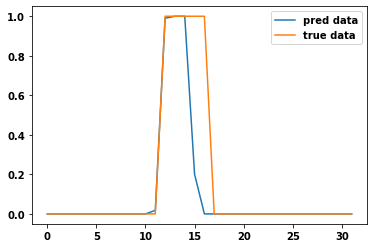

...

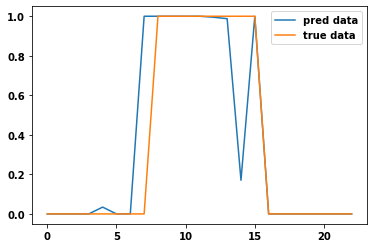

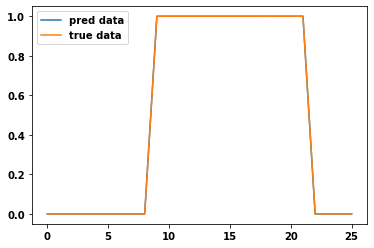

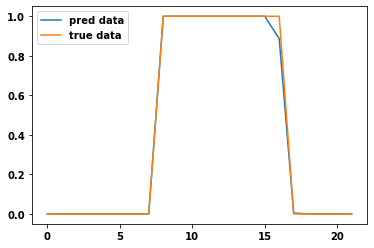

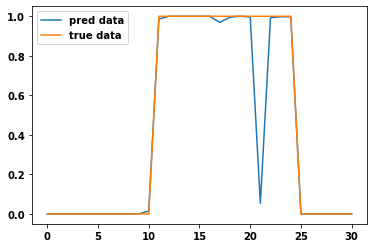

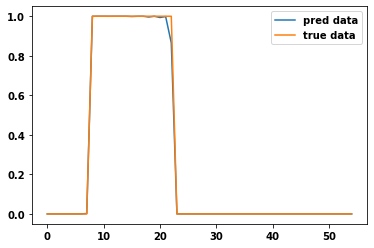

In [ ]:
plotCompare(yLittle, yPred, lstOfTime)

### how predicted xTest correspond to true yTest

In [ ]:
yPred = model.predict(test) # to predict of train data


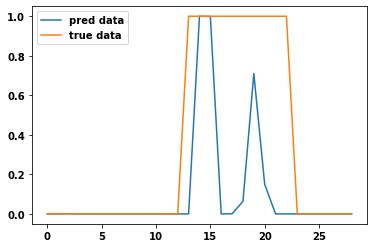

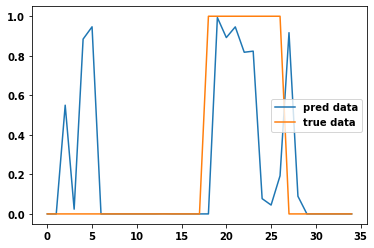

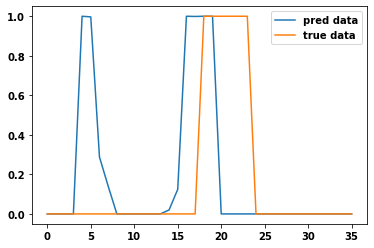

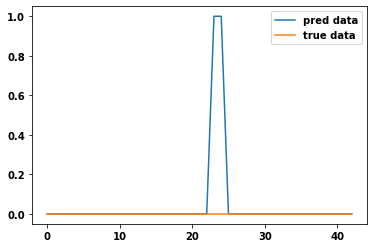

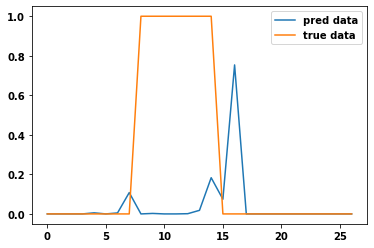

...

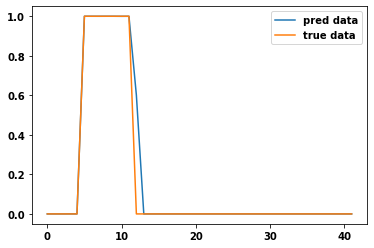

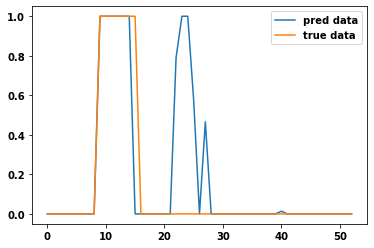

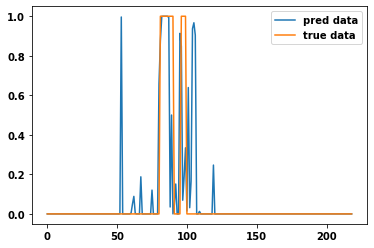

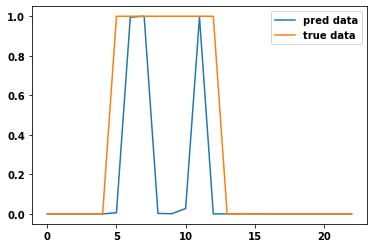

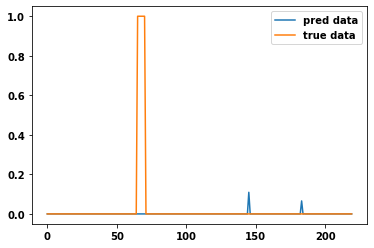

In [ ]:
plotCompare(yLittleTest, yPred, lstOfTime_test)

In [ ]:
model.evaluate(test, yLittleTest)

64/64 [==============================] - 0s 2ms/step - loss: 1.8275 - accuracy: 0.8842


[1.827467441558838, 0.8842208385467529]

# B. classification model Dense for mfcc based on MinMaxScaler

## simple Dense, mfcc 40

In [ ]:
model = Sequential()
model.add(Dense(256, activation='relu', input_shape=(x_train.shape[1],)))
model.add(Dense(128, activation='relu'))
model.add(Dense(64, activation='relu'))
model.add(Dense(32, activation='relu'))
model.add(Dense(1, activation='sigmoid'))


In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 256)               10496     
                                                                 
 dense_1 (Dense)             (None, 128)               32896     
                                                                 
 dense_2 (Dense)             (None, 64)                8256      
                                                                 
 dense_3 (Dense)             (None, 32)                2080      
                                                                 
 dense_4 (Dense)             (None, 1)                 33        
                                                                 
Total params: 53,761
Trainable params: 53,761
Non-trainable params: 0
_________________________________________________________________


In [ ]:
#Компилируем сеть
model.compile(optimizer=Adam(lr=0.00001),
              loss='binary_crossentropy',
              metrics=['accuracy'])

Epoch 1/5
9315/9315 [==============================] - 25s 3ms/step - loss: 0.2276 - accuracy: 0.8984 - val_loss: 0.2055 - val_accuracy: 0.9092
Epoch 2/5
9315/9315 [==============================] - 20s 2ms/step - loss: 0.2000 - accuracy: 0.9052 - val_loss: 0.1805 - val_accuracy: 0.9082
Epoch 3/5
9315/9315 [==============================] - 20s 2ms/step - loss: 0.1939 - accuracy: 0.9080 - val_loss: 0.1910 - val_accuracy: 0.9034
Epoch 4/5
9315/9315 [==============================] - 19s 2ms/step - loss: 0.1932 - accuracy: 0.9122 - val_loss: 0.1931 - val_accuracy: 0.9140
Epoch 5/5
9315/9315 [==============================] - 19s 2ms/step - loss: 0.1891 - accuracy: 0.9091 - val_loss: 0.1748 - val_accuracy: 0.9208


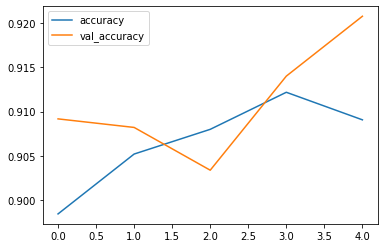

In [ ]:
history = model.fit(x_train,
                    y_train,
                    epochs=5,
                    batch_size=1,
                    validation_data=(x_test, y_test))

#Выводим график точности распознавания на обучающей и проверочной выборках
plt.plot(history.history["accuracy"], label = 'accuracy')
plt.plot(history.history["val_accuracy"], label = 'val_accuracy')
plt.legend()
plt.show()

Epoch 1/5
9315/9315 [==============================] - 31s 3ms/step - loss: 0.1679 - accuracy: 0.9258 - val_loss: 0.1721 - val_accuracy: 0.9237
Epoch 2/5
9315/9315 [==============================] - 20s 2ms/step - loss: 0.1671 - accuracy: 0.9259 - val_loss: 0.1732 - val_accuracy: 0.9217
Epoch 3/5
9315/9315 [==============================] - 20s 2ms/step - loss: 0.1676 - accuracy: 0.9261 - val_loss: 0.1722 - val_accuracy: 0.9208
Epoch 4/5
9315/9315 [==============================] - 20s 2ms/step - loss: 0.1671 - accuracy: 0.9260 - val_loss: 0.1710 - val_accuracy: 0.9227
Epoch 5/5
9315/9315 [==============================] - 32s 3ms/step - loss: 0.1668 - accuracy: 0.9259 - val_loss: 0.1710 - val_accuracy: 0.9227


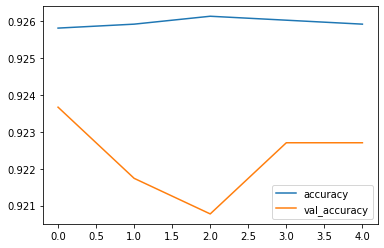

In [ ]:
history = model.fit(x_train,
                    y_train,
                    epochs=5,
                    batch_size=1,
                    validation_data=(x_test, y_test))

#Выводим график точности распознавания на обучающей и проверочной выборках
plt.plot(history.history["accuracy"], label = 'accuracy')
plt.plot(history.history["val_accuracy"], label = 'val_accuracy')
plt.legend()
plt.show()

In [ ]:
model.save('/content/drive/MyDrive/dz/mod/model_raw_mfcc40.h5')
model.save_weights('/content/drive/MyDrive/dz/mod/model_raw_w_mfcc40.h5')

In [ ]:
model = load_model('/content/drive/MyDrive/dz/mod/model_raw_mfcc40.h5', compile = False)

In [ ]:
model.compile(optimizer=Adam(0.0001), loss='mean_squared_error') 

### how predicted xTrain correspond to true yTrain

In [ ]:
yPred = model.predict(train) # to predict of train data

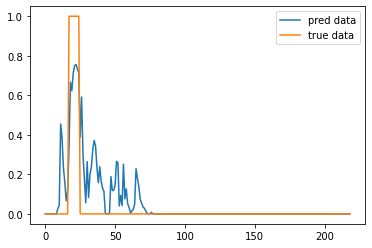

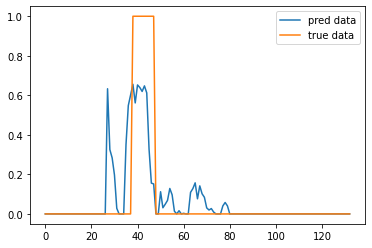

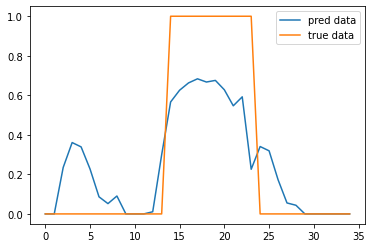

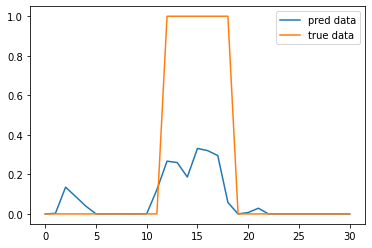

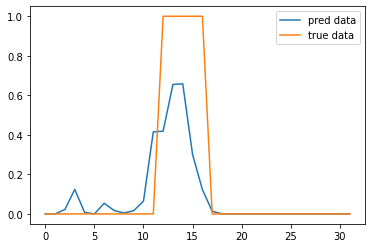

...

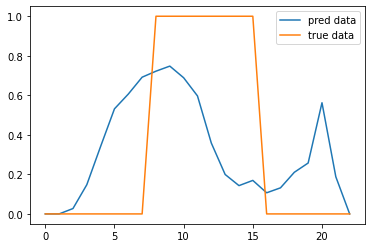

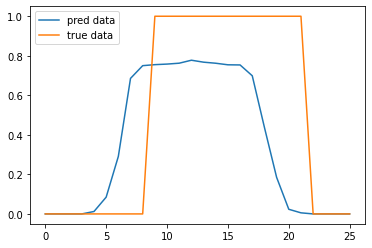

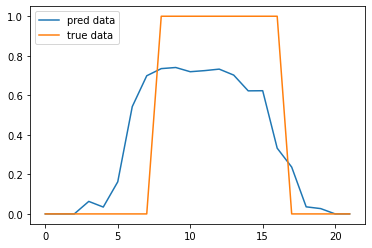

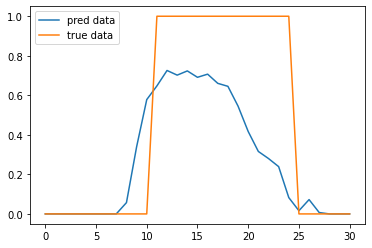

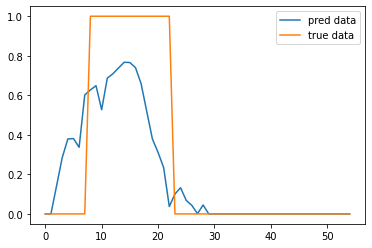

In [ ]:
plotCompare(yLittle, yPred, lstOfTime)

### how predicted xTest correspond to true yTest

In [ ]:
yPred = model.predict(test) # to predict of train data

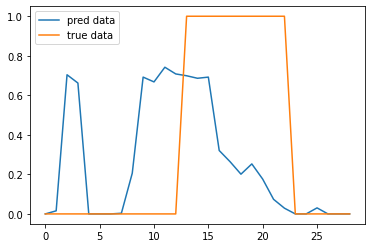

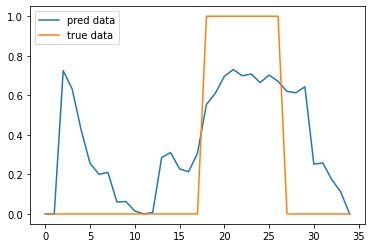

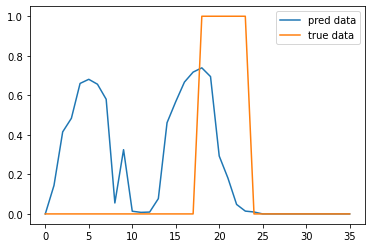

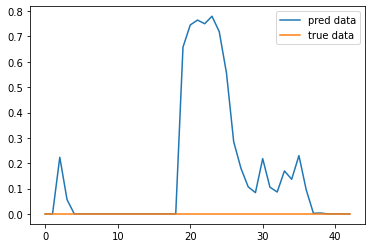

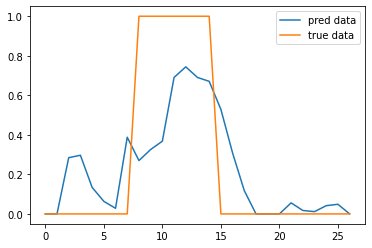

...

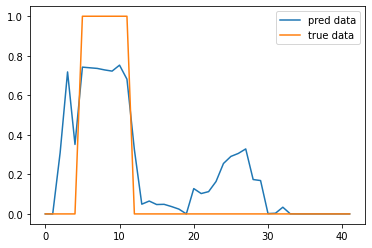

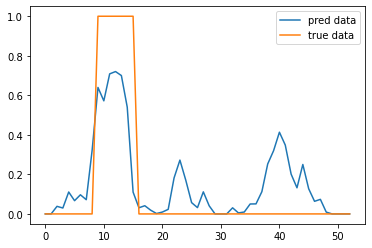

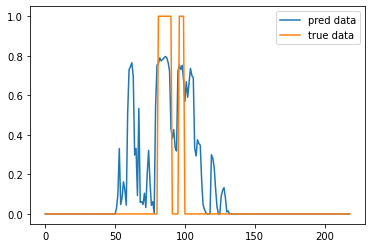

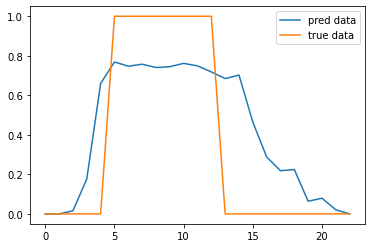

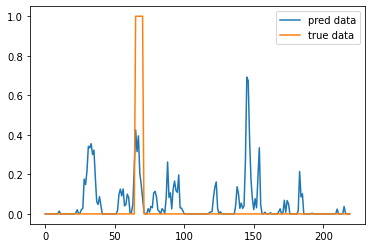

In [ ]:
plotCompare(yLittleTest, yPred, lstOfTime_test)

In [ ]:
model.evaluate(test, yLittleTest)

64/64 [==============================] - 0s 4ms/step - loss: 0.2521 - accuracy: 0.8857


[0.2521151006221771, 0.8856863975524902]

## train set that pretrained by autoencoder

In [ ]:
model_conv1d = load_model('/content/drive/MyDrive/dz/mod/conv1dmfcc.h5', compile = True)

In [ ]:
# to normalize a xTrain
train = scalMM(X_train_mfcc_i)

In [ ]:
trained = model_conv1d.predict(train)

In [ ]:
# splitting
x_train, x_test, y_train, y_test = train_test_split(trained, yLittle, test_size=0.1)
print(x_train.shape)
print(x_test.shape)
print(y_train.shape)
print(y_test.shape)

(9315, 40, 1)
(1035, 40, 1)
(9315,)
(1035,)


In [ ]:
model = Sequential()
model.add(Dense(256, activation='relu', input_shape=(x_train.shape[1],)))
model.add(Dense(128, activation='relu'))
model.add(Dense(64, activation='relu'))
model.add(Dense(32, activation='relu'))
model.add(Dense(1, activation='sigmoid'))


In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 256)               10496     
                                                                 
 dense_1 (Dense)             (None, 128)               32896     
                                                                 
 dense_2 (Dense)             (None, 64)                8256      
                                                                 
 dense_3 (Dense)             (None, 32)                2080      
                                                                 
 dense_4 (Dense)             (None, 1)                 33        
                                                                 
Total params: 53,761
Trainable params: 53,761
Non-trainable params: 0
_________________________________________________________________


In [ ]:
#Компилируем сеть
model.compile(optimizer=Adam(lr=0.0001),
              loss='binary_crossentropy',
              metrics=['accuracy'])

Epoch 1/5
9315/9315 [==============================] - 29s 3ms/step - loss: 0.2387 - accuracy: 0.9002 - val_loss: 0.2383 - val_accuracy: 0.8899
Epoch 2/5
9315/9315 [==============================] - 28s 3ms/step - loss: 0.2095 - accuracy: 0.9090 - val_loss: 0.2218 - val_accuracy: 0.8937
Epoch 3/5
9315/9315 [==============================] - 30s 3ms/step - loss: 0.2070 - accuracy: 0.9095 - val_loss: 0.1803 - val_accuracy: 0.9237
Epoch 4/5
9315/9315 [==============================] - 25s 3ms/step - loss: 0.2032 - accuracy: 0.9101 - val_loss: 0.2277 - val_accuracy: 0.9285
Epoch 5/5
9315/9315 [==============================] - 27s 3ms/step - loss: 0.2005 - accuracy: 0.9125 - val_loss: 0.1981 - val_accuracy: 0.9169


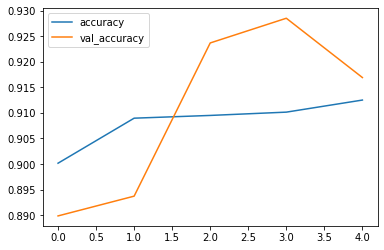

In [ ]:
history = model.fit(x_train,
                    y_train,
                    epochs=5,
                    batch_size=1,
                    validation_data=(x_test, y_test))

#Выводим график точности распознавания на обучающей и проверочной выборках
plt.plot(history.history["accuracy"], label = 'accuracy')
plt.plot(history.history["val_accuracy"], label = 'val_accuracy')
plt.legend()
plt.show()

Epoch 1/5
9315/9315 [==============================] - 28s 3ms/step - loss: 0.1851 - accuracy: 0.9176 - val_loss: 0.1777 - val_accuracy: 0.9275
Epoch 2/5
9315/9315 [==============================] - 17s 2ms/step - loss: 0.1834 - accuracy: 0.9192 - val_loss: 0.1773 - val_accuracy: 0.9295
Epoch 3/5
9315/9315 [==============================] - 26s 3ms/step - loss: 0.1831 - accuracy: 0.9193 - val_loss: 0.1777 - val_accuracy: 0.9285
Epoch 4/5
9315/9315 [==============================] - 26s 3ms/step - loss: 0.1829 - accuracy: 0.9195 - val_loss: 0.1771 - val_accuracy: 0.9285
Epoch 5/5
9315/9315 [==============================] - 17s 2ms/step - loss: 0.1831 - accuracy: 0.9187 - val_loss: 0.1774 - val_accuracy: 0.9285


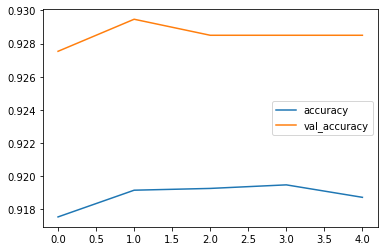

In [ ]:
history = model.fit(x_train,
                    y_train,
                    epochs=5,
                    batch_size=1,
                    validation_data=(x_test, y_test))

#Выводим график точности распознавания на обучающей и проверочной выборках
plt.plot(history.history["accuracy"], label = 'accuracy')
plt.plot(history.history["val_accuracy"], label = 'val_accuracy')
plt.legend()
plt.show()

In [ ]:
model.save('/content/drive/MyDrive/dz/mod/model_raw_mfcc40_pretrain.h5')
model.save_weights('/content/drive/MyDrive/dz/mod/model_raw_w_mfcc40_pretrain.h5')

### how predicted xTest correspond to true yTest

In [ ]:
tested = model_conv1d.predict(test)

In [ ]:
yPred_at = model.predict(tested) # to predict of test data

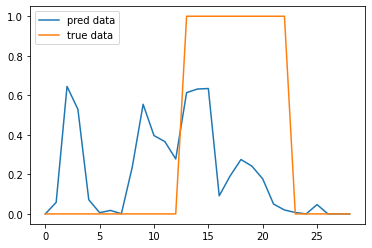

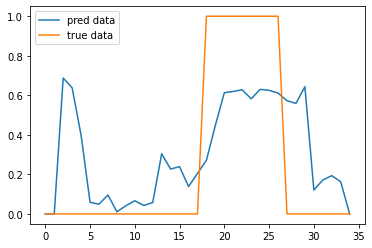

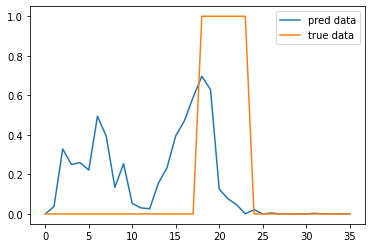

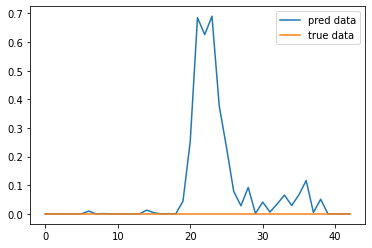

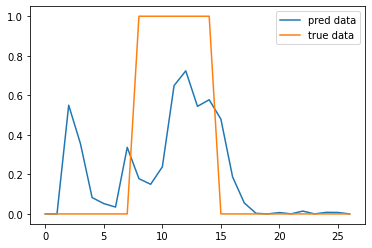

...

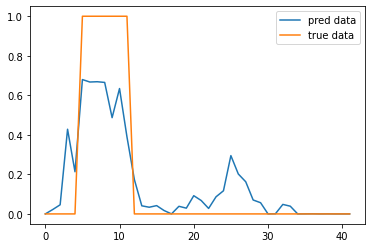

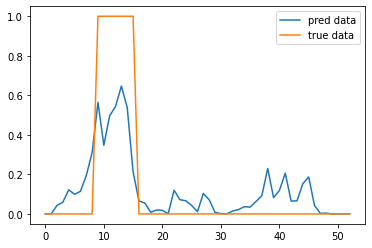

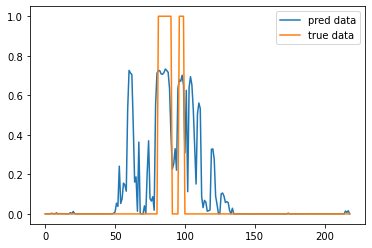

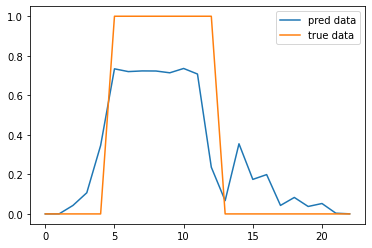

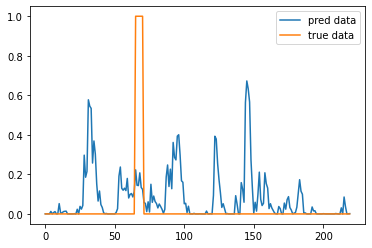

In [ ]:
plotCompare(yLittleTest, yPred_at, lstOfTime_test)

In [ ]:
model.evaluate(tested, yLittleTest)

64/64 [==============================] - 0s 2ms/step - loss: 0.2635 - accuracy: 0.8911


[0.2635090947151184, 0.8910601139068604]

# C. classification model Dense for mfcc based on MinMaxScaler, nfft 255

## simple Dense, mfcc 40

In [ ]:
model = Sequential()
model.add(Dense(256, activation='relu', input_shape=(x_train.shape[1],)))
model.add(Dense(128, activation='relu'))
model.add(Dense(64, activation='relu'))
model.add(Dense(32, activation='relu'))
model.add(Dense(1, activation='sigmoid'))


In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 256)               10496     
                                                                 
 dense_1 (Dense)             (None, 128)               32896     
                                                                 
 dense_2 (Dense)             (None, 64)                8256      
                                                                 
 dense_3 (Dense)             (None, 32)                2080      
                                                                 
 dense_4 (Dense)             (None, 1)                 33        
                                                                 
Total params: 53,761
Trainable params: 53,761
Non-trainable params: 0
_________________________________________________________________


In [ ]:
#Компилируем сеть
model.compile(optimizer=Adam(lr=0.0001),
              loss='binary_crossentropy',
              metrics=['accuracy'])

Epoch 1/5
18604/18604 [==============================] - 48s 3ms/step - loss: 0.2195 - accuracy: 0.9004 - val_loss: 0.1785 - val_accuracy: 0.9091
Epoch 2/5
18604/18604 [==============================] - 65s 3ms/step - loss: 0.2016 - accuracy: 0.9046 - val_loss: 0.1797 - val_accuracy: 0.9086
Epoch 3/5
18604/18604 [==============================] - 54s 3ms/step - loss: 0.1958 - accuracy: 0.9085 - val_loss: 0.1929 - val_accuracy: 0.9105
Epoch 4/5
18604/18604 [==============================] - 41s 2ms/step - loss: 0.1960 - accuracy: 0.9086 - val_loss: 0.2114 - val_accuracy: 0.9086
Epoch 5/5
18604/18604 [==============================] - 39s 2ms/step - loss: 0.1930 - accuracy: 0.9103 - val_loss: 0.1725 - val_accuracy: 0.9159


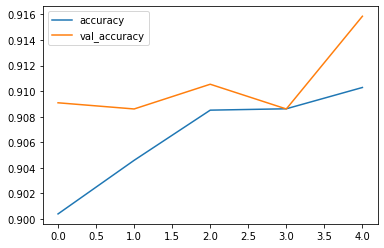

In [ ]:
history = model.fit(x_train,
                    y_train,
                    epochs=5,
                    batch_size=1,
                    validation_data=(x_test, y_test))

#Выводим график точности распознавания на обучающей и проверочной выборках
plt.plot(history.history["accuracy"], label = 'accuracy')
plt.plot(history.history["val_accuracy"], label = 'val_accuracy')
plt.legend()
plt.show()

Epoch 1/5
18604/18604 [==============================] - 44s 2ms/step - loss: 0.1810 - accuracy: 0.9150 - val_loss: 0.1718 - val_accuracy: 0.9149
Epoch 2/5
18604/18604 [==============================] - 42s 2ms/step - loss: 0.1801 - accuracy: 0.9171 - val_loss: 0.1701 - val_accuracy: 0.9168
Epoch 3/5
18604/18604 [==============================] - 40s 2ms/step - loss: 0.1800 - accuracy: 0.9186 - val_loss: 0.1722 - val_accuracy: 0.9149
Epoch 4/5
18604/18604 [==============================] - 38s 2ms/step - loss: 0.1793 - accuracy: 0.9181 - val_loss: 0.1705 - val_accuracy: 0.9192
Epoch 5/5
18604/18604 [==============================] - 39s 2ms/step - loss: 0.1797 - accuracy: 0.9173 - val_loss: 0.1698 - val_accuracy: 0.9168


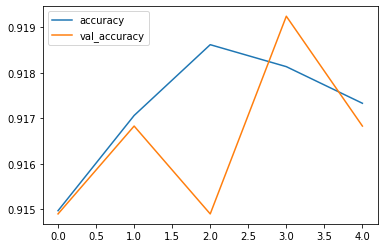

In [ ]:
history = model.fit(x_train,
                    y_train,
                    epochs=5,
                    batch_size=1,
                    validation_data=(x_test, y_test))

#Выводим график точности распознавания на обучающей и проверочной выборках
plt.plot(history.history["accuracy"], label = 'accuracy')
plt.plot(history.history["val_accuracy"], label = 'val_accuracy')
plt.legend()
plt.show()

In [ ]:
model.save('/content/drive/MyDrive/dz/mod/model_raw_mfcc40_255.h5')
model.save_weights('/content/drive/MyDrive/dz/mod/model_raw_w_mfcc40_255.h5')

### how predicted xTrain correspond to true yTrain

In [ ]:
yPred = model.predict(train) # to predict of train data

In [ ]:
plotCompare(yLittle, yPred, lstOfTime)

### how predicted xTest correspond to true yTest

In [ ]:
yPred = model.predict(test) # to predict of train data

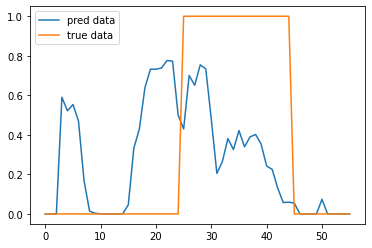

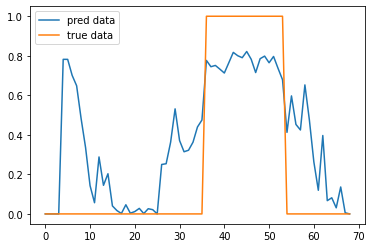

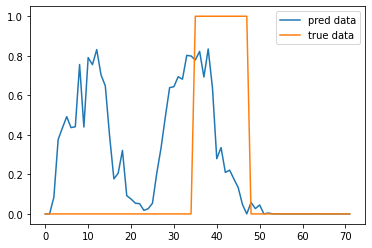

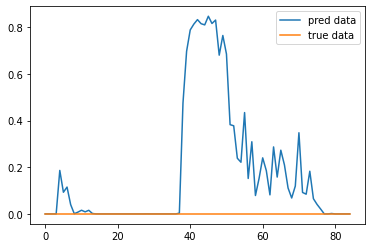

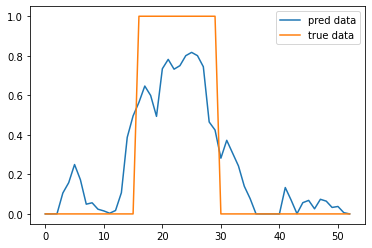

...

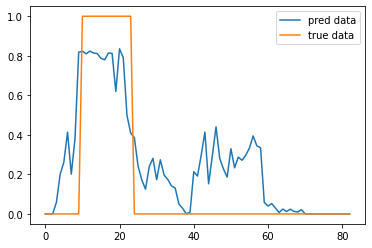

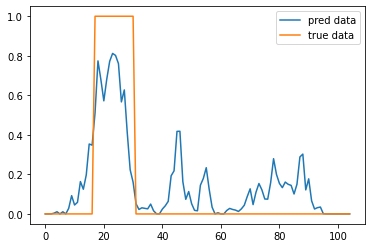

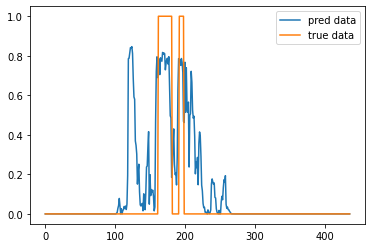

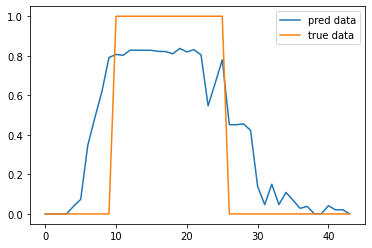

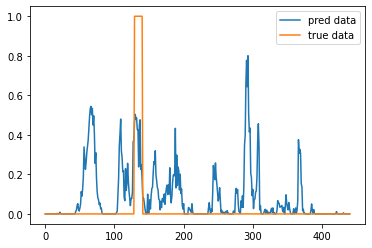

In [ ]:
plotCompare(yLittleTest, yPred, lstOfTime_test)

In [ ]:
model.evaluate(test, yLittleTest)

128/128 [==============================] - 0s 2ms/step - loss: 0.2378 - accuracy: 0.8914


[0.23784686625003815, 0.8914160132408142]

## train set that pretrained by autoencoder

In [ ]:
model_conv1d = load_model('/content/drive/MyDrive/dz/mod/conv1dmfcc.h5', compile = True)

In [ ]:
# to normalize a xTrain
train = scalMM(X_train_mfcc_i)

In [ ]:
trained = model_conv1d.predict(train) 

In [ ]:
trained = np.squeeze(trained) # удаляем лишнюю размерность, чтобы мин-макс-скалер не  ругался

In [ ]:
trained = scalMM(trained) # дополнительно нормализуем, чтобы компенсировать выбросы после автоэнкодера

In [ ]:
# splitting
x_train, x_test, y_train, y_test = train_test_split(trained, yLittle, test_size=0.1)
print(x_train.shape)
print(x_test.shape)
print(y_train.shape)
print(y_test.shape)

(18604, 40)
(2068, 40)
(18604,)
(2068,)


In [ ]:
model = Sequential()
model.add(Dense(256, activation='relu', input_shape=(x_train.shape[1],)))
model.add(Dense(128, activation='relu'))
model.add(Dense(64, activation='relu'))
model.add(Dense(32, activation='relu'))
model.add(Dense(1, activation='sigmoid'))


In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 256)               10496     
                                                                 
 dense_1 (Dense)             (None, 128)               32896     
                                                                 
 dense_2 (Dense)             (None, 64)                8256      
                                                                 
 dense_3 (Dense)             (None, 32)                2080      
                                                                 
 dense_4 (Dense)             (None, 1)                 33        
                                                                 
Total params: 53,761
Trainable params: 53,761
Non-trainable params: 0
_________________________________________________________________


In [ ]:
#Компилируем сеть
model.compile(optimizer=Adam(lr=0.0001),
              loss='binary_crossentropy',
              metrics=['accuracy'])

Epoch 1/5
18604/18604 [==============================] - 42s 2ms/step - loss: 0.2206 - accuracy: 0.9008 - val_loss: 0.1988 - val_accuracy: 0.9076
Epoch 2/5
18604/18604 [==============================] - 38s 2ms/step - loss: 0.2064 - accuracy: 0.9028 - val_loss: 0.1898 - val_accuracy: 0.9028
Epoch 3/5
18604/18604 [==============================] - 38s 2ms/step - loss: 0.2026 - accuracy: 0.9056 - val_loss: 0.1841 - val_accuracy: 0.9183
Epoch 4/5
18604/18604 [==============================] - 38s 2ms/step - loss: 0.2006 - accuracy: 0.9095 - val_loss: 0.1814 - val_accuracy: 0.9197
Epoch 5/5
18604/18604 [==============================] - 39s 2ms/step - loss: 0.1976 - accuracy: 0.9081 - val_loss: 0.1829 - val_accuracy: 0.9183


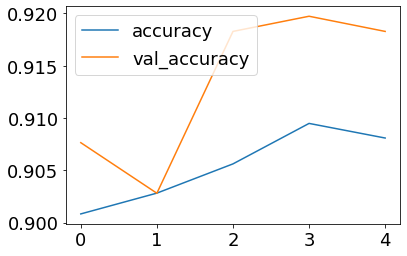

In [ ]:
history = model.fit(x_train,
                    y_train,
                    epochs=5,
                    batch_size=1,
                    validation_data=(x_test, y_test))

#Выводим график точности распознавания на обучающей и проверочной выборках
plt.plot(history.history["accuracy"], label = 'accuracy')
plt.plot(history.history["val_accuracy"], label = 'val_accuracy')
plt.legend()
plt.show()

Epoch 1/5
18604/18604 [==============================] - 52s 3ms/step - loss: 0.1876 - accuracy: 0.9151 - val_loss: 0.1755 - val_accuracy: 0.9197
Epoch 2/5
18604/18604 [==============================] - 47s 3ms/step - loss: 0.1865 - accuracy: 0.9153 - val_loss: 0.1766 - val_accuracy: 0.9221
Epoch 3/5
18604/18604 [==============================] - 38s 2ms/step - loss: 0.1857 - accuracy: 0.9154 - val_loss: 0.1757 - val_accuracy: 0.9192
Epoch 4/5
18604/18604 [==============================] - 39s 2ms/step - loss: 0.1851 - accuracy: 0.9157 - val_loss: 0.1746 - val_accuracy: 0.9197
Epoch 5/5
18604/18604 [==============================] - 39s 2ms/step - loss: 0.1849 - accuracy: 0.9153 - val_loss: 0.1873 - val_accuracy: 0.9217


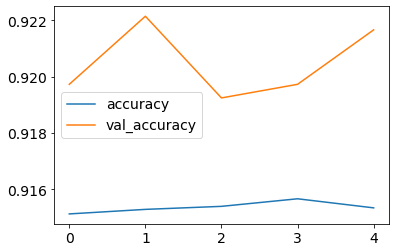

In [ ]:
history = model.fit(x_train,
                    y_train,
                    epochs=5,
                    batch_size=1,
                    validation_data=(x_test, y_test))

#Выводим график точности распознавания на обучающей и проверочной выборках
plt.plot(history.history["accuracy"], label = 'accuracy')
plt.plot(history.history["val_accuracy"], label = 'val_accuracy')
plt.legend()
plt.show()

In [ ]:
model.save('/content/drive/MyDrive/dz/mod/model_raw_mfcc40_pretrain_255.h5')
model.save_weights('/content/drive/MyDrive/dz/mod/model_raw_w_mfcc40_pretrain_255.h5')

### how predicted xTest correspond to true yTest

In [ ]:
tested = model_conv1d.predict(test)

In [ ]:
tested = np.squeeze(tested)

In [ ]:
tested = scalMM(tested)

In [ ]:
yPred_at = model.predict(tested) # to predict of test data

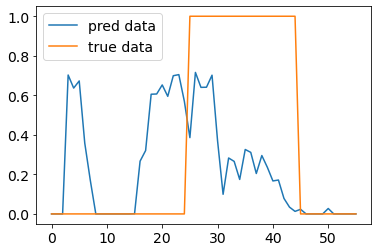

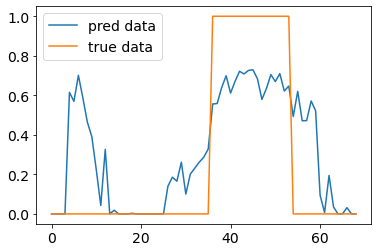

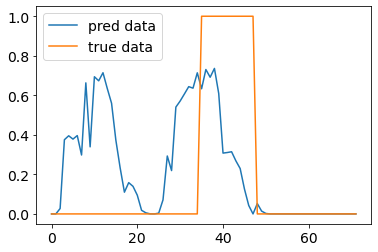

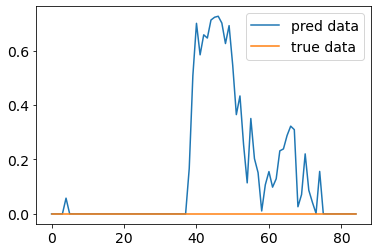

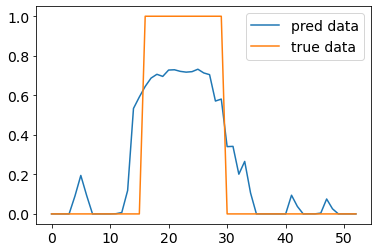

...

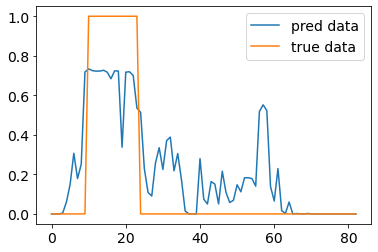

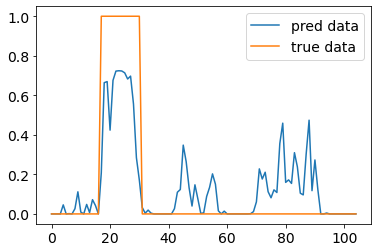

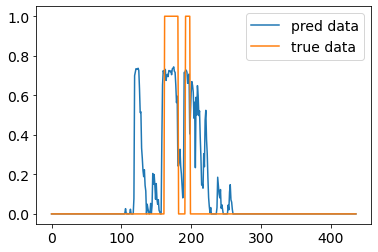

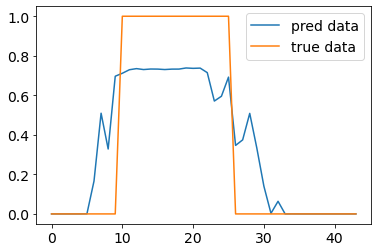

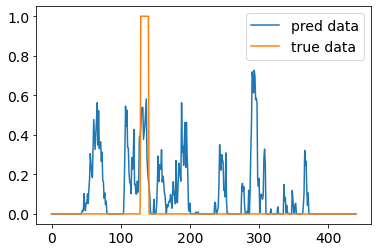

In [ ]:
plotCompare(yLittleTest, yPred_at, lstOfTime_test)

In [ ]:
model.evaluate(tested, yLittleTest)

128/128 [==============================] - 1s 3ms/step - loss: 0.2454 - accuracy: 0.8870


[0.24536384642124176, 0.8870139122009277]

# D. classification model Dense for mfcc based on MinMaxScaler, add derivatives

## simple Dense, mfcc 40

In [ ]:
model = Sequential()
model.add(Flatten(input_shape=(x_train.shape[1], x_train.shape[2])))
model.add(Dense(256, activation='relu'))
model.add(Dense(128, activation='relu'))
model.add(Dense(64, activation='relu'))
model.add(Dense(32, activation='relu'))
model.add(Dense(1, activation='sigmoid'))


In [ ]:
x_train.shape

(9315, 40, 3)

In [ ]:
y_train = y_train.reshape(-1, 1)
y_train.shape

(9315, 1)

In [ ]:
y_test = y_test.reshape(-1, 1)
y_test.shape

(1035, 1)

In [ ]:
model.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten_1 (Flatten)         (None, 120)               0         
                                                                 
 dense_20 (Dense)            (None, 256)               30976     
                                                                 
 dense_21 (Dense)            (None, 128)               32896     
                                                                 
 dense_22 (Dense)            (None, 64)                8256      
                                                                 
 dense_23 (Dense)            (None, 32)                2080      
                                                                 
 dense_24 (Dense)            (None, 1)                 33        
                                                                 
Total params: 74,241
Trainable params: 74,241
Non-trai

In [ ]:
#Компилируем сеть
model.compile(optimizer=Adam(lr=0.0001),
              loss='binary_crossentropy',
              metrics=['accuracy'])

Epoch 1/5
9315/9315 [==============================] - 22s 2ms/step - loss: 0.1351 - accuracy: 0.9428 - val_loss: 0.1687 - val_accuracy: 0.9275
Epoch 2/5
9315/9315 [==============================] - 23s 3ms/step - loss: 0.1341 - accuracy: 0.9416 - val_loss: 0.2122 - val_accuracy: 0.9295
Epoch 3/5
9315/9315 [==============================] - 22s 2ms/step - loss: 0.1299 - accuracy: 0.9464 - val_loss: 0.1615 - val_accuracy: 0.9343
Epoch 4/5
9315/9315 [==============================] - 22s 2ms/step - loss: 0.1235 - accuracy: 0.9481 - val_loss: 0.1938 - val_accuracy: 0.9304
Epoch 5/5
9315/9315 [==============================] - 21s 2ms/step - loss: 0.1169 - accuracy: 0.9504 - val_loss: 0.1686 - val_accuracy: 0.9343


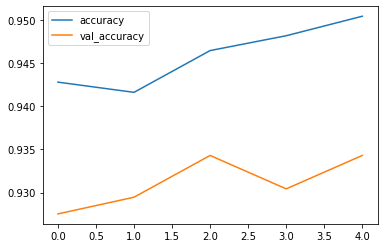

In [ ]:
history = model.fit(x_train,
                    y_train,
                    epochs=5,
                    batch_size=1,
                    validation_data=(x_test, y_test))

#Выводим график точности распознавания на обучающей и проверочной выборках
plt.plot(history.history["accuracy"], label = 'accuracy')
plt.plot(history.history["val_accuracy"], label = 'val_accuracy')
plt.legend()
plt.show()

Epoch 1/5
9315/9315 [==============================] - 23s 2ms/step - loss: 0.0924 - accuracy: 0.9601 - val_loss: 0.2138 - val_accuracy: 0.9314
Epoch 2/5
9315/9315 [==============================] - 21s 2ms/step - loss: 0.0858 - accuracy: 0.9620 - val_loss: 0.2307 - val_accuracy: 0.9324
Epoch 3/5
9315/9315 [==============================] - 21s 2ms/step - loss: 0.0823 - accuracy: 0.9663 - val_loss: 0.2876 - val_accuracy: 0.9304
Epoch 4/5
9315/9315 [==============================] - 22s 2ms/step - loss: 0.0792 - accuracy: 0.9664 - val_loss: 0.2815 - val_accuracy: 0.9314
Epoch 5/5
9315/9315 [==============================] - 22s 2ms/step - loss: 0.0767 - accuracy: 0.9673 - val_loss: 0.3058 - val_accuracy: 0.9304


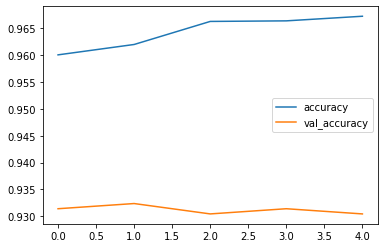

In [ ]:
history = model.fit(x_train,
                    y_train,
                    epochs=5,
                    batch_size=1,
                    validation_data=(x_test, y_test))

#Выводим график точности распознавания на обучающей и проверочной выборках
plt.plot(history.history["accuracy"], label = 'accuracy')
plt.plot(history.history["val_accuracy"], label = 'val_accuracy')
plt.legend()
plt.show()

In [ ]:
model.save('/content/drive/MyDrive/dz/mod/model_diff.h5')
model.save_weights('/content/drive/MyDrive/dz/mod/model_diff.h5')

### how predicted xTrain correspond to true yTrain

In [ ]:
yPred = model.predict(train_a) # to predict of train data

In [ ]:
yPred = np.squeeze(yPred)

In [ ]:
yPred.shape

(10350,)

In [ ]:
plotCompare(yLittle, yPred, lstOfTime)

### how predicted xTest correspond to true yTest

In [ ]:
yPred = model.predict(test_a) # to predict of train data

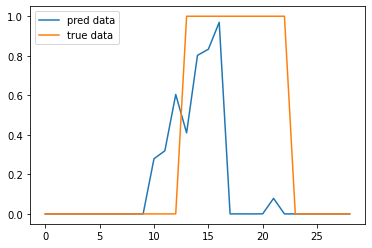

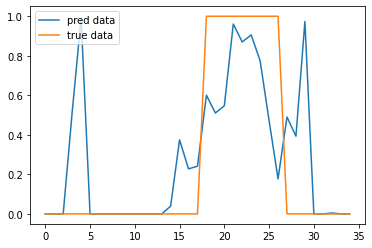

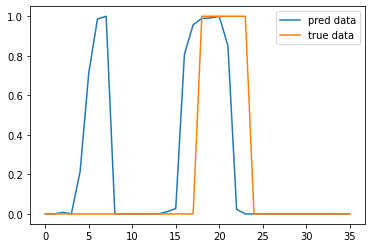

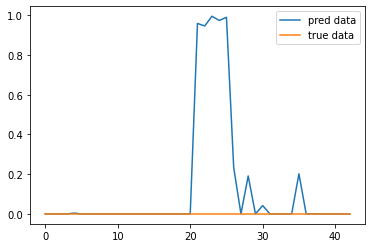

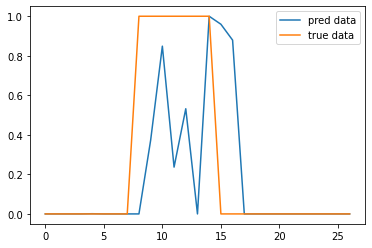

...

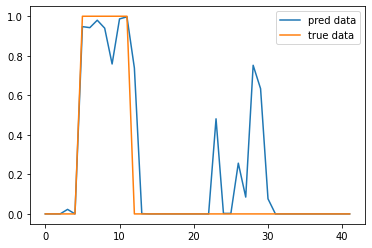

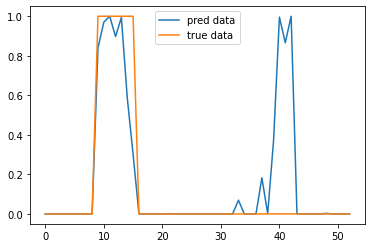

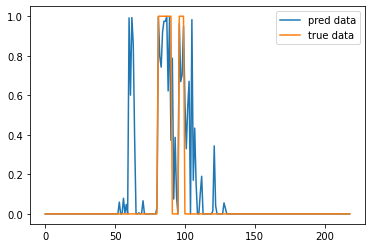

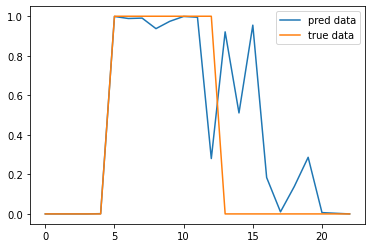

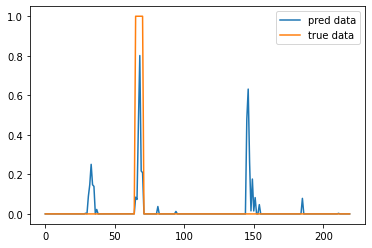

In [ ]:
plotCompare(yLittleTest, yPred, lstOfTime_test)

In [ ]:
model.evaluate(test_a, yLittleTest)

64/64 [==============================] - 1s 8ms/step - loss: 0.5477 - accuracy: 0.9101


[0.5476652979850769, 0.9101123809814453]

# E. classification model Dense for mfcc based on MinMaxScaler, add derivatives and double numbers of neurons

## simple Dense, mfcc 40

In [ ]:
model = Sequential()
model.add(Flatten(input_shape=(x_train.shape[1], x_train.shape[2])))
model.add(Dense(1024, activation='relu'))
model.add(Dense(512, activation='relu'))
model.add(Dense(256, activation='relu'))
model.add(Dense(128, activation='relu'))
model.add(Dense(1, activation='sigmoid'))


In [ ]:
x_train.shape

(9315, 40, 3)

In [ ]:
y_train = y_train.reshape(-1, 1)
y_train.shape

(9315, 1)

In [ ]:
y_test = y_test.reshape(-1, 1)
y_test.shape

(1035, 1)

In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten (Flatten)           (None, 120)               0         
                                                                 
 dense (Dense)               (None, 1024)              123904    
                                                                 
 dense_1 (Dense)             (None, 512)               524800    
                                                                 
 dense_2 (Dense)             (None, 256)               131328    
                                                                 
 dense_3 (Dense)             (None, 128)               32896     
                                                                 
 dense_4 (Dense)             (None, 1)                 129       
                                                                 
Total params: 813,057
Trainable params: 813,057
Non-trai

In [ ]:
#Компилируем сеть
model.compile(optimizer=Adam(lr=0.0001),
              loss='binary_crossentropy',
              metrics=['accuracy'])

Epoch 1/5
9315/9315 [==============================] - 73s 8ms/step - loss: 0.2332 - accuracy: 0.9041 - val_loss: 0.2351 - val_accuracy: 0.9130
Epoch 2/5
9315/9315 [==============================] - 75s 8ms/step - loss: 0.1881 - accuracy: 0.9172 - val_loss: 0.1938 - val_accuracy: 0.9198
Epoch 3/5
9315/9315 [==============================] - 81s 9ms/step - loss: 0.1805 - accuracy: 0.9225 - val_loss: 0.2257 - val_accuracy: 0.9237
Epoch 4/5
9315/9315 [==============================] - 75s 8ms/step - loss: 0.1676 - accuracy: 0.9294 - val_loss: 0.2183 - val_accuracy: 0.8918
Epoch 5/5
9315/9315 [==============================] - 72s 8ms/step - loss: 0.1620 - accuracy: 0.9309 - val_loss: 0.1862 - val_accuracy: 0.9217


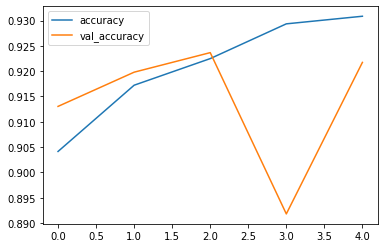

In [ ]:
history = model.fit(x_train,
                    y_train,
                    epochs=5,
                    batch_size=1,
                    validation_data=(x_test, y_test))

#Выводим график точности распознавания на обучающей и проверочной выборках
plt.plot(history.history["accuracy"], label = 'accuracy')
plt.plot(history.history["val_accuracy"], label = 'val_accuracy')
plt.legend()
plt.show()

Epoch 1/5
9315/9315 [==============================] - 71s 7ms/step - loss: 0.1328 - accuracy: 0.9445 - val_loss: 0.1833 - val_accuracy: 0.9285
Epoch 2/5
9315/9315 [==============================] - 71s 8ms/step - loss: 0.1287 - accuracy: 0.9463 - val_loss: 0.1794 - val_accuracy: 0.9266
Epoch 3/5
9315/9315 [==============================] - 69s 7ms/step - loss: 0.1263 - accuracy: 0.9470 - val_loss: 0.1935 - val_accuracy: 0.9256
Epoch 4/5
9315/9315 [==============================] - 69s 7ms/step - loss: 0.1234 - accuracy: 0.9486 - val_loss: 0.1928 - val_accuracy: 0.9198
Epoch 5/5
9315/9315 [==============================] - 71s 8ms/step - loss: 0.1212 - accuracy: 0.9494 - val_loss: 0.1990 - val_accuracy: 0.9217


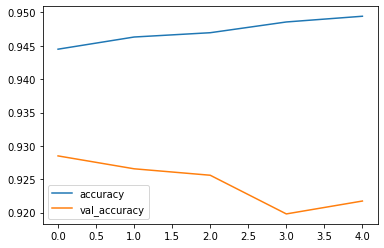

In [ ]:
history = model.fit(x_train,
                    y_train,
                    epochs=5,
                    batch_size=1,
                    validation_data=(x_test, y_test))

#Выводим график точности распознавания на обучающей и проверочной выборках
plt.plot(history.history["accuracy"], label = 'accuracy')
plt.plot(history.history["val_accuracy"], label = 'val_accuracy')
plt.legend()
plt.show()

In [ ]:
model.save('/content/drive/MyDrive/dz/mod/model_diff_big.h5')
model.save_weights('/content/drive/MyDrive/dz/mod/model_diff_big.h5')

### how predicted xTrain correspond to true yTrain

In [ ]:
yPred = model.predict(train_a) # to predict of train data

In [ ]:
yPred = np.squeeze(yPred)

In [ ]:
yPred.shape

(10350,)

In [ ]:
plotCompare(yLittle, yPred, lstOfTime)

### how predicted xTest correspond to true yTest

In [ ]:
yPred = model.predict(test_a) # to predict of train data

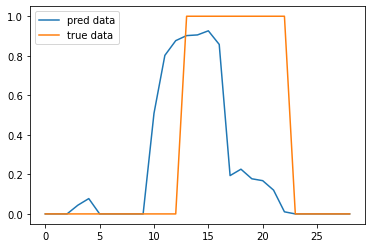

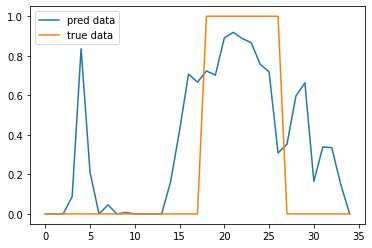

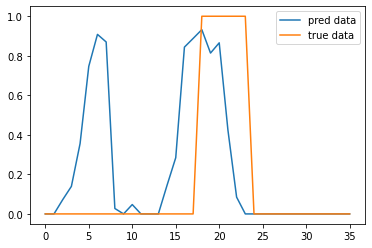

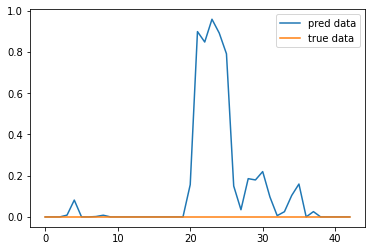

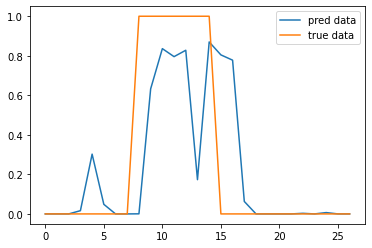

...

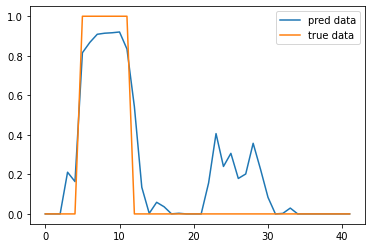

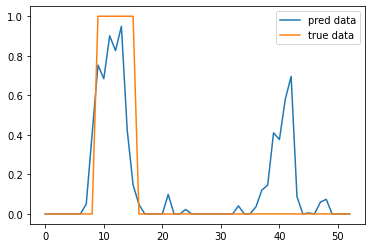

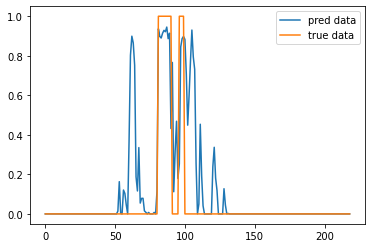

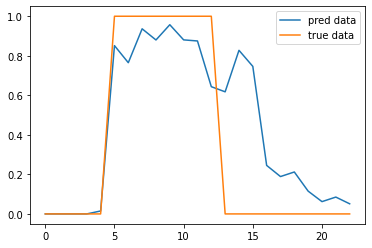

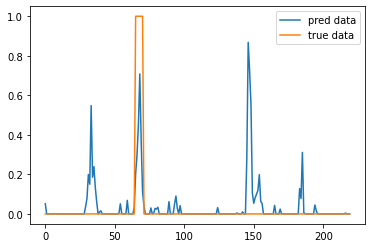

In [ ]:
plotCompare(yLittleTest, yPred, lstOfTime_test)

In [ ]:
model.evaluate(test_a, yLittleTest)

64/64 [==============================] - 1s 6ms/step - loss: 0.2880 - accuracy: 0.9126


[0.28796684741973877, 0.9125549793243408]

# F. classification model conv1d for mfcc based on MinMaxScaler, add derivatives

## conv1d

In [ ]:
input = Input(shape = (x_train.shape[1], x_train.shape[2]))

x = Conv1D(32, 2, padding="same", activation="relu")(input)

#x = MaxPooling1D(2)(x)
x = Conv1D(16, 2, padding="same", activation="relu")(x)

#x = MaxPooling1D(2)(x)
x = Conv1D(8, 2, padding="same", activation="relu")(x)

#x = MaxPooling1D(2)(x)

x = Conv1D(4, 2, padding="same", activation="relu")(x)

x = Flatten()(x)

x = Dense(64, activation='relu')(x)

x = Dense(16, activation='relu')(x)

x = Dense(1, activation='sigmoid')(x)
model = Model(input, x)

In [ ]:
x_train.shape

(9315, 40, 3)

In [ ]:
y_train = y_train.reshape(-1, 1)
y_train.shape

(9315, 1)

In [ ]:
y_test = y_test.reshape(-1, 1)
y_test.shape

(1035, 1)

In [ ]:
model.summary()

Model: "model_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_10 (InputLayer)       [(None, 40, 3)]           0         
                                                                 
 conv1d_64 (Conv1D)          (None, 40, 32)            224       
                                                                 
 conv1d_65 (Conv1D)          (None, 40, 16)            1040      
                                                                 
 conv1d_66 (Conv1D)          (None, 40, 8)             264       
                                                                 
 conv1d_67 (Conv1D)          (None, 40, 4)             68        
                                                                 
 flatten_3 (Flatten)         (None, 160)               0         
                                                                 
 dense_8 (Dense)             (None, 64)                1030

In [ ]:
#Компилируем сеть
model.compile(optimizer=Adam(lr=0.0001),
              loss='binary_crossentropy',
              metrics=['accuracy'])

Epoch 1/5
9315/9315 [==============================] - 57s 6ms/step - loss: 0.2106 - accuracy: 0.9174 - val_loss: 0.1844 - val_accuracy: 0.9198
Epoch 2/5
9315/9315 [==============================] - 56s 6ms/step - loss: 0.1581 - accuracy: 0.9308 - val_loss: 0.2307 - val_accuracy: 0.9285
Epoch 3/5
9315/9315 [==============================] - 40s 4ms/step - loss: 0.1460 - accuracy: 0.9413 - val_loss: 0.1943 - val_accuracy: 0.9169
Epoch 4/5
9315/9315 [==============================] - 34s 4ms/step - loss: 0.1367 - accuracy: 0.9431 - val_loss: 0.1519 - val_accuracy: 0.9324
Epoch 5/5
9315/9315 [==============================] - 64s 7ms/step - loss: 0.1238 - accuracy: 0.9459 - val_loss: 0.1789 - val_accuracy: 0.9353


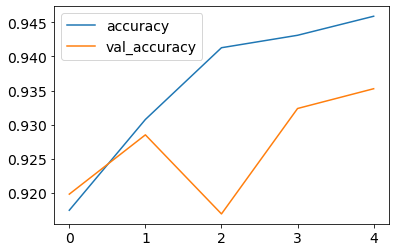

In [ ]:
history = model.fit(x_train,
                    y_train,
                    epochs=5,
                    batch_size=1,
                    validation_data=(x_test, y_test))

#Выводим график точности распознавания на обучающей и проверочной выборках
plt.plot(history.history["accuracy"], label = 'accuracy')
plt.plot(history.history["val_accuracy"], label = 'val_accuracy')
plt.legend()
plt.show()

Epoch 1/5
9315/9315 [==============================] - 34s 4ms/step - loss: 0.1170 - accuracy: 0.9498 - val_loss: 0.1626 - val_accuracy: 0.9324
Epoch 2/5
9315/9315 [==============================] - 35s 4ms/step - loss: 0.1059 - accuracy: 0.9580 - val_loss: 0.1373 - val_accuracy: 0.9517
Epoch 3/5
9315/9315 [==============================] - 41s 4ms/step - loss: 0.0939 - accuracy: 0.9610 - val_loss: 0.1392 - val_accuracy: 0.9459
Epoch 4/5
9315/9315 [==============================] - 35s 4ms/step - loss: 0.0851 - accuracy: 0.9662 - val_loss: 0.1068 - val_accuracy: 0.9614
Epoch 5/5
9315/9315 [==============================] - 43s 5ms/step - loss: 0.0775 - accuracy: 0.9713 - val_loss: 0.1332 - val_accuracy: 0.9498


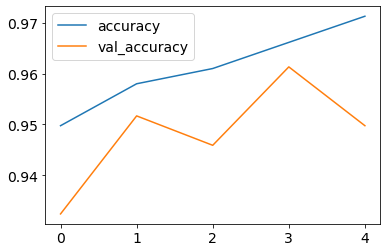

In [ ]:
history = model.fit(x_train,
                    y_train,
                    epochs=5,
                    batch_size=1,
                    validation_data=(x_test, y_test))

#Выводим график точности распознавания на обучающей и проверочной выборках
plt.plot(history.history["accuracy"], label = 'accuracy')
plt.plot(history.history["val_accuracy"], label = 'val_accuracy')
plt.legend()
plt.show()

Epoch 1/5
9315/9315 [==============================] - 32s 3ms/step - loss: 0.0680 - accuracy: 0.9732 - val_loss: 0.1463 - val_accuracy: 0.9517
Epoch 2/5
9315/9315 [==============================] - 33s 4ms/step - loss: 0.0630 - accuracy: 0.9752 - val_loss: 0.1405 - val_accuracy: 0.9565
Epoch 3/5
9315/9315 [==============================] - 35s 4ms/step - loss: 0.0577 - accuracy: 0.9783 - val_loss: 0.1412 - val_accuracy: 0.9527
Epoch 4/5
9315/9315 [==============================] - 36s 4ms/step - loss: 0.0559 - accuracy: 0.9783 - val_loss: 0.1284 - val_accuracy: 0.9575
Epoch 5/5
9315/9315 [==============================] - 35s 4ms/step - loss: 0.0497 - accuracy: 0.9812 - val_loss: 0.1238 - val_accuracy: 0.9633


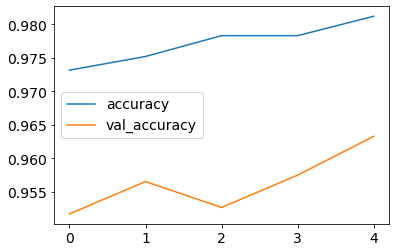

In [ ]:
history = model.fit(x_train,
                    y_train,
                    epochs=5,
                    batch_size=1,
                    validation_data=(x_test, y_test))

#Выводим график точности распознавания на обучающей и проверочной выборках
plt.plot(history.history["accuracy"], label = 'accuracy')
plt.plot(history.history["val_accuracy"], label = 'val_accuracy')
plt.legend()
plt.show()

Epoch 1/5
9315/9315 [==============================] - 39s 4ms/step - loss: 0.0112 - accuracy: 0.9965 - val_loss: 0.1650 - val_accuracy: 0.9652
Epoch 2/5
9315/9315 [==============================] - 39s 4ms/step - loss: 0.0062 - accuracy: 0.9983 - val_loss: 0.1908 - val_accuracy: 0.9633
Epoch 3/5
9315/9315 [==============================] - 35s 4ms/step - loss: 0.0044 - accuracy: 0.9988 - val_loss: 0.2048 - val_accuracy: 0.9643
Epoch 4/5
9315/9315 [==============================] - 36s 4ms/step - loss: 0.0034 - accuracy: 0.9992 - val_loss: 0.2379 - val_accuracy: 0.9662
Epoch 5/5
9315/9315 [==============================] - 35s 4ms/step - loss: 0.0019 - accuracy: 0.9996 - val_loss: 0.2794 - val_accuracy: 0.9662


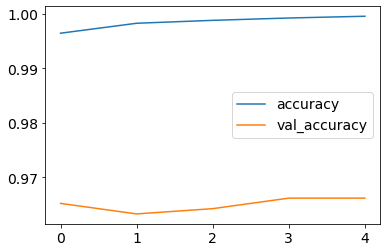

In [ ]:
history = model.fit(x_train,
                    y_train,
                    epochs=5,
                    batch_size=1,
                    validation_data=(x_test, y_test))

#Выводим график точности распознавания на обучающей и проверочной выборках
plt.plot(history.history["accuracy"], label = 'accuracy')
plt.plot(history.history["val_accuracy"], label = 'val_accuracy')
plt.legend()
plt.show()

In [ ]:
model.save('/content/drive/MyDrive/dz/mod/model_diff_conv1d.h5')
model.save_weights('/content/drive/MyDrive/dz/mod/model_diff_conv1dW.h5')

### how predicted xTrain correspond to true yTrain

In [ ]:
yPred = model.predict(train_a) # to predict of train data

In [ ]:
yPred = np.squeeze(yPred)

In [ ]:
yPred.shape

(10350,)

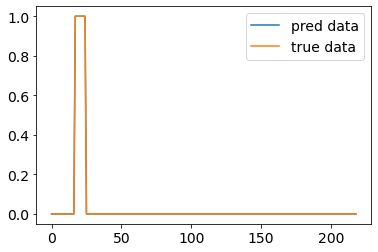

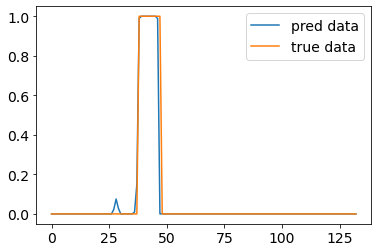

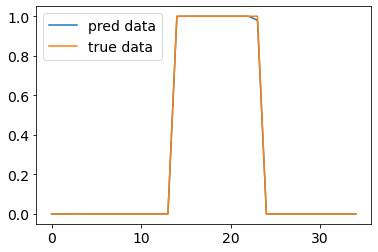

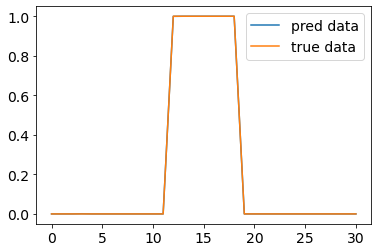

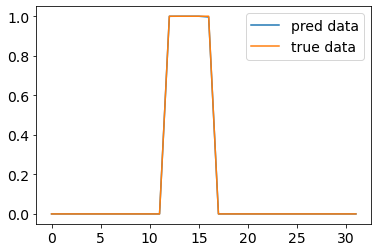

...

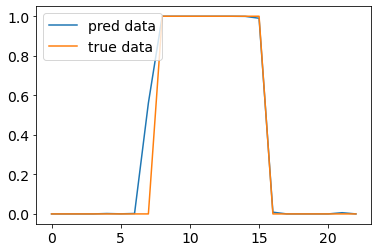

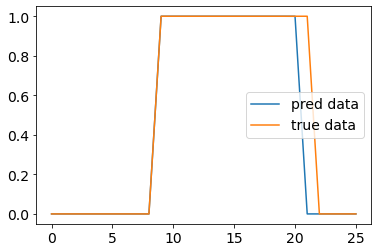

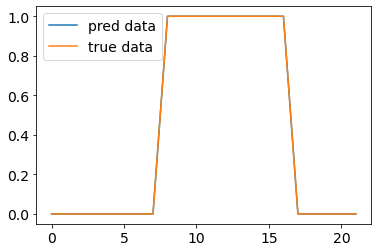

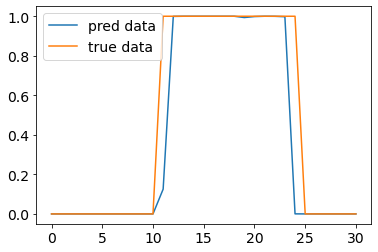

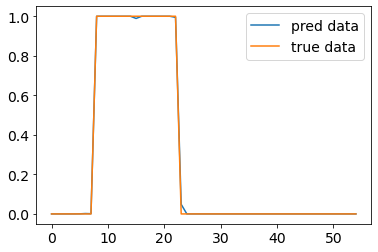

In [ ]:
plotCompare(yLittle, yPred, lstOfTime)

### how predicted xTest correspond to true yTest

In [ ]:
yPred = model.predict(test_a) # to predict of train data

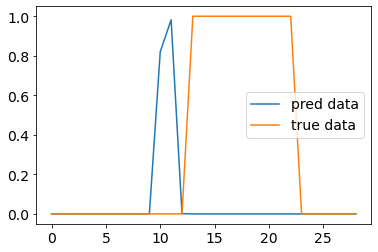

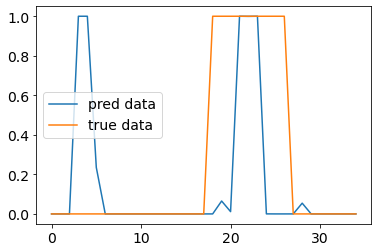

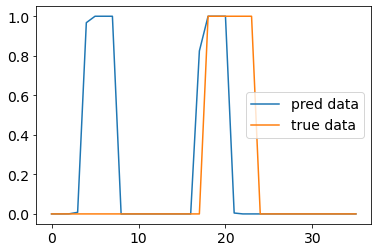

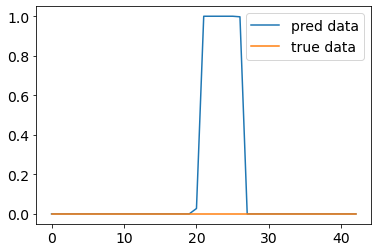

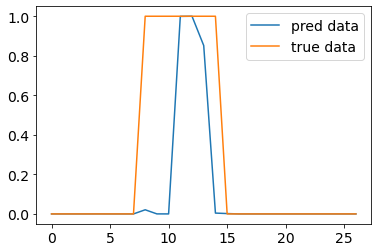

...

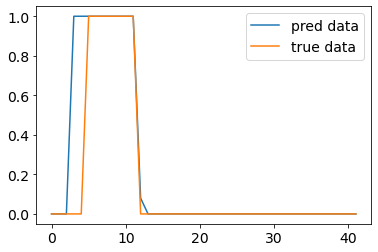

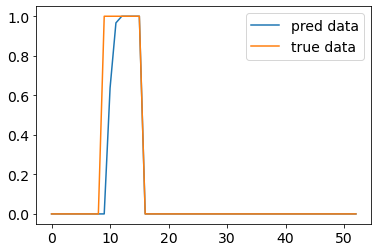

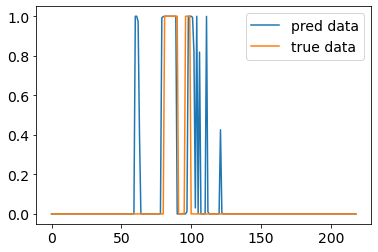

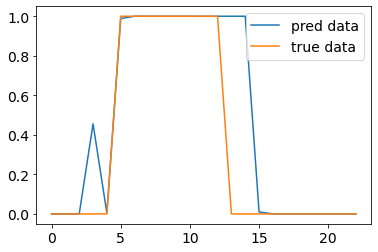

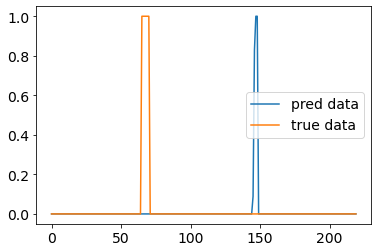

In [ ]:
plotCompare(yLittleTest, yPred, lstOfTime_test)

In [ ]:
model.evaluate(test_a, yLittleTest)

64/64 [==============================] - 0s 4ms/step - loss: 2.1578 - accuracy: 0.8837


[2.1577508449554443, 0.8837323188781738]

# visualize recognized sounds and evaluate errors in a classificator based on StandartScaler

In [ ]:
model_conv1d = load_model('/content/drive/MyDrive/dz/mod/conv1dmfcc2.h5', compile = True)

In [ ]:
model = load_model('/content/drive/MyDrive/dz/mod/model_raw_mfcc402.h5', compile = True)

In [ ]:
#model.compile(optimizer=Adam(0.0001), loss='mean_squared_error') 

Получаем предсказание вероятностей, где расположены целевые звуки

In [ ]:
# to normalize a xTest
test = scal(X_test_mfcc_i)

In [ ]:
yPred = model.predict(test) # to predict of test data

In [ ]:
#np.save('/content/drive/MyDrive/dz/pronounce/yPred.npy', yPred)
#np.save('/content/drive/MyDrive/dz/pronounce/yPred_au.npy', yPred)

In [ ]:
yPred[:28]

array([[3.1920459e-18],
       [1.6446975e-08],
       [9.9388951e-01],
       [3.0563322e-01],
       [1.4626423e-07],
       [7.7620476e-05],
       [1.2318480e-07],
       [2.8066024e-06],
       [8.2492443e-06],
       [4.9969375e-02],
       [9.4806433e-01],
       [2.8497630e-01],
       [3.7939548e-03],
       [5.0747991e-03],
       [1.2870371e-01],
       [7.2129452e-01],
       [2.9557049e-01],
       [7.9445028e-01],
       [2.3096502e-03],
       [1.1991614e-01],
       [1.4173806e-05],
       [1.3913904e-05],
       [2.4236294e-06],
       [5.4042772e-08],
       [9.2254290e-08],
       [2.2955093e-07],
       [1.2618724e-09],
       [3.1920459e-18]], dtype=float32)

In [ ]:
# yPred without preparing
yPred = np.load('/content/drive/MyDrive/dz/pronounce/yPred.npy')

Создаём вектор, по которому будем отслеживать начало и конец распознанных звуков

In [ ]:
# take a 0-1 form from yPred and choose probability than merge true or false recognized sounds
merges = recognizeMerges(yPred, 0.2)

In [ ]:
#first track and recognized sounds when we see 1
merges[:28]

array([[0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [1.],
       [1.],
       [0.],
       [0.],
       [0.],
       [1.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.]], dtype=float32)

In [ ]:
# correct of oneLst from recognizeMerges(yPred) (maybe only for a long sounds but not for [d], [t] etc)
oneLst = fillOnes(merges)

Смотрим ошибку распознавания звуков

In [ ]:
err, errL = summaError(yLittleTest, oneLst, lstOfTime_test)

realy true recognized sounds: 99
recognized like true, but is false sounds: 91
recognized like false, but is true sounds: 157
realy false recognized souns: 1700
Word Recognition Rate (to differ sounds by no-sounds): 87.88 %
Word Error Rate (to differ no-sounds by sounds): 12.12 %
Accuracy (how model find a sounds): 0.52
Fullness (how model find a no-sounds): 0.39
Harmonical mean: 0.44


In [ ]:
cm = confusion_matrix(yLittleTest, oneLst)
print(cm)

[[1700   91]
 [ 157   99]]


findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.
findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.


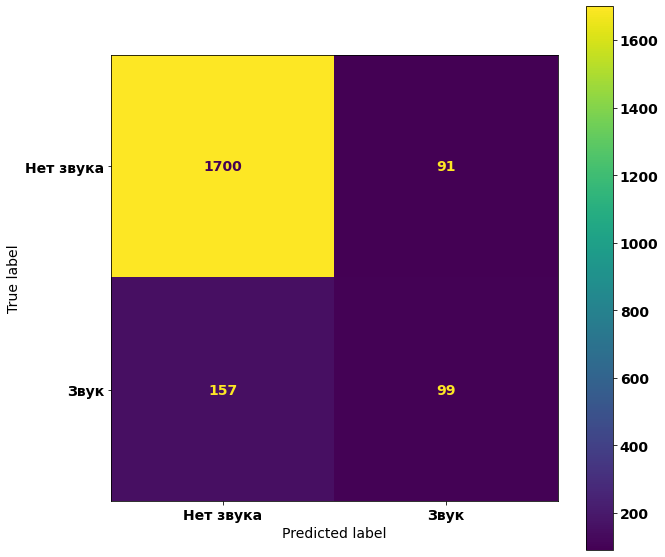

In [ ]:
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels = ['Нет звука', 'Звук'])
fig, ax = plt.subplots(figsize=(10,10))
disp.plot(ax = ax)
plt.rcParams.update({'font.size': 16})
plt.show()

Сопоставляем вероятности, начало и конец распознанных звуков относительно начала треков в тестовой выборке

In [ ]:
tracks = get_track(audio_test) # получаем номера треков

In [ ]:
kum_sum = kum_sum_range(lstOfTime_test) # получаем метки начала и конца треков относительно общей длины

In [ ]:
kum_sum

In [ ]:
# получаем вероятности, средние вероятности, границы выделенных звуков относительно начала трека и номера треков
prob_y, prob_mean_y, indexes_by_tracks, indexes_by_start, numbers, quantities = recognizeProb(yPred, oneLst, tracks, kum_sum)

отфильтровываем целевые звуки и посылаем их на обработку автоэнкодером для того, чтобы определить точность звуков. После отправляем снова на класификатор - чтобы получить вероятности.

In [ ]:
# пример границ предсказанного сетью звука
indexes_by_start[0]

array([1022, 1533])

In [ ]:
# take a fragments of xTest what net recognize as a goal-sounds for giving to autoencoder
testToCheck = toCheck(test, indexes_by_start)

In [ ]:
# получаем чистоту звука - посылаем xTest на автоэнкодер,
# а потом - чтобы получить вероятности - снова на классификатор
clarity_of_sounds = model.predict(model_conv1d.predict(testToCheck))

Суммируем вероятности относительно количества единиц 

In [ ]:
# получаем просуммированные по длине распознанных звуков вероятности после автоэнкодера
clarity_numbers = check_to_numbers(clarity_of_sounds, quantities)

представляем в виде таблицы

In [ ]:
db = pd.DataFrame()
db['Track'] = numbers
db['Start and Stop'] = indexes_by_tracks
db['Probability, %'] = np.around(prob_mean_y, 4) * 100
db['After au, %'] = np.around(scalMM(clarity_numbers), 2) * 100
db['Difference, %'] = (scalMM(clarity_numbers) - prob_mean_y) * 100
db['Mean, %'] = np.around((scalMM(clarity_numbers) + prob_mean_y)/2, 4) * 100

In [ ]:
db.head(20)

,Track,Start and Stop,"Probability, %","After au, %","Difference, %","Mean, %"
0,0,"[7154, 7665]",99.940002,1.0,-98.868988,50.510002
1,0,"[9709, 10220]",71.000000,9.0,-62.403858,39.789997
2,1,"[1022, 1533]",54.989998,0.0,-54.994320,27.500000
3,1,"[2044, 2555]",91.540001,0.0,-91.543907,45.770000
4,1,"[9709, 11753]",89.459999,0.0,-89.458626,44.730000
5,1,"[13797, 14308]",91.689995,0.0,-91.685257,45.840000
6,2,"[2044, 3066]",76.150002,1.0,-75.596451,38.350002
7,2,"[8176, 9709]",99.970001,1.0,-98.679695,50.629997
8,3,"[11753, 12264]",99.989998,0.0,-99.990181,50.000000
9,4,"[8176, 8687]",75.379997,0.0,-75.377213,37.689999


Смотрим, какие звуки распознала сеть и как именно

In [ ]:
# выбираем первый трек:
db[db['Track'] == 5]

,Track,Start and Stop,"Probability, %","After au, %","Difference, %","Mean, %"
13,5,"[1533, 2044]",31.779999,0.0,-31.784630,15.889999
14,5,"[4088, 9709]",55.779999,24.0,-31.292105,40.139999
15,5,"[10731, 11242]",27.559999,10.0,-17.742064,18.690001
16,5,"[12775, 13286]",31.380001,8.0,-23.506598,19.629999
17,5,"[13797, 14308]",45.739998,4.0,-41.768185,24.850000


In [ ]:
# enter number of the track
# enter start and end of recognized sound
getPlayer(7, 13000, 16000, audio_test)

In [ ]:
# 1 - автоэнкодер дал максимум, целевой звук именно здесь
# 7 - автоэнкодер не поддержал, классификатор распознал по максимуму. По среднему значению совпадает.
# 8 - типичный пример, когда классификатор распознал только одну из гласных дифтонга; здесь действительно нет целевого звука.
# 9 - классификатор распознал так себе, автоэнкодер не поддержал. Звук [аi] есть. Диктор прочла звук со странным призвуком в конце.
# 10 - классификатор распознал, автоэнкодер не поддержал. Диктор прочёл дифтонг напевно, растянул. Возможно, с этим связано
# 11,12 - явная ошибка, оба - за, а звук вообще не тот.
# 13 - классификатор определил правильно, но автокодировщик даёт "акцент"
# 14, 15 - один и тот же звук; наибольшая вероятность соответствовала целевому звуку; вероятность после автоэнкодера выше. В среднем оба выиграли.
# 18 - вероятность классификатора ниже, но вероятность автоэнкодера больше, и это целевой звук, хотя границы очень узкие. Плохое произношение?
# 19 - снова мужской голос, автоэнкодер показал 0
# 23 - показал максимум и вероятности классификатора, и автоэнкодера; женский голос
# 26 - звук обрезан, но показал небольшую вероятность автоэнкодер; женский голос; плохое произношение?
# 27 - максимум по классификатору, нет по автоэнкодеру. Женский голос; плохое произношение?
# 29 - второй максимум классификатора; явная ошибка. Автоэнкодер 0.
# 30 - максимум классификатора, но звук невнятный. Автоэнкодер молодец. Мужской голос.
# 32 - второй максимум классификатора. Автоэнкодер не поддержал. Правильно не поддержал. Мужской голос.
# 33 - идеальное распознавание. Автоэнкодер дал 4. Мужской голос.
# 37, 41 - максимумы классификатора. Это звук [а] и какая-то ерунда. Автоэнкодер не поддержал, молодец.
# 44 - не распознал звук ни классификатор, ни автоэнкодер.
# 46 - классификатор не распознал, а автоэнкодер дал максимум, и это как раз в точку. 
# 47 - классификатор распознал, автоэнкодер не поддержал. Плохое произношение?
# 49 - оба распознали, оба ошиблись.
# 50, 51 - распознали один и тот же звук
# 56 - не распознали звук
# 58 - не распознали звук
# 60, 61 - один и тот же звук; автоэнкодер дал небольшую вероятность
# 63, 64 - один и тот же звук; автоэнкодер дал вероятность
# 66 - классификатор распознал, автоэнкодер не поддержал. Звук звучит нечётко, глухо
# 67 - оба распознали, автоэнкодер говорит, что звук "не чистый"
# 68, 69 - один и тот же звук; автоэнкодер не поддержал. Голос мужской. 
# 70 - оба в точку; голос мужской
# 71, 72 - высокий автоэнкодер, низкий классификатор; ошибка распознания
# 73, 74 - один и тот же звук. Большая вероятность у автоэнкодера.
# 75 - вероятность кодировщика больше 0,5, вероятность автоэнкодера высокая. Правильный звук.
# 80 - классификатор распознал идеально, автоэнкодер не поддержал.
# 81 - распознали идеально, хорошая вероятность у автоэнкодера. 
# 82, 83 - оба распознали один и тот же звук; автоэнкодер дал хорошую вероятность.
# 86, 87 - один звук; классификатор распознал хорошо; автокодировщик не дал вероятность. Звук не такой звонкий, что ли.
# 91, 92 - один звук; оба распознали хорошо.

# автоэнкодер чаще поддерживает женский голос. Гипотиза: тестовая выборка выбиралась наугад; 
# возможно, в ней больше женских голосов.
# в целом, автоэнкодер отражает "чистоту" произношения. Звуки, которые подаются на автоэнкодер, 
# обрезаны при классификации. Возможно, следует изменить n_fft и задать больший плюс-минус в 500-1000 единиц. 

In [ ]:
db.to_csv('/content/drive/MyDrive/dz/pronounce/results_standart_scal.csv', index=False)

# MinMaxScaler

## visualize recognized sounds and evaluate errors in a classificator based on MinMaxScaler

In [ ]:
model_conv1d = load_model('/content/drive/MyDrive/dz/mod/conv1dmfcc.h5', compile = True)

In [ ]:
model = load_model('/content/drive/MyDrive/dz/mod/model_raw_mfcc40.h5', compile = True)

In [ ]:
#model.compile(optimizer=Adam(0.0001), loss='mean_squared_error') 

Получаем предсказание вероятностей, где расположены целевые звуки

In [ ]:
# to normalize a xTest
test = scalMM(X_test_mfcc_i)

In [ ]:
yPred = model.predict(test) # to predict of test data

In [ ]:
#np.save('/content/drive/MyDrive/dz/pronounce/yPred.npy', yPred)
#np.save('/content/drive/MyDrive/dz/pronounce/yPred_au.npy', yPred)

In [ ]:
yPred[:28]

array([[2.0011999e-18],
       [1.5570074e-02],
       [7.0397747e-01],
       [6.6210037e-01],
       [1.0821984e-06],
       [2.4053006e-06],
       [3.0991080e-07],
       [3.2930374e-03],
       [2.0579526e-01],
       [6.9213158e-01],
       [6.6779155e-01],
       [7.4209625e-01],
       [7.0814824e-01],
       [6.9896066e-01],
       [6.8620354e-01],
       [6.9204545e-01],
       [3.2075399e-01],
       [2.6410180e-01],
       [2.0105553e-01],
       [2.5292408e-01],
       [1.7606065e-01],
       [7.3870182e-02],
       [2.9009014e-02],
       [1.5764226e-06],
       [1.1735412e-07],
       [3.0555367e-02],
       [6.6660194e-10],
       [2.0011999e-18]], dtype=float32)

Создаём вектор, по которому будем отслеживать начало и конец распознанных звуков

In [ ]:
# take a 0-1 form from yPred and choose probability than merge true or false recognized sounds
merges = recognizeMerges(yPred, 0.2)

In [ ]:
#first track and recognized sounds when we see 1
merges[:28]

array([[0.],
       [0.],
       [1.],
       [1.],
       [0.],
       [0.],
       [0.],
       [0.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.]], dtype=float32)

In [ ]:
# correct of oneLst from recognizeMerges(yPred) (maybe only for a long sounds but not for [d], [t] etc)
oneLst = fillOnes(merges)

Смотрим ошибку распознавания звуков

In [ ]:
err, errL = summaError(yLittleTest, oneLst, lstOfTime_test)

realy true recognized sounds: 222
recognized like true, but is false sounds: 358
recognized like false, but is true sounds: 34
realy false recognized souns: 1433
Word Recognition Rate (to differ sounds by no-sounds): 80.85 %
Word Error Rate (to differ no-sounds by sounds): 19.15 %
Accuracy (how model find a sounds): 0.38
Fullness (how model find a no-sounds): 0.87
Harmonical mean: 0.53


In [ ]:
cm = confusion_matrix(yLittleTest, oneLst)
print(cm)

[[1433  358]
 [  34  222]]


findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.
findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.


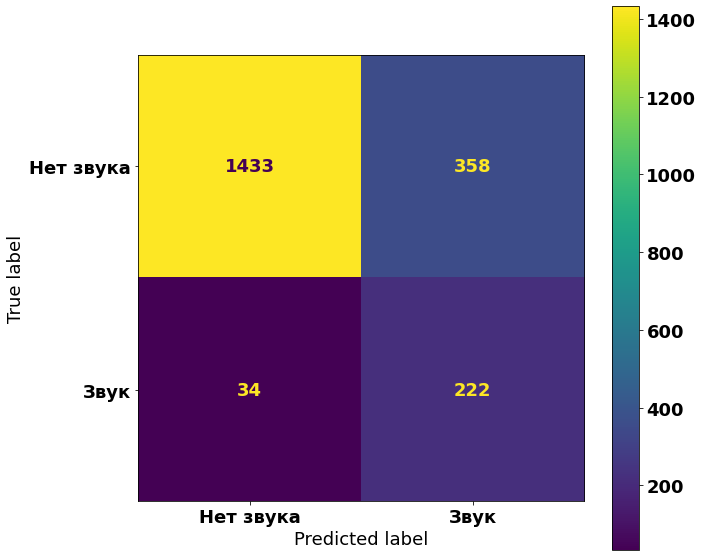

In [ ]:
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels = ['Нет звука', 'Звук'])
fig, ax = plt.subplots(figsize=(10,10))
disp.plot(ax = ax)
plt.rcParams.update({'font.size': 14})
plt.show()

Сопоставляем вероятности, начало и конец распознанных звуков относительно начала треков в тестовой выборке

In [ ]:
tracks = get_track(audio_test) # получаем номера треков

In [ ]:
kum_sum = kum_sum_range(lstOfTime_test) # получаем метки начала и конца треков относительно общей длины

In [ ]:
# получаем вероятности, средние вероятности, границы выделенных звуков относительно начала трека и номера треков
prob_y, prob_mean_y, indexes_by_tracks, indexes_by_start, numbers, quantities = recognizeProb(yPred, oneLst, tracks, kum_sum)

отфильтровываем целевые звуки и посылаем их на обработку автоэнкодером для того, чтобы определить точность звуков. После отправляем снова на класификатор - чтобы получить вероятности.

In [ ]:
# пример границ предсказанного сетью звука
indexes_by_start[0]

array([1022, 1533])

In [ ]:
# take a fragments of xTest what net recognize as a goal-sounds for giving to autoencoder
testToCheck = toCheck(test, indexes_by_start)

In [ ]:
# получаем чистоту звука - посылаем xTest на автоэнкодер,
# а потом - чтобы получить вероятности - снова на классификатор
clarity_of_sounds = model.predict(model_conv1d.predict(testToCheck))

Суммируем вероятности относительно количества единиц 

In [ ]:
# получаем просуммированные по длине распознанных звуков вероятности после автоэнкодера
clarity_numbers = check_to_numbers(clarity_of_sounds, quantities)

представляем в виде таблицы

In [ ]:
db = pd.DataFrame()
db['Track'] = numbers
db['Start and Stop'] = indexes_by_tracks
db['Probability, %'] = np.around(prob_mean_y, 4) * 100
db['After au, %'] = np.around(scalMM(clarity_numbers), 2) * 100
db['Difference, %'] = (scalMM(clarity_numbers) - prob_mean_y) * 100
db['Mean, %'] = np.around((scalMM(clarity_numbers) + prob_mean_y)/2, 4) * 100

In [ ]:
db.head(20)

,Track,Start and Stop,"Probability, %","After au, %","Difference, %","Mean, %"
0,0,"[1022, 1533]",68.300003,9.0,-59.092407,38.760002
1,0,"[4088, 9709]",51.099998,52.0,1.096058,51.650002
2,1,"[1022, 3577]",40.820000,10.0,-30.414602,25.610001
3,1,"[6643, 15841]",51.389999,94.0,42.911427,72.839996
4,2,"[1022, 3577]",57.930000,8.0,-50.185757,32.840000
5,2,"[4599, 5110]",32.500000,2.0,-30.300028,17.350000
6,2,"[7154, 10220]",59.140003,32.0,-27.560362,45.360001
7,3,"[1022, 1533]",22.340000,0.0,-22.339014,11.170000
8,3,"[9709, 13286]",65.720001,0.0,-65.575317,32.930000
9,3,"[15330, 15841]",21.799999,0.0,-21.802416,10.900000


Смотрим, какие звуки распознала сеть и как именно

In [ ]:
# выбираем первый трек:
db[db['Track'] == 9]

,Track,Start and Stop,"Probability, %","After au, %","Difference, %","Mean, %"
30,9,"[1022, 2555]",49.189999,2.000000,-46.751354,25.820000
31,9,"[6132, 12264]",50.660004,15.000001,-35.575424,32.880001
32,9,"[13286, 13797]",21.309999,3.000000,-18.324181,12.150000
33,9,"[14819, 15330]",22.470001,3.000000,-19.952892,12.490000


In [ ]:
# enter number of the track
# enter start and end of recognized sound
getPlayer(8, 6132, 12264, audio_test)

In [ ]:
# 1 - вообще чётко, целиком звук распознало.
# 3 - странно распознало, с соседними звуками
# 6 - идеально распознало.
# 7-10 - здесь и нет звука, всё верно сделал автоэнкодер.
# 12 - забраковал автоэнкодер, хотя распознано по максимуму верно.
# 14 - распознано верно, автоэнкодер даёт "акцент"
# 24 - распознано верно, голос более хриплый, даёт меньший процент на автоэнкодере и классификаторе.
# 25 - максимум, но оба явно ошиблись. 
# 26 - Второй звук распознан идеально.
# 28 - распознано идеально.
# 31 - идеально.

In [ ]:
# также возможная ошибка - выбраны односложные слова по сходной модели. Возможно, модель примерно угадывает, где должна быть буква?

In [ ]:
db.to_csv('/content/drive/MyDrive/dz/pronounce/results_minmax.csv', index=False)

## visualize recognized sounds and evaluate errors in a classificator based on MinMaxScaler. Datas pretrained by autoencoder.

In [ ]:
model_conv1d = load_model('/content/drive/MyDrive/dz/mod/conv1dmfcc_pretrain.h5', compile = True)

In [ ]:
model = load_model('/content/drive/MyDrive/dz/mod/model_raw_mfcc40_pretrain.h5', compile = True)

In [ ]:
#model.compile(optimizer=Adam(0.0001), loss='mean_squared_error') 

Получаем предсказание вероятностей, где расположены целевые звуки

In [ ]:
# to normalize a xTest
test = scalMM(X_test_mfcc_i)

In [ ]:
tested = model_conv1d.predict(test)

In [ ]:
yPred_at = model.predict(tested) # to predict of test data

In [ ]:
#yPred = model.predict(test) # to predict of test data

In [ ]:
#np.save('/content/drive/MyDrive/dz/pronounce/yPred.npy', yPred)
#np.save('/content/drive/MyDrive/dz/pronounce/yPred_au.npy', yPred)

In [ ]:
yPred_at[:28]

array([[3.0346072e-07],
       [5.8262438e-02],
       [6.4504629e-01],
       [5.2910197e-01],
       [7.1758062e-02],
       [6.3099861e-03],
       [1.7588288e-02],
       [9.0363622e-04],
       [2.3688594e-01],
       [5.5447298e-01],
       [3.9632347e-01],
       [3.6590359e-01],
       [2.7793118e-01],
       [6.1367047e-01],
       [6.3187307e-01],
       [6.3432044e-01],
       [9.1558754e-02],
       [1.9168040e-01],
       [2.7516997e-01],
       [2.4206337e-01],
       [1.7742455e-01],
       [4.9753547e-02],
       [1.9930810e-02],
       [7.1693957e-03],
       [2.2864342e-04],
       [4.7079146e-02],
       [4.6508085e-05],
       [3.0346072e-07]], dtype=float32)

Создаём вектор, по которому будем отслеживать начало и конец распознанных звуков

In [ ]:
# take a 0-1 form from yPred and choose probability than merge true or false recognized sounds
merges = recognizeMerges(yPred_at, 0.2)

In [ ]:
#first track and recognized sounds when we see 1
merges[:28]

array([[0.],
       [0.],
       [1.],
       [1.],
       [0.],
       [0.],
       [0.],
       [0.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [0.],
       [0.],
       [1.],
       [1.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.]], dtype=float32)

In [ ]:
# correct of oneLst from recognizeMerges(yPred) (maybe only for a long sounds but not for [d], [t] etc)
oneLst = fillOnes(merges)

Смотрим ошибку распознавания звуков

In [ ]:
err, errL = summaError(yLittleTest, oneLst, lstOfTime_test)

realy true recognized sounds: 184
recognized like true, but is false sounds: 277
recognized like false, but is true sounds: 72
realy false recognized souns: 1514
Word Recognition Rate (to differ sounds by no-sounds): 82.95 %
Word Error Rate (to differ no-sounds by sounds): 17.05 %
Accuracy (how model find a sounds): 0.40
Fullness (how model find a no-sounds): 0.72
Harmonical mean: 0.51


In [ ]:
cm = confusion_matrix(yLittleTest, oneLst)
print(cm)

[[1514  277]
 [  72  184]]


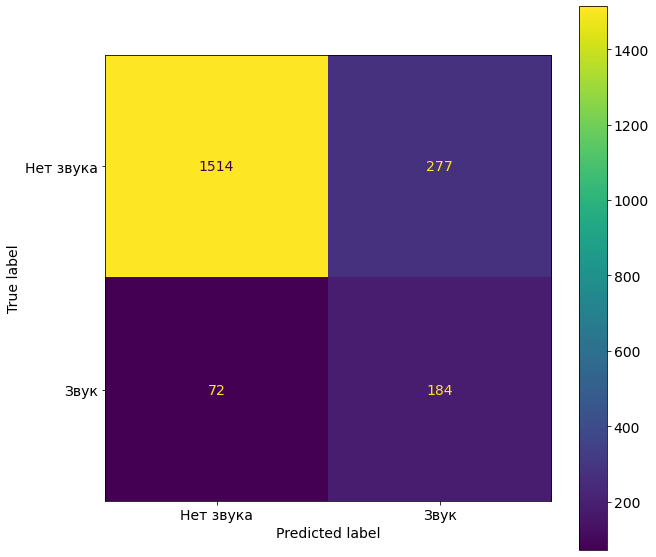

In [ ]:
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels = ['Нет звука', 'Звук'])
fig, ax = plt.subplots(figsize=(10,10))
disp.plot(ax = ax)
plt.rcParams.update({'font.size': 18})
plt.show()

Сопоставляем вероятности, начало и конец распознанных звуков относительно начала треков в тестовой выборке

In [ ]:
tracks = get_track(audio_test) # получаем номера треков

In [ ]:
kum_sum = kum_sum_range(lstOfTime_test) # получаем метки начала и конца треков относительно общей длины

In [ ]:
# получаем вероятности, средние вероятности, границы выделенных звуков относительно начала трека и номера треков
prob_y, prob_mean_y, indexes_by_tracks, indexes_by_start, numbers, quantities = recognizeProb(yPred, oneLst, tracks, kum_sum)

отфильтровываем целевые звуки и посылаем их на обработку автоэнкодером для того, чтобы определить точность звуков. После отправляем снова на класификатор - чтобы получить вероятности.

In [ ]:
# пример границ предсказанного сетью звука
indexes_by_start[0]

array([2, 3])

In [ ]:
# take a fragments of xTest what net recognize as a goal-sounds for giving to autoencoder
testToCheck = toCheck(test, indexes_by_start)

In [ ]:
# получаем чистоту звука - посылаем xTest на автоэнкодер,
# а потом - чтобы получить вероятности - снова на классификатор
clarity_of_sounds = model.predict(model_conv1d.predict(testToCheck))

Суммируем вероятности относительно количества единиц 

In [ ]:
# получаем просуммированные по длине распознанных звуков вероятности после автоэнкодера
clarity_numbers = check_to_numbers(clarity_of_sounds, quantities)

представляем в виде таблицы

In [ ]:
db = pd.DataFrame()
db['Track'] = numbers
db['Start and Stop'] = indexes_by_tracks
db['Probability, %'] = np.around(prob_mean_y, 4) * 100
db['After au, %'] = np.around(scalMM(clarity_numbers), 2) * 100
db['Difference, %'] = (scalMM(clarity_numbers) - prob_mean_y) * 100
db['Mean, %'] = np.around((scalMM(clarity_numbers) + prob_mean_y)/2, 4) * 100

In [ ]:
db.head(20)

,Track,Start and Stop,"Probability, %","After au, %","Difference, %","Mean, %"
0,0,"[1022, 1533]",68.300003,9.0,-59.053593,38.780003
1,0,"[4088, 7665]",63.660004,40.0,-23.778883,51.779999
2,0,"[9198, 9709]",22.700001,10.0,-12.818729,16.290001
3,1,"[1022, 2044]",59.429996,7.0,-52.057774,33.399998
4,1,"[6643, 7665]",27.450001,18.0,-9.814422,22.540001
5,1,"[8687, 14819]",63.209999,63.0,-0.113946,63.160004
6,2,"[1022, 3577]",57.930000,9.0,-48.570370,33.649998
7,2,"[4599, 5110]",32.500000,5.0,-27.554926,18.719999
8,2,"[7154, 9709]",64.120003,23.0,-41.421337,43.410000
9,3,"[10220, 12775]",71.919998,0.0,-71.636345,36.099998


Смотрим, какие звуки распознала сеть и как именно

In [ ]:
db_st = pd.read_csv('/content/drive/MyDrive/dz/pronounce/results_standart_scal.csv')

In [ ]:
db_au = pd.read_csv('/content/drive/MyDrive/dz/pronounce/results_minmax.csv')

In [ ]:
db_st[db_st['Track'] == 12]

,Track,Start and Stop,Probability,Probability after au,Difference,Mean
26,12,"[19418, 19929]",1.000000,0.99928,-0.000722,0.999639
27,12,"[24017, 24528]",0.360842,1.99878,1.637942,1.179813
28,12,"[35259, 35770]",0.997703,0.00000,-0.997703,0.498852
29,12,"[40369, 40880]",0.999204,0.00000,-0.999204,0.499602
30,12,"[42413, 42924]",0.999999,0.00000,-0.999999,0.499999
31,12,"[61831, 62342]",1.000000,0.00000,-1.000000,0.500000
32,12,"[65408, 65919]",0.882996,0.00000,-0.882996,0.441498
33,12,"[69496, 70007]",0.985901,0.00000,-0.985901,0.492951
34,12,"[72051, 72562]",0.998401,0.00000,-0.998401,0.499201
35,12,"[78694, 79716]",0.997746,0.00000,-0.997746,0.498873


In [ ]:
db_au[db_au['Track'] == 9]

,Track,Start and Stop,"Probability, %","After au, %","Difference, %","Mean, %"
30,9,"[1022, 2555]",49.190000,2.000000,-46.751354,25.82
31,9,"[6132, 12264]",50.660004,15.000001,-35.575424,32.88
32,9,"[13286, 13797]",21.310000,3.000000,-18.324180,12.15
33,9,"[14819, 15330]",22.470001,3.000000,-19.952892,12.49


In [ ]:
# выбираем первый трек:
db[db['Track'] == 9]

,Track,Start and Stop,"Probability, %","After au, %","Difference, %","Mean, %"
31,9,"[1022, 2555]",49.189999,14.0,-35.557522,31.41
32,9,"[6643, 11753]",55.930000,2.0,-53.559441,29.15


In [ ]:
# enter number of the track
# enter start and end of recognized sound
getPlayer(12, 77161, 79716, audio_test)

In [ ]:
# 1 - захватило соседний звук.
# 5 - захватило соседние звуки.
# 8 - отлично распознал.
# 9 - ложный звук, автоэнкодер не поддержал
# 12 - забраковал автоэнкодер, хотя распознано по максимуму верно.
# 14 - распознано верно, автоэнкодер даёт "акцент"
# 21 - ошибка
# 23, 24 - слиты два звука; распознано верно, голос более хриплый, даёт максимум на классификаторе и ничто на автоэнкодере.
# 27 - идеально.
# 28 - захватил соседний звук
# 31, 32 - распознал оба звука в слове.
# 35 - захватил соседний звук. По сравнению с "чистым" автоэнкодером дал "лишний" звук. Но дал большую точность автоэнкодером.
# 37 - чётко распознал, как и чистый автоэнкодер. 
# 39 - ложный звук и в чистом, и в предобработанном автоэнкодере. 
# 49 - наконец, угадали. 

Модели тренировались преимущественно на одно-двух-трёхсложных словах. Длинные предложения увеличивают погрешность. 

In [ ]:
db.to_csv('/content/drive/MyDrive/dz/pronounce/results_minmax_pretrained.csv', index=False)

## more powerfull autoencoder

In [ ]:
model_conv1d = load_model('/content/drive/MyDrive/dz/mod/conv1dmfcc_pretrain.h5', compile = True)

In [ ]:
model = load_model('/content/drive/MyDrive/dz/mod/model_raw_mfcc40.h5', compile = True)

In [ ]:
#model.compile(optimizer=Adam(0.0001), loss='mean_squared_error') 

Получаем предсказание вероятностей, где расположены целевые звуки

In [ ]:
# to normalize a xTest
test = scalMM(X_test_mfcc_i)

In [ ]:
tested = model_conv1d.predict(test)

In [ ]:
yPred = model.predict(test) # to predict of test data

In [ ]:
#yPred = model.predict(test) # to predict of test data

In [ ]:
#np.save('/content/drive/MyDrive/dz/pronounce/yPred.npy', yPred)
#np.save('/content/drive/MyDrive/dz/pronounce/yPred_au.npy', yPred)

Создаём вектор, по которому будем отслеживать начало и конец распознанных звуков

In [ ]:
# take a 0-1 form from yPred and choose probability than merge true or false recognized sounds
merges = recognizeMerges(yPred, 0.2)

In [ ]:
#first track and recognized sounds when we see 1
merges[:28]

array([[0.],
       [0.],
       [1.],
       [1.],
       [0.],
       [0.],
       [0.],
       [0.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.]], dtype=float32)

In [ ]:
# correct of oneLst from recognizeMerges(yPred) (maybe only for a long sounds but not for [d], [t] etc)
oneLst = fillOnes(merges)

Смотрим ошибку распознавания звуков

In [ ]:
err, errL = summaError(yLittleTest, oneLst, lstOfTime_test)

realy true recognized sounds: 222
recognized like true, but is false sounds: 358
recognized like false, but is true sounds: 34
realy false recognized souns: 1433
Word Recognition Rate (to differ sounds by no-sounds): 80.85 %
Word Error Rate (to differ no-sounds by sounds): 19.15 %
Accuracy (how model find a sounds): 0.38
Fullness (how model find a no-sounds): 0.87
Harmonical mean: 0.53


In [ ]:
cm = confusion_matrix(yLittleTest, oneLst)
print(cm)

[[1433  358]
 [  34  222]]


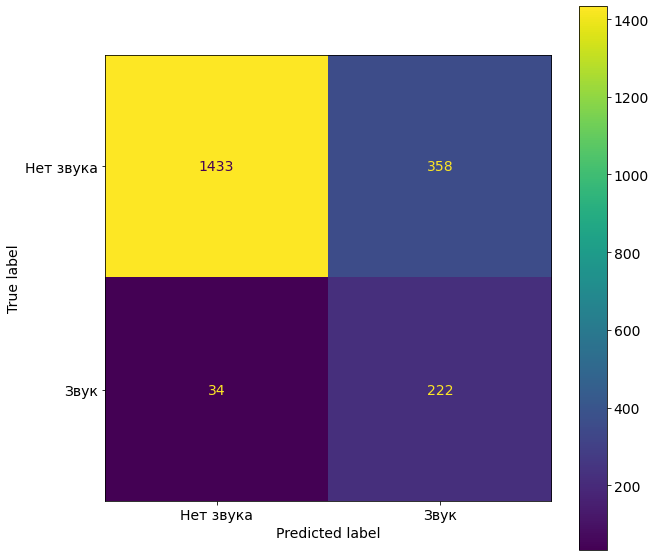

In [ ]:
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels = ['Нет звука', 'Звук'])
fig, ax = plt.subplots(figsize=(10,10))
disp.plot(ax = ax)
plt.rcParams.update({'font.size': 14})
plt.show()

Сопоставляем вероятности, начало и конец распознанных звуков относительно начала треков в тестовой выборке

In [ ]:
tracks = get_track(audio_test) # получаем номера треков

In [ ]:
kum_sum = kum_sum_range(lstOfTime_test) # получаем метки начала и конца треков относительно общей длины

In [ ]:
# получаем вероятности, средние вероятности, границы выделенных звуков относительно начала трека и номера треков
prob_y, prob_mean_y, indexes_by_tracks, indexes_by_start, numbers, quantities = recognizeProb(yPred, oneLst, tracks, kum_sum)

отфильтровываем целевые звуки и посылаем их на обработку автоэнкодером для того, чтобы определить точность звуков. После отправляем снова на класификатор - чтобы получить вероятности.

In [ ]:
# пример границ предсказанного сетью звука
indexes_by_start[0]

array([2, 3])

In [ ]:
# take a fragments of xTest what net recognize as a goal-sounds for giving to autoencoder
testToCheck = toCheck(test, indexes_by_start)

In [ ]:
# получаем чистоту звука - посылаем xTest на автоэнкодер,
# а потом - чтобы получить вероятности - снова на классификатор
clarity_of_sounds = model.predict(model_conv1d.predict(testToCheck))

Суммируем вероятности относительно количества единиц 

In [ ]:
# получаем просуммированные по длине распознанных звуков вероятности после автоэнкодера
clarity_numbers = check_to_numbers(clarity_of_sounds, quantities)

представляем в виде таблицы

In [ ]:
db = pd.DataFrame()
db['Track'] = numbers
db['Start and Stop'] = indexes_by_tracks
db['Probability, %'] = np.around(prob_mean_y, 4) * 100
db['After au, %'] = np.around(scalMM(clarity_numbers), 2) * 100
db['Difference, %'] = (scalMM(clarity_numbers) - prob_mean_y) * 100
db['Mean, %'] = np.around((scalMM(clarity_numbers) + prob_mean_y)/2, 4) * 100

In [ ]:
db.head(20)

,Track,Start and Stop,"Probability, %","After au, %","Difference, %","Mean, %"
0,0,"[1022, 1533]",68.300003,6.0,-62.616241,37.000000
1,0,"[4088, 9709]",51.099998,65.0,13.804060,58.000000
2,1,"[1022, 3577]",40.820000,13.0,-28.314981,26.660002
3,1,"[6643, 15841]",51.389999,75.0,23.706120,63.239998
4,2,"[1022, 3577]",57.930000,5.0,-52.453171,31.709999
5,2,"[4599, 5110]",32.500000,4.0,-28.208092,18.389999
6,2,"[7154, 10220]",59.140003,26.0,-33.471615,42.410000
7,3,"[1022, 1533]",22.340000,0.0,-22.196663,11.240001
8,3,"[9709, 13286]",65.720001,0.0,-65.365051,33.029999
9,3,"[15330, 15841]",21.799999,0.0,-21.802238,10.900000


Смотрим, какие звуки распознала сеть и как именно

In [ ]:
db_st = pd.read_csv('/content/drive/MyDrive/dz/pronounce/results_standart_scal.csv')

In [ ]:
db_au = pd.read_csv('/content/drive/MyDrive/dz/pronounce/results_minmax.csv')

In [ ]:
db_st[db_st['Track'] == 12]

,Track,Start and Stop,Probability,Probability after au,Difference,Mean
26,12,"[19418, 19929]",1.000000,0.99928,-0.000722,0.999639
27,12,"[24017, 24528]",0.360842,1.99878,1.637942,1.179813
28,12,"[35259, 35770]",0.997703,0.00000,-0.997703,0.498852
29,12,"[40369, 40880]",0.999204,0.00000,-0.999204,0.499602
30,12,"[42413, 42924]",0.999999,0.00000,-0.999999,0.499999
31,12,"[61831, 62342]",1.000000,0.00000,-1.000000,0.500000
32,12,"[65408, 65919]",0.882996,0.00000,-0.882996,0.441498
33,12,"[69496, 70007]",0.985901,0.00000,-0.985901,0.492951
34,12,"[72051, 72562]",0.998401,0.00000,-0.998401,0.499201
35,12,"[78694, 79716]",0.997746,0.00000,-0.997746,0.498873


In [ ]:
db_au[db_au['Track'] == 9]

,Track,Start and Stop,"Probability, %","After au, %","Difference, %","Mean, %"
30,9,"[1022, 2555]",49.190000,2.000000,-46.751354,25.82
31,9,"[6132, 12264]",50.660004,15.000001,-35.575424,32.88
32,9,"[13286, 13797]",21.310000,3.000000,-18.324180,12.15
33,9,"[14819, 15330]",22.470001,3.000000,-19.952892,12.49


In [ ]:
# выбираем первый трек:
db[db['Track'] == 9]

,Track,Start and Stop,"Probability, %","After au, %","Difference, %","Mean, %"
31,9,"[1022, 2555]",49.189999,14.0,-35.557522,31.41
32,9,"[6643, 11753]",55.930000,2.0,-53.559441,29.15


In [ ]:
# enter number of the track
# enter start and end of recognized sound
getPlayer(12, 77161, 79716, audio_test)

In [ ]:
# 1 - захватило соседний звук.
# 5 - захватило соседние звуки.
# 8 - отлично распознал.
# 9 - ложный звук, автоэнкодер не поддержал
# 12 - забраковал автоэнкодер, хотя распознано по максимуму верно.
# 14 - распознано верно, автоэнкодер даёт "акцент"
# 21 - ошибка
# 23, 24 - слиты два звука; распознано верно, голос более хриплый, даёт максимум на классификаторе и ничто на автоэнкодере.
# 27 - идеально.
# 28 - захватил соседний звук
# 31, 32 - распознал оба звука в слове.
# 35 - захватил соседний звук. По сравнению с "чистым" автоэнкодером дал "лишний" звук. Но дал большую точность автоэнкодером.
# 37 - чётко распознал, как и чистый автоэнкодер. 
# 39 - ложный звук и в чистом, и в предобработанном автоэнкодере. 
# 49 - наконец, угадали. 

Модели тренировались преимущественно на одно-двух-трёхсложных словах. Длинные предложения увеличивают погрешность. 

In [ ]:
db.to_csv('/content/drive/MyDrive/dz/pronounce/results_minmax_au_pow.csv', index=False)

# MinMaxScaler + 255 nfft

## visualize recognized sounds and evaluate errors in a classificator based on MinMaxScaler

In [ ]:
model_conv1d = load_model('/content/drive/MyDrive/dz/mod/conv1dmfcc.h5', compile = True)

In [ ]:
model = load_model('/content/drive/MyDrive/dz/mod/model_raw_mfcc40.h5', compile = True)

In [ ]:
#model.compile(optimizer=Adam(0.0001), loss='mean_squared_error') 

Получаем предсказание вероятностей, где расположены целевые звуки

In [ ]:
# to normalize a xTest
test = scalMM(X_test_mfcc_i)

In [ ]:
yPred = model.predict(test) # to predict of test data

In [ ]:
#np.save('/content/drive/MyDrive/dz/pronounce/yPred.npy', yPred)
#np.save('/content/drive/MyDrive/dz/pronounce/yPred_au.npy', yPred)

Создаём вектор, по которому будем отслеживать начало и конец распознанных звуков

In [ ]:
# take a 0-1 form from yPred and choose probability than merge true or false recognized sounds
merges = recognizeMerges(yPred, 0.2)

In [ ]:
#first track and recognized sounds when we see 1
merges[:28]

array([[0.],
       [0.],
       [0.],
       [1.],
       [1.],
       [1.],
       [1.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.]], dtype=float32)

In [ ]:
# correct of oneLst from recognizeMerges(yPred) (maybe only for a long sounds but not for [d], [t] etc)
oneLst = fillOnes(merges)

Смотрим ошибку распознавания звуков

In [ ]:
err, errL = summaError(yLittleTest, oneLst, lstOfTime_test)

realy true recognized sounds: 460
recognized like true, but is false sounds: 707
recognized like false, but is true sounds: 54
realy false recognized souns: 2868
Word Recognition Rate (to differ sounds by no-sounds): 81.39 %
Word Error Rate (to differ no-sounds by sounds): 18.61 %
Accuracy (how model find a sounds): 0.39
Fullness (how model find a no-sounds): 0.89
Harmonical mean: 0.55


In [ ]:
cm = confusion_matrix(yLittleTest, oneLst)
print(cm)

[[1433  358]
 [  34  222]]


In [ ]:
cm = confusion_matrix(yLittleTest, oneLst)
print(cm)

[[2868  707]
 [  54  460]]


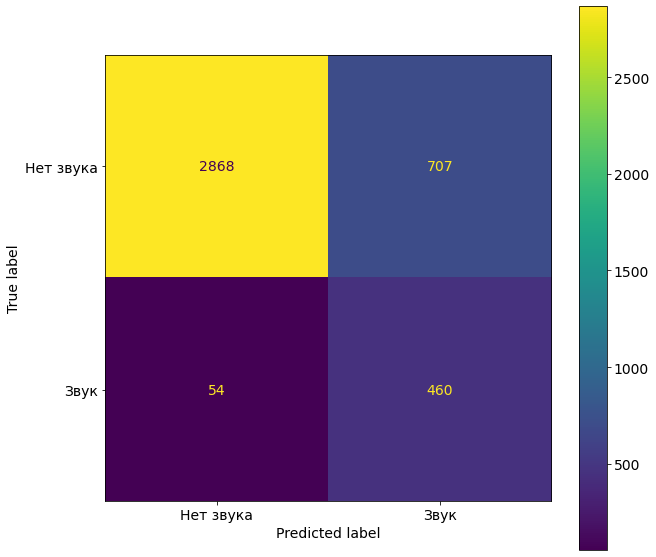

In [ ]:
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels = ['Нет звука', 'Звук'])
fig, ax = plt.subplots(figsize=(10,10))
disp.plot(ax = ax)
plt.rcParams.update({'font.size': 18})
plt.show()

Сопоставляем вероятности, начало и конец распознанных звуков относительно начала треков в тестовой выборке

In [ ]:
tracks = get_track(audio_test) # получаем номера треков

In [ ]:
kum_sum = kum_sum_range(lstOfTime_test) # получаем метки начала и конца треков относительно общей длины

In [ ]:
# получаем вероятности, средние вероятности, границы выделенных звуков относительно начала трека и номера треков
prob_y, prob_mean_y, indexes_by_tracks, indexes_by_start, numbers, quantities = recognizeProb(yPred, oneLst, tracks, kum_sum)

отфильтровываем целевые звуки и посылаем их на обработку автоэнкодером для того, чтобы определить точность звуков. После отправляем снова на класификатор - чтобы получить вероятности.

In [ ]:
# пример границ предсказанного сетью звука
indexes_by_start[0]

array([3, 6])

In [ ]:
# take a fragments of xTest what net recognize as a goal-sounds for giving to autoencoder
testToCheck = toCheck(test, indexes_by_start)

In [ ]:
# получаем чистоту звука - посылаем xTest на автоэнкодер,
# а потом - чтобы получить вероятности - снова на классификатор
clarity_of_sounds = model.predict(model_conv1d.predict(testToCheck))

Суммируем вероятности относительно количества единиц 

In [ ]:
# получаем просуммированные по длине распознанных звуков вероятности после автоэнкодера
clarity_numbers = check_to_numbers(clarity_of_sounds, quantities)

представляем в виде таблицы

In [ ]:
db = pd.DataFrame()
db['Track'] = numbers
db['Start and Stop'] = indexes_by_tracks
db['Probability, %'] = np.around(prob_mean_y, 4) * 100
db['After au, %'] = np.around(scalMM(clarity_numbers), 2) * 100
db['Difference, %'] = (scalMM(clarity_numbers) - prob_mean_y) * 100
db['Mean, %'] = np.around((scalMM(clarity_numbers) + prob_mean_y)/2, 4) * 100

In [ ]:
db.head(20)

,Track,Start and Stop,"Probability, %","After au, %","Difference, %","Mean, %"
0,0,"[765, 1530]",53.380001,15.000001,-37.949776,34.400002
1,0,"[4080, 10455]",49.810001,83.000000,33.341797,66.479996
2,1,"[1020, 2295]",62.190002,15.000001,-47.120007,38.630001
3,1,"[3060, 3315]",28.810001,0.000000,-28.654823,14.490000
4,1,"[3570, 3825]",20.320000,0.000000,-20.315044,10.170000
5,1,"[6630, 15300]",59.230000,100.000000,40.767990,79.619995
6,1,"[15810, 16065]",39.660000,4.000000,-35.333652,22.000000
7,2,"[765, 3825]",57.680000,34.000000,-23.636663,45.869999
8,2,"[4335, 4590]",26.350000,1.000000,-25.528059,13.580000
9,2,"[6630, 10965]",56.110001,47.000000,-9.102246,51.560001


Смотрим, какие звуки распознала сеть и как именно

In [ ]:
# выбираем первый трек:
db[db['Track'] == 0]

,Track,Start and Stop,"Probability, %","After au, %","Difference, %","Mean, %"
0,0,"[765, 1530]",53.380001,15.000001,-37.949776,34.400002
1,0,"[4080, 10455]",49.810001,83.000000,33.341797,66.479996


In [ ]:
# enter number of the track
# enter start and end of recognized sound
getPlayer(0, 4080, 10455, audio_test)

In [ ]:
# 1 - вообще чётко, целиком звук распознало.
# 3 - странно распознало, с соседними звуками
# 6 - идеально распознало.
# 7-10 - здесь и нет звука, всё верно сделал автоэнкодер.
# 12 - забраковал автоэнкодер, хотя распознано по максимуму верно.
# 14 - распознано верно, автоэнкодер даёт "акцент"
# 24 - распознано верно, голос более хриплый, даёт меньший процент на автоэнкодере и классификаторе.
# 25 - максимум, но оба явно ошиблись. 
# 26 - Второй звук распознан идеально.
# 28 - распознано идеально.
# 31 - идеально.

In [ ]:
# также возможная ошибка - выбраны односложные слова по сходной модели. Возможно, модель примерно угадывает, где должна быть буква?

In [ ]:
db.to_csv('/content/drive/MyDrive/dz/pronounce/results_minmax_255.csv', index=False)

## visualize recognized sounds and evaluate errors in a classificator based on MinMaxScaler. Datas pretrained by autoencoder.

In [ ]:
model_conv1d = load_model('/content/drive/MyDrive/dz/mod/conv1dmfcc_pretrain.h5', compile = True)

In [ ]:
model = load_model('/content/drive/MyDrive/dz/mod/model_raw_mfcc40_pretrain.h5', compile = True)

In [ ]:
#model.compile(optimizer=Adam(0.0001), loss='mean_squared_error') 

Получаем предсказание вероятностей, где расположены целевые звуки

In [ ]:
# to normalize a xTest
test = scalMM(X_test_mfcc_i)

In [ ]:
tested = scalMM(np.squeeze(model_conv1d.predict(test))) # плюс нормализуем, чтобы если автоэнкодер нашкодил, то уладить выбросы

In [ ]:
yPred_at = model.predict(tested) # to predict of test data

In [ ]:
#yPred = model.predict(test) # to predict of test data

In [ ]:
#np.save('/content/drive/MyDrive/dz/pronounce/yPred.npy', yPred)
#np.save('/content/drive/MyDrive/dz/pronounce/yPred_au.npy', yPred)

Создаём вектор, по которому будем отслеживать начало и конец распознанных звуков

In [ ]:
# take a 0-1 form from yPred and choose probability than merge true or false recognized sounds
merges = recognizeMerges(yPred_at, 0.2)

In [ ]:
#first track and recognized sounds when we see 1
merges[:28]

array([[0.],
       [0.],
       [0.],
       [1.],
       [1.],
       [1.],
       [1.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.]], dtype=float32)

In [ ]:
# correct of oneLst from recognizeMerges(yPred) (maybe only for a long sounds but not for [d], [t] etc)
oneLst = fillOnes(merges)

Смотрим ошибку распознавания звуков

In [ ]:
err, errL = summaError(yLittleTest, oneLst, lstOfTime_test)

realy true recognized sounds: 440
recognized like true, but is false sounds: 673
recognized like false, but is true sounds: 74
realy false recognized souns: 2902
Word Recognition Rate (to differ sounds by no-sounds): 81.73 %
Word Error Rate (to differ no-sounds by sounds): 18.27 %
Accuracy (how model find a sounds): 0.40
Fullness (how model find a no-sounds): 0.86
Harmonical mean: 0.54


In [ ]:
cm = confusion_matrix(yLittleTest, oneLst)
print(cm)

[[1514  277]
 [  72  184]]


In [ ]:
cm = confusion_matrix(yLittleTest, oneLst)
print(cm)

[[2902  673]
 [  74  440]]


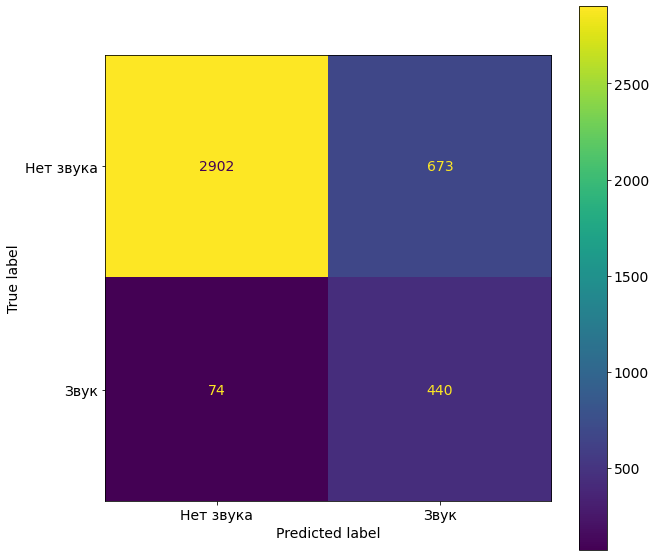

In [ ]:
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels = ['Нет звука', 'Звук'])
fig, ax = plt.subplots(figsize=(10,10))
disp.plot(ax = ax)
plt.rcParams.update({'font.size': 14})
plt.show()

Сопоставляем вероятности, начало и конец распознанных звуков относительно начала треков в тестовой выборке

In [ ]:
tracks = get_track(audio_test) # получаем номера треков

In [ ]:
kum_sum = kum_sum_range(lstOfTime_test) # получаем метки начала и конца треков относительно общей длины

In [ ]:
# получаем вероятности, средние вероятности, границы выделенных звуков относительно начала трека и номера треков
prob_y, prob_mean_y, indexes_by_tracks, indexes_by_start, numbers, quantities = recognizeProb(yPred, oneLst, tracks, kum_sum)

отфильтровываем целевые звуки и посылаем их на обработку автоэнкодером для того, чтобы определить точность звуков. После отправляем снова на класификатор - чтобы получить вероятности.

In [ ]:
# пример границ предсказанного сетью звука
indexes_by_start[0]

array([3, 6])

In [ ]:
# take a fragments of xTest what net recognize as a goal-sounds for giving to autoencoder
testToCheck = toCheck(test, indexes_by_start)

In [ ]:
# получаем чистоту звука - посылаем xTest на автоэнкодер,
# а потом - чтобы получить вероятности - снова на классификатор
clarity_of_sounds = model.predict(model_conv1d.predict(testToCheck))

Суммируем вероятности относительно количества единиц 

In [ ]:
# получаем просуммированные по длине распознанных звуков вероятности после автоэнкодера
clarity_numbers = check_to_numbers(clarity_of_sounds, quantities)

представляем в виде таблицы

In [ ]:
db = pd.DataFrame()
db['Track'] = numbers
db['Start and Stop'] = indexes_by_tracks
db['Probability, %'] = np.around(prob_mean_y, 4) * 100
db['After au, %'] = np.around(scalMM(clarity_numbers), 2) * 100
db['Difference, %'] = (scalMM(clarity_numbers) - prob_mean_y) * 100
db['Mean, %'] = np.around((scalMM(clarity_numbers) + prob_mean_y)/2, 4) * 100

In [ ]:
db.head(20)

,Track,Start and Stop,"Probability, %","After au, %","Difference, %","Mean, %"
0,0,"[765, 1530]",53.380001,19.0,-34.623451,36.070000
1,0,"[4080, 7650]",62.660004,67.0,4.060996,64.690002
2,0,"[8160, 8415]",32.300003,4.0,-28.611082,18.000000
3,0,"[8925, 9945]",38.130001,22.0,-15.994295,30.129999
4,1,"[1020, 2550]",55.349998,8.0,-47.225578,31.740002
5,1,"[3060, 3315]",28.810001,0.0,-28.813332,14.410000
6,1,"[7395, 7650]",53.149998,0.0,-53.143967,26.570002
7,1,"[7905, 15045]",64.480003,78.0,13.337541,71.150002
8,2,"[765, 4080]",54.830002,55.0,0.123888,54.889999
9,2,"[6885, 11220]",55.949997,35.0,-21.088505,45.410000


Смотрим, какие звуки распознала сеть и как именно

In [ ]:
db_au = pd.read_csv('/content/drive/MyDrive/dz/pronounce/results_minmax_255.csv')
db = pd.read_csv('/content/drive/MyDrive/dz/pronounce/results_minmax_pretrained_255.csv')

In [ ]:
db_au[db_au['Track'] == 10]

,Track,Start and Stop,"Probability, %","After au, %","Difference, %","Mean, %"
45,10,"[1275, 3570]",48.57,33.0,-15.317276,40.91
46,10,"[8160, 13260]",61.23,42.0,-19.601595,51.43


In [ ]:
# выбираем первый трек:
db[db['Track'] == 10]

,Track,Start and Stop,"Probability, %","After au, %","Difference, %","Mean, %"
41,10,"[1275, 5100]",35.91,54.000004,18.328785,45.070000
42,10,"[8160, 13260]",61.23,52.999996,-8.053356,57.200005


In [ ]:
# enter number of the track
# enter start and end of recognized sound
getPlayer(10, 8160, 13260, audio_test)

In [ ]:
# 1, - захватило соседний звук. Без предобработки точнее, с предобработкой обрезал
# 5,7 - захватило соседние звуки. С предобработкой дал точнее.
# 9 - хорошо распознали оба, с предобработкой чуть захватил соседний звук
# трек № 3 оба показали,  что звуки есть, хотя их и близко нет.
# 51, 46 распознали, но с погрешностями; чистый звук [а] был принят как дифтонг обоими. 
# в этом треке два звука ай, но в остальных предсказанных они потерялись.


Модели тренировались преимущественно на одно-двух-трёхсложных словах. Длинные предложения увеличивают погрешность. 

In [ ]:
db.to_csv('/content/drive/MyDrive/dz/pronounce/results_minmax_pretrained_255.csv', index=False)

# MinMaxScaler + derivatives

## MinMaxScaler, derivatives, classifier 3 dim, autoencoder 3 dim

In [ ]:
model_conv1d = load_model('/content/drive/MyDrive/dz/mod/conv1dmfcc.h5', compile = True)

In [ ]:
model = load_model('/content/drive/MyDrive/dz/mod/model_raw_mfcc40.h5', compile = True)

In [ ]:
#model.compile(optimizer=Adam(0.0001), loss='mean_squared_error') 

Получаем предсказание вероятностей, где расположены целевые звуки

In [ ]:
# to normalize a xTest
test = scalMM(X_test_mfcc_i)

In [ ]:
yPred = model.predict(test) # to predict of test data

In [ ]:
#np.save('/content/drive/MyDrive/dz/pronounce/yPred.npy', yPred)
#np.save('/content/drive/MyDrive/dz/pronounce/yPred_au.npy', yPred)

Создаём вектор, по которому будем отслеживать начало и конец распознанных звуков

In [ ]:
# take a 0-1 form from yPred and choose probability than merge true or false recognized sounds
merges = recognizeMerges(yPred, 0.2)

In [ ]:
#first track and recognized sounds when we see 1
merges[:28]

array([[0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.]], dtype=float32)

In [ ]:
# correct of oneLst from recognizeMerges(yPred) (maybe only for a long sounds but not for [d], [t] etc)
oneLst = fillOnes(merges)

Смотрим ошибку распознавания звуков

In [ ]:
err, errL = summaError(yLittleTest, oneLst, lstOfTime_test)

realy true recognized sounds: 192
recognized like true, but is false sounds: 159
recognized like false, but is true sounds: 64
realy false recognized souns: 1632
Word Recognition Rate (to differ sounds by no-sounds): 89.11 %
Word Error Rate (to differ no-sounds by sounds): 10.89 %
Accuracy (how model find a sounds): 0.55
Fullness (how model find a no-sounds): 0.75
Harmonical mean: 0.63


In [ ]:
cm = confusion_matrix(yLittleTest, oneLst)
print(cm)

[[1433  358]
 [  34  222]]


In [ ]:
cm = confusion_matrix(yLittleTest, oneLst)
print(cm)

[[2868  707]
 [  54  460]]


In [ ]:
cm = confusion_matrix(yLittleTest, oneLst)
print(cm)

[[1632  159]
 [  64  192]]


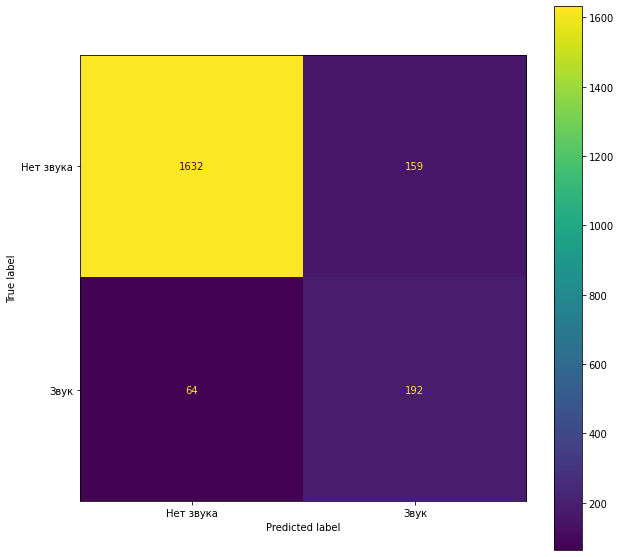

In [ ]:
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels = ['Нет звука', 'Звук'])
fig, ax = plt.subplots(figsize=(10,10))
disp.plot(ax = ax)
plt.rcParams.update({'font.size': 18})
plt.show()

Сопоставляем вероятности, начало и конец распознанных звуков относительно начала треков в тестовой выборке

In [ ]:
tracks = get_track(audio_test) # получаем номера треков

In [ ]:
kum_sum = kum_sum_range(lstOfTime_test) # получаем метки начала и конца треков относительно общей длины

In [ ]:
# получаем вероятности, средние вероятности, границы выделенных звуков относительно начала трека и номера треков
prob_y, prob_mean_y, indexes_by_tracks, indexes_by_start, numbers, quantities = recognizeProb(yPred, oneLst, tracks, kum_sum)

отфильтровываем целевые звуки и посылаем их на обработку автоэнкодером для того, чтобы определить точность звуков. После отправляем снова на класификатор - чтобы получить вероятности.

In [ ]:
# пример границ предсказанного сетью звука
indexes_by_start[0]

array([10, 16])

In [ ]:
# take a fragments of xTest what net recognize as a goal-sounds for giving to autoencoder
testToCheck = toCheck(test_a, indexes_by_start)

In [ ]:
a = model_conv1d.predict(testToCheck)
a.shape

In [ ]:
# получаем чистоту звука - посылаем xTest на автоэнкодер,
# а потом - чтобы получить вероятности - снова на классификатор
clarity_of_sounds = model.predict(model_conv1d.predict(testToCheck))

Суммируем вероятности относительно количества единиц 

In [ ]:
# получаем просуммированные по длине распознанных звуков вероятности после автоэнкодера
clarity_numbers = check_to_numbers(clarity_of_sounds, quantities)

представляем в виде таблицы

In [ ]:
db = pd.DataFrame()
db['Track'] = numbers
db['Start and Stop'] = indexes_by_tracks
db['Probability, %'] = np.around(prob_mean_y, 4) * 100
db['After au, %'] = np.around(scalMM(clarity_numbers), 2) * 100
db['Difference, %'] = (scalMM(clarity_numbers) - prob_mean_y) * 100
db['Mean, %'] = np.around((scalMM(clarity_numbers) + prob_mean_y)/2, 4) * 100

In [ ]:
db.head(20)

,Track,Start and Stop,"Probability, %","After au, %","Difference, %","Mean, %"
0,0,"[5110, 8176]",60.240002,32.0,-28.700199,45.889999
1,1,"[1533, 2044]",75.180000,2.0,-73.561188,38.400002
2,1,"[7665, 12775]",58.960003,72.0,13.426220,65.669998
3,1,"[13797, 14819]",61.900002,0.0,-61.834431,30.980000
4,2,"[2044, 3577]",72.809998,41.0,-31.426367,57.099998
5,2,"[8176, 10731]",93.239998,39.0,-54.450851,66.009995
6,3,"[10731, 13286]",84.959999,1.0,-84.243980,42.840000
7,3,"[17885, 18396]",20.190001,13.0,-7.646607,16.370001
8,4,"[4599, 6132]",49.759998,16.0,-33.994911,32.760002
9,4,"[7154, 8176]",94.620003,0.0,-94.621643,47.310001


Смотрим, какие звуки распознала сеть и как именно

In [ ]:
db_der = pd.read_csv('/content/drive/MyDrive/dz/pronounce/results_minmax_diff.csv')
db = pd.read_csv('/content/drive/MyDrive/dz/pronounce/results_minmax.csv')

In [ ]:
# выбираем трек:
db[db['Track'] == 4]

,Track,Start and Stop,"Probability, %","After au, %","Difference, %","Mean, %"
11,4,"[1022, 1533]",29.06,0.0,-29.040974,14.54
12,4,"[3577, 8176]",49.84,0.0,-49.842010,24.92


In [ ]:
db_der[db['Track'] == 3]

,Track,Start and Stop,"Probability, %","After au, %","Difference, %","Mean, %"
7,3,"[17885, 18396]",20.19,13.0,-7.646607,16.370000
8,4,"[4599, 6132]",49.76,16.0,-33.994910,32.760002
9,4,"[7154, 8176]",94.62,0.0,-94.621640,47.310000
10,5,"[4599, 8176]",74.73,63.0,-11.764389,68.850000


In [ ]:
# enter number of the track
# enter start and end of recognized sound
getPlayer(4, 6500, 8500, audio_test)

In [ ]:
# 0 - вообще чётко c производными, целиком звук распознало. Границы чётче. Чистота звука ниже с производными. 
# возможно, связано с меньшей точностью автоэнкодера. 
# даже звук а с производными более точно выделен.
# 3 - странно распознало, с соседними звуками
# 6 - идеально распознало.
# 7-10 - здесь и нет звука, всё верно сделал автоэнкодер.
# 12 - забраковал автоэнкодер, хотя распознано по максимуму верно.
# 14 - распознано верно, автоэнкодер даёт "акцент"
# 24 - распознано верно, голос более хриплый, даёт меньший процент на автоэнкодере и классификаторе.
# 25 - максимум, но оба явно ошиблись. 
# 26 - Второй звук распознан идеально.
# 28 - распознано идеально.
# 31 - идеально.

In [ ]:
# также возможная ошибка - выбраны односложные слова по сходной модели. Возможно, модель примерно угадывает, где должна быть буква?

In [ ]:
db.to_csv('/content/drive/MyDrive/dz/pronounce/results_minmax_diff.csv', index=False)

##  MinMaxScaler, derivatives, more neurons by classifier by 3 dimentions and best autoencoder by 1 dimentions

In [ ]:
model_conv1d = load_model('/content/drive/MyDrive/dz/mod/conv1dmfcc.h5', compile = True)

In [ ]:
#model = load_model('/content/drive/MyDrive/dz/mod/model_raw_mfcc40.h5', compile = True)

In [ ]:
#model.compile(optimizer=Adam(0.0001), loss='mean_squared_error') 

Получаем предсказание вероятностей, где расположены целевые звуки

In [ ]:
# to normalize a xTest
#test = scalMM(X_test_mfcc_i)

In [ ]:
yPred = model.predict(test_a) # to predict of test data

In [ ]:
#np.save('/content/drive/MyDrive/dz/pronounce/yPred.npy', yPred)
#np.save('/content/drive/MyDrive/dz/pronounce/yPred_au.npy', yPred)

Создаём вектор, по которому будем отслеживать начало и конец распознанных звуков

In [ ]:
# take a 0-1 form from yPred and choose probability than merge true or false recognized sounds
merges = recognizeMerges(yPred, 0.2)

In [ ]:
#first track and recognized sounds when we see 1
merges[:28]

array([[0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [0.],
       [1.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.]], dtype=float32)

In [ ]:
# correct of oneLst from recognizeMerges(yPred) (maybe only for a long sounds but not for [d], [t] etc)
oneLst = fillOnes(merges)

Смотрим ошибку распознавания звуков

In [ ]:
err, errL = summaError(yLittleTest, oneLst, lstOfTime_test)

realy true recognized sounds: 217
recognized like true, but is false sounds: 231
recognized like false, but is true sounds: 39
realy false recognized souns: 1560
Word Recognition Rate (to differ sounds by no-sounds): 86.81 %
Word Error Rate (to differ no-sounds by sounds): 13.19 %
Accuracy (how model find a sounds): 0.48
Fullness (how model find a no-sounds): 0.85
Harmonical mean: 0.62


In [ ]:
cm = confusion_matrix(yLittleTest, oneLst)
print(cm)

[[1560  231]
 [  39  217]]


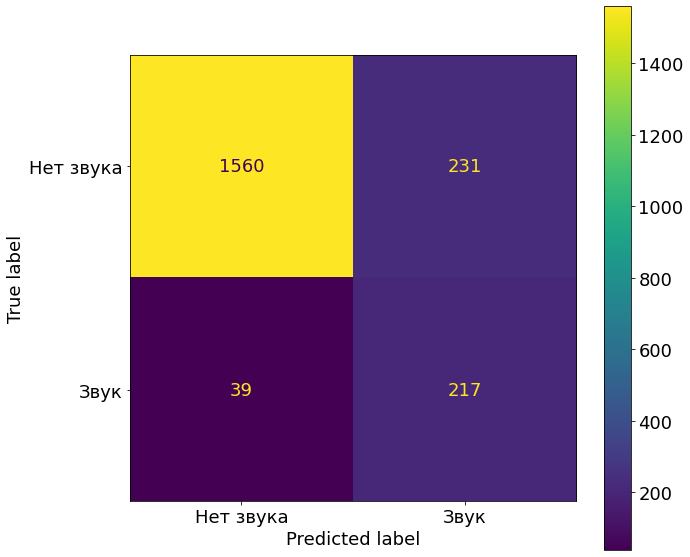

In [ ]:
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels = ['Нет звука', 'Звук'])
fig, ax = plt.subplots(figsize=(10,10))
disp.plot(ax = ax)
plt.rcParams.update({'font.size': 14})
plt.show()

Сопоставляем вероятности, начало и конец распознанных звуков относительно начала треков в тестовой выборке

In [ ]:
tracks = get_track(audio_test) # получаем номера треков

In [ ]:
kum_sum = kum_sum_range(lstOfTime_test) # получаем метки начала и конца треков относительно общей длины

In [ ]:
# получаем вероятности, средние вероятности, границы выделенных звуков относительно начала трека и номера треков
prob_y, prob_mean_y, indexes_by_tracks, indexes_by_start, numbers, quantities = recognizeProb(yPred, oneLst, tracks, kum_sum)

отфильтровываем целевые звуки и посылаем их на обработку автоэнкодером для того, чтобы определить точность звуков. После отправляем снова на класификатор - чтобы получить вероятности.

In [ ]:
# пример границ предсказанного сетью звука
indexes_by_start[0]

array([10, 16])

In [ ]:
# take a fragments of xTest what net recognize as a goal-sounds for giving to autoencoder
testToCheck = toCheck(test_a, indexes_by_start)

In [ ]:
testToCheck.shape

(16532, 40, 3)

In [ ]:
testTo = np.sum(testToCheck, axis = 2)
testTo.shape

(16532, 40)

In [ ]:
a = model_conv1d.predict(testTo)
a.shape

(16532, 40, 1)

In [ ]:
a = scalMM(np.squeeze(a))

In [ ]:
a.shape

(16532, 40)

In [ ]:
a1 = np.diff(a, n = 1, axis = 0)

In [ ]:
a2 = np.diff(a, n = 2, axis = 0)

In [ ]:
addd = np.reshape(a[0], (1, -1))

In [ ]:
a1 = np.vstack((addd, a1))
a1.shape

(16532, 40)

In [ ]:
a2 = np.vstack((addd, a2))
a2 = np.vstack((addd, a2))
a2.shape

(16532, 40)

In [ ]:
a = np.expand_dims(a, axis = 2)
a.shape

(16532, 40, 1)

In [ ]:
a1 = np.expand_dims(a1, axis = 2)
a1.shape

(16532, 40, 1)

In [ ]:
a2 = np.expand_dims(a2, axis = 2)
a2.shape

(16532, 40, 1)

In [ ]:
a_a = np.concatenate((a,a1,a2), axis = 2)
a_a.shape

(16532, 40, 3)

In [ ]:
# получаем чистоту звука - посылаем xTest на автоэнкодер,
# а потом - чтобы получить вероятности - снова на классификатор
clarity_of_sounds = model.predict(a_a)

Суммируем вероятности относительно количества единиц 

In [ ]:
# получаем просуммированные по длине распознанных звуков вероятности после автоэнкодера
clarity_numbers = check_to_numbers(clarity_of_sounds, quantities)

представляем в виде таблицы

In [ ]:
db = pd.DataFrame()
db['Track'] = numbers
db['Start and Stop'] = indexes_by_tracks
db['Probability, %'] = np.around(prob_mean_y, 4) * 100
db['After au, %'] = np.around(scalMM(clarity_numbers), 2) * 100
db['Difference, %'] = (scalMM(clarity_numbers) - prob_mean_y) * 100
db['Mean, %'] = np.around((scalMM(clarity_numbers) + prob_mean_y)/2, 4) * 100

In [ ]:
db.head(20)

,Track,Start and Stop,"Probability, %","After au, %","Difference, %","Mean, %"
0,0,"[5110, 8176]",82.560005,15.000001,-67.318855,48.899998
1,0,"[9198, 9709]",22.620001,0.000000,-22.624245,11.310000
2,1,"[2044, 2555]",52.259998,0.000000,-52.257442,26.129999
3,1,"[7665, 14819]",67.879997,0.000000,-67.877876,33.939999
4,1,"[15841, 16352]",33.709999,0.000000,-33.708157,16.850000
5,2,"[2044, 3577]",72.010002,0.000000,-72.012268,36.009998
6,2,"[7665, 10731]",72.169998,1.000000,-71.473312,36.439999
7,3,"[10731, 12775]",87.730003,0.000000,-87.629257,43.910000
8,3,"[15330, 15841]",21.969999,0.000000,-21.973831,10.990000
9,4,"[2044, 2555]",30.240000,0.000000,-30.243095,15.120000


Смотрим, какие звуки распознала сеть и как именно

In [ ]:
db_der = pd.read_csv('/content/drive/MyDrive/dz/pronounce/results_minmax_diff.csv')
db_opt = pd.read_csv('/content/drive/MyDrive/dz/pronounce/results_minmax.csv')

In [ ]:
# выбираем трек:
db_opt[db_opt['Track'] == 2]

,Track,Start and Stop,"Probability, %","After au, %","Difference, %","Mean, %"
4,2,"[1022, 3577]",57.930000,8.0,-50.185757,32.84
5,2,"[4599, 5110]",32.500000,2.0,-30.300028,17.35
6,2,"[7154, 10220]",59.140003,32.0,-27.560362,45.36


In [ ]:
db_der[db_der['Track'] == 2]

,Track,Start and Stop,"Probability, %","After au, %","Difference, %","Mean, %"
4,2,"[2044, 3577]",72.81,41.0,-31.426367,57.100000
5,2,"[8176, 10731]",93.24,39.0,-54.450850,66.009995


In [ ]:
db[db['Track'] == 2]

,Track,Start and Stop,"Probability, %","After au, %","Difference, %","Mean, %"
5,2,"[2044, 3577]",72.010002,0.0,-72.012268,36.009998
6,2,"[7665, 10731]",72.169998,1.0,-71.473312,36.439999


In [ ]:
# enter number of the track
# enter start and end of recognized sound
getPlayer(2, 8176, 10731, audio_test)

In [ ]:
# 0 - классификатор ещё меньше вероятности
# 1 трек - захватил лишнего, автоэнкодер не поддержал

In [ ]:
# также возможная ошибка - выбраны односложные слова по сходной модели. Возможно, модель примерно угадывает, где должна быть буква?

In [ ]:
db.to_csv('/content/drive/MyDrive/dz/pronounce/results_minmax_diff_big_squ.csv', index=False)

## MinMaxScaler, derivatives, classifier 3 dim, autoencoder 3 dim, conv1d classifier

In [ ]:
#model_conv1d = load_model('/content/drive/MyDrive/dz/mod/conv1dmfcc.h5', compile = True)

In [ ]:
#model = load_model('/content/drive/MyDrive/dz/mod/model_raw_mfcc40.h5', compile = True)

In [ ]:
#model.compile(optimizer=Adam(0.0001), loss='mean_squared_error') 

Получаем предсказание вероятностей, где расположены целевые звуки

In [ ]:
# to normalize a xTest
#test = scalMM(X_test_mfcc_i)

In [ ]:
#yPred = model.predict(test_a) # to predict of test data

In [ ]:
#np.save('/content/drive/MyDrive/dz/pronounce/yPred.npy', yPred)
#np.save('/content/drive/MyDrive/dz/pronounce/yPred_au.npy', yPred)

Создаём вектор, по которому будем отслеживать начало и конец распознанных звуков

In [ ]:
# take a 0-1 form from yPred and choose probability than merge true or false recognized sounds
merges = recognizeMerges(yPred, 0.2)

In [ ]:
#first track and recognized sounds when we see 1
merges[:28]

array([[0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [1.],
       [1.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.]], dtype=float32)

In [ ]:
# correct of oneLst from recognizeMerges(yPred) (maybe only for a long sounds but not for [d], [t] etc)
oneLst = fillOnes(merges)

Смотрим ошибку распознавания звуков

In [ ]:
err, errL = summaError(yLittleTest, oneLst, lstOfTime_test)

realy true recognized sounds: 108
recognized like true, but is false sounds: 101
recognized like false, but is true sounds: 148
realy false recognized souns: 1690
Word Recognition Rate (to differ sounds by no-sounds): 87.84 %
Word Error Rate (to differ no-sounds by sounds): 12.16 %
Accuracy (how model find a sounds): 0.52
Fullness (how model find a no-sounds): 0.42
Harmonical mean: 0.46


In [ ]:
cm = confusion_matrix(yLittleTest, oneLst)
print(cm)

[[1433  358]
 [  34  222]]


In [ ]:
cm = confusion_matrix(yLittleTest, oneLst)
print(cm)

[[2868  707]
 [  54  460]]


In [ ]:
cm = confusion_matrix(yLittleTest, oneLst)
print(cm)

[[1690  101]
 [ 148  108]]


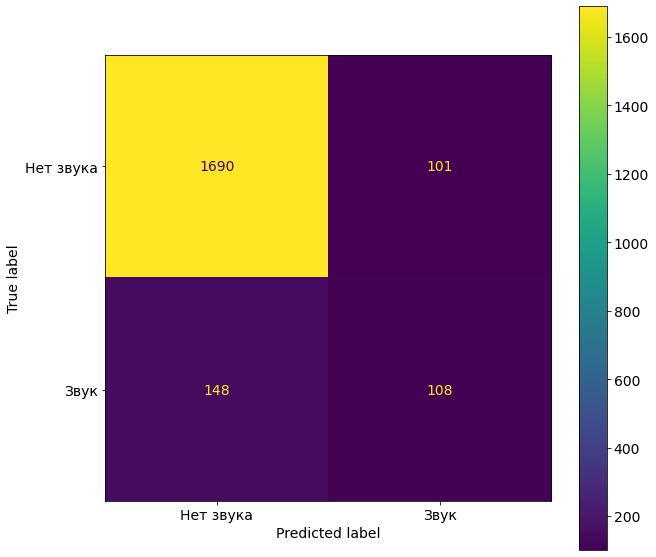

In [ ]:
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels = ['Нет звука', 'Звук'])
fig, ax = plt.subplots(figsize=(10,10))
disp.plot(ax = ax)
plt.rcParams.update({'font.size': 14})
plt.show()

Сопоставляем вероятности, начало и конец распознанных звуков относительно начала треков в тестовой выборке

In [ ]:
tracks = get_track(audio_test) # получаем номера треков

In [ ]:
kum_sum = kum_sum_range(lstOfTime_test) # получаем метки начала и конца треков относительно общей длины

In [ ]:
# получаем вероятности, средние вероятности, границы выделенных звуков относительно начала трека и номера треков
prob_y, prob_mean_y, indexes_by_tracks, indexes_by_start, numbers, quantities = recognizeProb(yPred, oneLst, tracks, kum_sum)

отфильтровываем целевые звуки и посылаем их на обработку автоэнкодером для того, чтобы определить точность звуков. После отправляем снова на класификатор - чтобы получить вероятности.

In [ ]:
# пример границ предсказанного сетью звука
indexes_by_start[0]

array([10, 16])

In [ ]:
# take a fragments of xTest what net recognize as a goal-sounds for giving to autoencoder
testToCheck = toCheck(test_a, indexes_by_start)

In [ ]:
a = model_conv1d.predict(testToCheck)
a.shape

In [ ]:
# получаем чистоту звука - посылаем xTest на автоэнкодер,
# а потом - чтобы получить вероятности - снова на классификатор
clarity_of_sounds = model.predict(model_conv1d.predict(testToCheck))

Суммируем вероятности относительно количества единиц 

In [ ]:
# получаем просуммированные по длине распознанных звуков вероятности после автоэнкодера
clarity_numbers = check_to_numbers(clarity_of_sounds, quantities)

представляем в виде таблицы

In [ ]:
db = pd.DataFrame()
db['Track'] = numbers
db['Start and Stop'] = indexes_by_tracks
db['Probability, %'] = np.around(prob_mean_y, 4) * 100
db['After au, %'] = np.around(scalMM(clarity_numbers), 2) * 100
db['Difference, %'] = (scalMM(clarity_numbers) - prob_mean_y) * 100
db['Mean, %'] = np.around((scalMM(clarity_numbers) + prob_mean_y)/2, 4) * 100

In [ ]:
db.head(20)

,Track,Start and Stop,"Probability, %","After au, %","Difference, %","Mean, %"
0,0,"[5110, 5621]",90.120003,0.0,-90.121964,45.060001
1,1,"[1533, 2555]",74.500000,1.0,-73.974731,37.509998
2,1,"[10731, 11753]",99.980003,0.0,-99.971748,49.990002
3,2,"[2044, 3577]",99.190002,0.0,-99.176422,49.599998
4,2,"[8687, 10220]",95.610001,0.0,-95.347305,47.940002
5,3,"[10731, 13286]",99.949997,1.0,-99.200264,50.349998
6,4,"[5621, 6643]",95.029999,0.0,-95.028893,47.520000
7,5,"[6132, 6643]",94.230003,0.0,-94.229469,47.110001
8,5,"[13286, 13797]",66.659996,0.0,-66.661774,33.329998
9,5,"[14819, 15330]",38.100002,0.0,-38.104313,19.050001


Смотрим, какие звуки распознала сеть и как именно

In [ ]:
db_der = pd.read_csv('/content/drive/MyDrive/dz/pronounce/results_minmax_diff.csv')
#db = pd.read_csv('/content/drive/MyDrive/dz/pronounce/results_minmax.csv')

In [ ]:
# выбираем трек:
db[db['Track'] == 1]

,Track,Start and Stop,"Probability, %","After au, %","Difference, %","Mean, %"
1,1,"[1533, 2555]",74.500000,1.0,-73.974731,37.509998
2,1,"[10731, 11753]",99.980003,0.0,-99.971748,49.990002


In [ ]:
db_der[db_der['Track'] == 1]

,Track,Start and Stop,"Probability, %","After au, %","Difference, %","Mean, %"
1,1,"[1533, 2044]",75.180000,2.0,-73.56119,38.40
2,1,"[7665, 12775]",58.960003,72.0,13.42622,65.67
3,1,"[13797, 14819]",61.900000,0.0,-61.83443,30.98


In [ ]:
# enter number of the track
# enter start and end of recognized sound
getPlayer(1, 10731, 11753, audio_test)

In [ ]:
# 0 - сильно заузил звук; автоэнкодер не поддерживает
# 1 - 

In [ ]:
# также возможная ошибка - выбраны односложные слова по сходной модели. Возможно, модель примерно угадывает, где должна быть буква?

In [ ]:
db.to_csv('/content/drive/MyDrive/dz/pronounce/results_minmax_diff_conv.csv', index=False)

# Results of tests

In [ ]:
bd = pd.read_csv('/content/drive/MyDrive/dz/pronounce/results.csv')

In [ ]:
bd

,net,type,"accuracy, %","time, s",visibility
0,Dense,stft accur,92.95,34.0,1.0
1,Dense,mfcc accur,95.15,26.0,1.0
2,Dense,chroma_stft accur,95.15,26.0,0.0
3,Dense,accur,90.14,20.0,0.5
4,Dense,zero cross rating,89.95,54.0,0.0
5,Dense,rmse,89.97,19.0,0.0
6,Dense,spec cent,89.67,19.0,0.0
7,Dense,roll off,89.37,19.0,0.0
8,Dense,"rmse, spec cent, roll off",91.30,19.0,0.0
9,Dense,"chr stft, chrg, rmse, spec, roll",92.17,20.0,1.0


In [ ]:
bd.loc[len(bd)] = ['Dense', 'stft', 87.32, 27, 0, 30]

In [ ]:
bd.loc[len(bd)] = ['Dense', 'stft', 87.49, 22, 0, 120]

In [ ]:
bd.loc[len(bd)] = ['Dense', 'stft', 87.80, 25, 0, 150]

In [ ]:
bd['autoencoder'][12] = 120


In [ ]:
bd

,net,type,"accuracy, %","time, s",visibility,autoencoder
0,Dense,stft,92.95,34.0,1.0,0
1,Dense,mfcc 36,95.15,26.0,1.0,0
2,Dense,chroma stft,95.15,26.0,0.0,0
3,Dense,chromagram,90.14,20.0,0.5,0
4,Dense,zero cross rating,89.95,54.0,0.0,0
5,Dense,rmse,89.97,19.0,0.0,0
6,Dense,spec cent,89.67,19.0,0.0,0
7,Dense,roll off,89.37,19.0,0.0,0
8,Dense,"rmse, spec cent, roll off",91.30,19.0,0.0,0
9,Dense,"chr stft, chrg, rmse, spec, roll",92.17,20.0,1.0,0


In [ ]:
bd.to_csv('/content/drive/MyDrive/dz/pronounce/results.csv', index=False)